<img width="400" style="float:left"
     src="https://th.bing.com/th/id/OIP.Tex2VRlESWpswrJ7eVn3pAHaET?rs=1&pid=ImgDetMain" />`

# BCG X - Final Capstone Project

Bernardo Santos | Max Uebele | Alessio Mastropietro | Mohamed Atwa | Rafaella Jereissati | Yupeng Chen

Febuary 14th, 2025

This notebook is organized in the following sections:

- [Description](#description)
- [Open and View Datasets](#open-and-view-datasets)
* [Initial Analysis and Data Cleaning](#2)
  * [Assessing data types (transforming variables into datetime)](#2.1)
  * [Checking for nulls](#2.2)
  * [Data Frame Activity_Data](#2.3)
  * [Data Frame Client_Data](#2.4)
  * [Data Frame Complaints_Data](#2.5)
  * [Merging the Dataframes](#2.6)
* [Exploratory Data Analysis 1.0](#3)
  * [Preparatory Steps](#3.1)
  * [Distribution Metrics](#3.2)
  * [Usage Patterns](#3.3)
  * [Churn Analysis](#3.4)
  * [Complaint Analysis](#3.5)
* [Model Development](#4)
  * [Pycaret](#3.1)
  * [Neural Network](#3.2)
  * [DQN (Development Phase)](#3.3)

## Description

This project develops a machine learning framework to predict telecom customer churn by integrating structured data with complaint text analysis. Unlike traditional approaches, it focuses on revenue maximization through tailored upselling and dynamic discounts. Using NLP, ensemble models, and Shapley values for interpretability, it ensures robust, data-driven segmentation. The platform-agnostic design enhances adaptability, with future work exploring reinforcement learning for optimized retention strategies.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.listdir("/content/drive/Shareddrives/BCG X Capstone - N°1/Data")

['customer_data.csv', 'activity_data.csv', 'complaints.xlsx']

## Open and View Datasets

In [ ]:
# Modify if different

path_activity = "/content/drive/Shareddrives/BCG X Capstone - N°1/Data/activity_data.csv"
path_customer = "/content/drive/Shareddrives/BCG X Capstone - N°1/Data/customer_data.csv"
path_complaints = "/content/drive/Shareddrives/BCG X Capstone - N°1/Data/complaints.xlsx"

In [ ]:
import pandas as pd

# Loading files
activity_data = pd.read_csv(path_activity)
customer_data = pd.read_csv(path_customer)
complaints_data = pd.read_excel(path_complaints)

In [ ]:
# Unify column name convention

activity_data.columns = activity_data.columns.str.lower().str.replace(' ', '_', regex=False)
customer_data.columns = customer_data.columns.str.lower().str.replace(' ', '_', regex=False)
complaints_data.columns = complaints_data.columns.str.lower().str.replace(' ', '_', regex=False)

In [ ]:
# Displaying the first 5 rows of each DataFrame
print("Activity Data:")
print(activity_data.head())

print("Customer Data:")
print(customer_data.head())

print("Complaints:")
print(complaints_data.head())

Activity Data:
   customer_id      month  data_usage  phone_usage  use_app
0        10000  1/01/2021       43.61      4570.12        1
1        10001  1/01/2021        2.07      2038.61        0
2        10002  1/01/2021       45.69      1786.97        1
3        10003  1/01/2021       45.70      2450.95        1
4        10004  1/01/2021       15.28      4627.57        1
Customer Data:
   customer_id  birth_date   join_date      plan_type  churn_in_3mos
0        10000  1994-08-13  2015-11-22       postpaid              0
1        10001  1994-06-25  2015-01-12  pay-as-you-go              1
2        10002  2008-06-10  2020-05-22        prepaid              0
3        10003  1970-09-04  2017-11-10        prepaid              0
4        10004  1969-11-06  2019-05-19        prepaid              0
Complaints:
   customer_id                                          complaint  \
0        17256  Subject: Official Complaint.\n\n    The unders...   
1        18490  Subject: Official Complaint.\n

## Initial Analysis and Data Cleaning

There are some issues with the data, on first glass we suggest solving them by:
- Check for Nulls
- Look into datatypes and handle datetime data types
- Merging the data with the index customer_ID requires handling the month variable in order to not replicate rows: OHE
- One Hot Encode the variable plan_type
- Create new variables for average data_usage and average_phone usage
- Create new variables for age at joint_date and Years_On_Plan (01/2022 - Joint_date)

### Assessing data types (transforming variables into datetime)

In [ ]:
# Initial data type check
print("Activity Data Types:")
print(activity_data.dtypes)

print("Customer Data Types:")
print(customer_data.dtypes)

print("Complaints Data Types:")
print(complaints_data.dtypes)

Activity Data Types:
customer_id      int64
month           object
data_usage     float64
phone_usage    float64
use_app          int64
dtype: object
Customer Data Types:
customer_id       int64
birth_date       object
join_date        object
plan_type        object
churn_in_3mos     int64
dtype: object
Complaints Data Types:
customer_id     int64
complaint      object
category       object
dtype: object


In [ ]:
# Convert date columns to datetime format
activity_data['month'] = pd.to_datetime(activity_data['month'], dayfirst=True)
customer_data['birth_date'] = pd.to_datetime(customer_data['birth_date'])
customer_data['join_date'] = pd.to_datetime(customer_data['join_date'])

The first step of the data cleaning is composed of converting the dates into the correct data type: datetime

In [ ]:
# Initial check if number of rows and customer_IDs are identical
activity_in_customer = set(activity_data["customer_id"]).issubset(set(customer_data["customer_id"]))
print("All customer IDs in activity_data are in customer_data:", activity_in_customer)

All customer IDs in activity_data are in customer_data: True


### Checking for nulls

In [ ]:
# Checking for nulls in Activity Data
print("Missing values in Activity Data:")
print(activity_data.isnull().sum())

# Checking for nulls in Customer Data
print("Missing values in Customer Data:")
print(customer_data.isnull().sum())

# Checking for nulls in Customer Data
print("Missing values in Customer Data:")
print(complaints_data.isnull().sum())

Missing values in Activity Data:
customer_id    0
month          0
data_usage     0
phone_usage    0
use_app        0
dtype: int64
Missing values in Customer Data:
customer_id      0
birth_date       0
join_date        0
plan_type        0
churn_in_3mos    0
dtype: int64
Missing values in Customer Data:
customer_id    0
complaint      0
category       0
dtype: int64


No nulls, we can proceed, in case there are nulls they must be addressed.

### Data Frame Activity_Data

In [ ]:
print(activity_data.head())

   customer_id      month  data_usage  phone_usage  use_app
0        10000 2021-01-01       43.61      4570.12        1
1        10001 2021-01-01        2.07      2038.61        0
2        10002 2021-01-01       45.69      1786.97        1
3        10003 2021-01-01       45.70      2450.95        1
4        10004 2021-01-01       15.28      4627.57        1


In [ ]:
# Checking the number of rows, after an initial analysis it appears that each customer has a seperate line per month
num_rows = activity_data.shape[0]
print(f"Number of rows in activity_data: {num_rows}")

# This is indeed the case

Number of rows in activity_data: 120000


#### OHE the column Month to prevent duplicated rows when merging

In [ ]:
# Create a pivot table
activity_pivot = activity_data.pivot_table(
    index='customer_id',
    columns='month',
    values=['data_usage', 'phone_usage', 'use_app'],
    aggfunc='first'
)

# Flatten the MultiIndex in columns and format them as 'metric_monthname'
activity_pivot.columns = ['{}_{}'.format(metric, month) for metric, month in activity_pivot.columns]

# Define the correct order of months
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

# Reorder columns based on month order
month_columns = sorted([col for col in activity_pivot.columns if any(m in col for m in month_order)],
                       key=lambda x: month_order.index(x.split('_')[-1]))

# Keep customer_id at the start
other_columns = [col for col in activity_pivot.columns if col not in month_columns]

# Reassign columns in the correct order
activity_pivot = activity_pivot[other_columns + month_columns]

# Reset index to make 'customer_id' a column again, if it is set as index
activity_pivot.reset_index(inplace=True)

# Display the first few rows
print(activity_pivot.head())


   customer_id  data_usage_2021-01-01 00:00:00  \
0        10000                           43.61   
1        10001                            2.07   
2        10002                           45.69   
3        10003                           45.70   
4        10004                           15.28   

   data_usage_2021-02-01 00:00:00  data_usage_2021-03-01 00:00:00  \
0                          115.97                           84.20   
1                           13.87                           12.11   
2                           40.34                           33.78   
3                           27.05                           22.06   
4                           40.19                           27.20   

   data_usage_2021-04-01 00:00:00  data_usage_2021-05-01 00:00:00  \
0                           80.87                           66.45   
1                            3.40                           12.22   
2                           14.24                           38.86   
3       

In [ ]:
# Count the number of rows
activity_data = activity_pivot
num_rows = activity_data.shape[0]
print(f"Number of rows in activity_pivot: {num_rows}")

Number of rows in activity_pivot: 10000


In [ ]:
activity_data

,customer_id,data_usage_2021-01-01 00:00:00,data_usage_2021-02-01 00:00:00,data_usage_2021-03-01 00:00:00,data_usage_2021-04-01 00:00:00,data_usage_2021-05-01 00:00:00,data_usage_2021-06-01 00:00:00,data_usage_2021-07-01 00:00:00,data_usage_2021-08-01 00:00:00,data_usage_2021-09-01 00:00:00,...,use_app_2021-03-01 00:00:00,use_app_2021-04-01 00:00:00,use_app_2021-05-01 00:00:00,use_app_2021-06-01 00:00:00,use_app_2021-07-01 00:00:00,use_app_2021-08-01 00:00:00,use_app_2021-09-01 00:00:00,use_app_2021-10-01 00:00:00,use_app_2021-11-01 00:00:00,use_app_2021-12-01 00:00:00
0,10000,43.61,115.97,84.20,80.87,66.45,34.89,67.70,107.80,105.42,...,0,1,0,0,1,1,1,1,1,0
1,10001,2.07,13.87,12.11,3.40,12.22,21.06,4.29,10.17,21.43,...,1,1,1,1,1,1,1,1,1,1
2,10002,45.69,40.34,33.78,14.24,38.86,57.87,46.47,56.30,7.10,...,1,0,0,1,0,0,1,1,1,1
3,10003,45.70,27.05,22.06,56.30,44.92,3.72,40.69,39.77,9.22,...,1,1,1,0,1,1,1,1,1,1
4,10004,15.28,40.19,27.20,17.89,48.10,41.49,43.77,42.63,42.63,...,0,1,1,1,1,1,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,19995,14.00,49.02,12.45,16.86,40.69,23.24,48.56,52.59,43.13,...,0,0,1,1,1,1,1,0,1,1
9996,19996,2.66,56.19,16.14,57.52,29.36,2.60,39.34,54.25,47.30,...,1,1,1,1,1,1,0,1,1,1
9997,19997,86.61,67.07,34.62,115.72,103.32,75.41,105.82,119.86,73.28,...,1,0,1,0,1,1,1,1,1,1
9998,19998,35.92,52.72,49.01,36.30,104.63,20.36,91.72,16.12,94.87,...,1,1,1,0,1,1,1,0,1,0


### Data Frame Client_Data

#### OHE the column plan_type

First we need to check how many unique values are there on the column plan_type

In [ ]:
# Count unique values in plan_type column
unique_values = customer_data['plan_type'].value_counts()

# Display results
print("Unique values in 'plan_type' and their counts:")
print(unique_values)

Unique values in 'plan_type' and their counts:
plan_type
prepaid          7040
postpaid         1973
pay-as-you-go     987
Name: count, dtype: int64


In [ ]:
# Apply One-Hot Encoding (OHE) to the 'plan_type' column
customer_data = pd.get_dummies(customer_data, columns=['plan_type'], prefix='plan')

# Display the transformed dataset
print(customer_data.head())  # Show the first few rows

   customer_id birth_date  join_date  churn_in_3mos  plan_pay-as-you-go  \
0        10000 1994-08-13 2015-11-22              0               False   
1        10001 1994-06-25 2015-01-12              1                True   
2        10002 2008-06-10 2020-05-22              0               False   
3        10003 1970-09-04 2017-11-10              0               False   
4        10004 1969-11-06 2019-05-19              0               False   

   plan_postpaid  plan_prepaid  
0           True         False  
1          False         False  
2          False          True  
3          False          True  
4          False          True  


#### Creating new variables for the Client Data Frame

Variable: Age when client joined the plan

In [ ]:
# Calculate age when joined
customer_data['age_at_joining'] = (customer_data['join_date'] - customer_data['birth_date']).dt.days // 365

# Display the updated dataset
print(customer_data.head())  # Show first few rows

   customer_id birth_date  join_date  churn_in_3mos  plan_pay-as-you-go  \
0        10000 1994-08-13 2015-11-22              0               False   
1        10001 1994-06-25 2015-01-12              1                True   
2        10002 2008-06-10 2020-05-22              0               False   
3        10003 1970-09-04 2017-11-10              0               False   
4        10004 1969-11-06 2019-05-19              0               False   

   plan_postpaid  plan_prepaid  age_at_joining  
0           True         False              21  
1          False         False              20  
2          False          True              11  
3          False          True              47  
4          False          True              49  


Variable: Years on the plan (Present Day - 01/01/2022)

In [ ]:
from datetime import datetime

# Define reference date (January 1, 2022)
reference_date = datetime(2022, 1, 1)

# Calculate years on plan
customer_data['years_on_plan'] = (reference_date - customer_data['join_date']).dt.days // 365

# Display the updated dataset
print(customer_data.head())  # Show first few rows

   customer_id birth_date  join_date  churn_in_3mos  plan_pay-as-you-go  \
0        10000 1994-08-13 2015-11-22              0               False   
1        10001 1994-06-25 2015-01-12              1                True   
2        10002 2008-06-10 2020-05-22              0               False   
3        10003 1970-09-04 2017-11-10              0               False   
4        10004 1969-11-06 2019-05-19              0               False   

   plan_postpaid  plan_prepaid  age_at_joining  years_on_plan  
0           True         False              21              6  
1          False         False              20              6  
2          False          True              11              1  
3          False          True              47              4  
4          False          True              49              2  


### Data Frame Complaint Data

In [ ]:
pd.set_option('display.max_colwidth', None)
complaints_data.head()

,customer_id,complaint,category
0,17256,"Subject: Official Complaint.\n\n The undersigned, customer with code 17256, is submitting an official complaint regarding the service. For the past few weeks, I have encountered the following issue: My internet connection has been unreliable, frequently dropping at critical moments..\n \n Despite reaching out to customer support multiple times, the issue remains unresolved. This situation has greatly impacted my ability to carry out work from home.\n \n I kindly request that you take immediate action to resolve this issue and provide a definitive solution.\n \n I look forward to your prompt response.",Connection Problem
1,18490,"Subject: Official Complaint.\n\n The undersigned, customer with code 18490, is submitting an official complaint regarding the service. For the past few weeks, I have encountered the following issue: My internet service was down for an entire day, and I received no communication from customer service..\n \n Despite reaching out to customer support multiple times, the issue remains unresolved. The lack of resolution is causing frustration and affecting my usage of the service.\n \n I kindly request that you take immediate action to resolve this issue and provide a definitive solution.\n \n I look forward to your prompt response.",Service Disruption
2,14439,"Subject: Official Complaint.\n\n The undersigned, customer with code 14439, is submitting an official complaint regarding the service. For the past few weeks, I have encountered the following issue: There are charges on my bill that I don’t recognize, and customer service has not taken any meaningful steps to resolve the issue..\n \n Despite reaching out to customer support multiple times, the issue remains unresolved. This ongoing problem has caused significant disruptions to my daily activities.\n \n I kindly request that you take immediate action to resolve this issue and provide a definitive solution.\n \n I look forward to your prompt response.",Billing Issue
3,18777,"Subject: Official Complaint.\n\n The undersigned, customer with code 18777, is submitting an official complaint regarding the service. For the past few weeks, I have encountered the following issue: I’ve experienced several service interruptions in the past few weeks, making it difficult to rely on your service..\n \n Despite reaching out to customer support multiple times, the issue remains unresolved. The lack of resolution is causing frustration and affecting my usage of the service.\n \n I kindly request that you take immediate action to resolve this issue and provide a definitive solution.\n \n I look forward to your prompt response.",Service Disruption
4,16143,"Subject: Official Complaint.\n\n The undersigned, customer with code 16143, is submitting an official complaint regarding the service. For the past few weeks, I have encountered the following issue: Despite upgrading to a higher-speed plan, the connection remains slow and unreliable..\n \n Despite reaching out to customer support multiple times, the issue remains unresolved. This situation has greatly impacted my ability to carry out work from home.\n \n I kindly request that you take immediate action to resolve this issue and provide a definitive solution.\n \n I look forward to your prompt response.",Connection Problem


In [ ]:
pd.reset_option('display.max_colwidth')

The messages appear heavily standarized, changing only in some parts. Less assess that further.

In [ ]:
complaints_data.shape

(3500, 3)

In [ ]:
complaints_data['customer_id'].nunique()

3500

We have 3500 complaints, each of them filed by a different customer. Let's extract the non standarized parts of the complaints to better work with them.

In [ ]:
# Regex to capture text after "issue:" until the next sentence
complaints_data['issue'] = complaints_data['complaint'].str.extract(r'issue: (.*?)(\.|\n)', expand=False)[0]

# Regex to capture text after "unresolved. " until the first newline
complaints_data['action_required'] = complaints_data['complaint'].str.extract(r'unresolved\. (.*?)(\.|\n)', expand=False)[0]

# Normalize the text: Replace '\n' and multiple spaces with a single space
complaints_data['complaint'] = complaints_data['complaint'].str.replace(r'\s+', ' ', regex=True).str.strip()

# Extract 'introduction_1': Text until just before the 5-digit number
complaints_data['introduction_1'] = complaints_data['complaint'].str.extract(r'^(.*?customer with code )', expand=False)

complaints_data['customer_id_2'] = complaints_data['complaint'].str.extract(r'code (\d{5})', expand=False)

# Extract 'introduction_2': Text from "code <5 digits>, " to "issue :"
complaints_data['introduction_2'] = complaints_data['complaint'].str.extract(r'code \d{5}, (.*?) issue:', expand=False)

# Refined regex to extract 'bridge', ensuring it starts with the specific phrase
complaints_data['bridge'] = complaints_data['complaint'].str.extract(
    r'(Despite reaching out to customer support.*?unresolved\.)', expand=False
)

# Extract 'ending': Text starting with "I kindly" and ending with "prompt response."
complaints_data['ending'] = complaints_data['complaint'].str.extract(r'(I kindly.*?prompt response\.)', expand=False)

complaints_data.head()

,customer_id,complaint,category,issue,action_required,introduction_1,customer_id_2,introduction_2,bridge,ending
0,17256,"Subject: Official Complaint. The undersigned, ...",Connection Problem,"My internet connection has been unreliable, fr...",This situation has greatly impacted my ability...,"Subject: Official Complaint. The undersigned, ...",17256,is submitting an official complaint regarding ...,Despite reaching out to customer support multi...,I kindly request that you take immediate actio...
1,18490,"Subject: Official Complaint. The undersigned, ...",Service Disruption,My internet service was down for an entire day...,The lack of resolution is causing frustration ...,"Subject: Official Complaint. The undersigned, ...",18490,is submitting an official complaint regarding ...,Despite reaching out to customer support multi...,I kindly request that you take immediate actio...
2,14439,"Subject: Official Complaint. The undersigned, ...",Billing Issue,There are charges on my bill that I don’t reco...,This ongoing problem has caused significant di...,"Subject: Official Complaint. The undersigned, ...",14439,is submitting an official complaint regarding ...,Despite reaching out to customer support multi...,I kindly request that you take immediate actio...
3,18777,"Subject: Official Complaint. The undersigned, ...",Service Disruption,I’ve experienced several service interruptions...,The lack of resolution is causing frustration ...,"Subject: Official Complaint. The undersigned, ...",18777,is submitting an official complaint regarding ...,Despite reaching out to customer support multi...,I kindly request that you take immediate actio...
4,16143,"Subject: Official Complaint. The undersigned, ...",Connection Problem,"Despite upgrading to a higher-speed plan, the ...",This situation has greatly impacted my ability...,"Subject: Official Complaint. The undersigned, ...",16143,is submitting an official complaint regarding ...,Despite reaching out to customer support multi...,I kindly request that you take immediate actio...


Now we can check if the brackets we suppose to be stanradized (introductions_1, customer_id_2, introduction_2, bridge and ending) are consistent throughout all complaints to delete them.

In [ ]:
# Check for mismatches in customer_id

complaints_data['id_check'] = complaints_data.apply(
    lambda row: 1 if row['customer_id'] == row['customer_id_2'] else 0, axis=1
)

# Check if 'id_check' has only one unique value
if complaints_data['id_check'].nunique() == 1:
    # Drop the 'id_check' and 'customer_id_2' columns
    complaints_data = complaints_data.drop(columns=['id_check', 'customer_id_2'])

In [ ]:
# Step 1: Create a list of columns to exclude
columns_to_exclude = ["customer_id", "category", "issue", "action_required"]

# Create a list of all other columns
remaining_columns = [col for col in complaints_data.columns if col not in columns_to_exclude]

# Step 2: Drop columns that have only one unique value
columns_to_drop = [col for col in remaining_columns if complaints_data[col].nunique() <= 1]
complaints_data = complaints_data.drop(columns=columns_to_drop)

complaints_data = complaints_data.drop(columns=['complaint'])

# Display the remaining columns
print("Remaining columns:", complaints_data.columns.tolist())

Remaining columns: ['customer_id', 'category', 'issue', 'action_required']


The standarized parts have successfully been deleted.

In [ ]:
complaints_data.head()

,customer_id,category,issue,action_required
0,17256,Connection Problem,"My internet connection has been unreliable, fr...",This situation has greatly impacted my ability...
1,18490,Service Disruption,My internet service was down for an entire day...,The lack of resolution is causing frustration ...
2,14439,Billing Issue,There are charges on my bill that I don’t reco...,This ongoing problem has caused significant di...
3,18777,Service Disruption,I’ve experienced several service interruptions...,The lack of resolution is causing frustration ...
4,16143,Connection Problem,"Despite upgrading to a higher-speed plan, the ...",This situation has greatly impacted my ability...


In [ ]:
complaints_data['category'].value_counts()

,count
category,
Billing Issue,770
Connection Problem,750
Unauthorized Charges,748
Service Disruption,728
Promotional Issue,504


In [ ]:
pd.set_option('display.max_colwidth', None)
complaints_data.head()

,customer_id,category,issue,action_required
0,17256,Connection Problem,"My internet connection has been unreliable, frequently dropping at critical moments",This situation has greatly impacted my ability to carry out work from home
1,18490,Service Disruption,"My internet service was down for an entire day, and I received no communication from customer service",The lack of resolution is causing frustration and affecting my usage of the service
2,14439,Billing Issue,"There are charges on my bill that I don’t recognize, and customer service has not taken any meaningful steps to resolve the issue",This ongoing problem has caused significant disruptions to my daily activities
3,18777,Service Disruption,"I’ve experienced several service interruptions in the past few weeks, making it difficult to rely on your service",The lack of resolution is causing frustration and affecting my usage of the service
4,16143,Connection Problem,"Despite upgrading to a higher-speed plan, the connection remains slow and unreliable",This situation has greatly impacted my ability to carry out work from home


In [ ]:
complaints_data['issue'].value_counts()

,count
issue,
"I feel misled by the promotional offers made when I joined, as none of them have been honored",64
"I was told that I would receive a discount for the first six months, but it has never appeared on my bill",61
"The internet service was down briefly, but the issue was resolved promptly by customer support",61
"I had an issue with my bill last month, but customer service quickly resolved the matter and refunded the charge",60
"I was charged incorrectly, but customer support issued a refund, and the issue was resolved",59
...,...
"For the past few months, my bills have included unexplained charges",41
The support team handled an unauthorized charge on my account and issued a refund promptly,40
"My internet service was down for an entire day, and I received no communication from customer service",39


In [ ]:
complaints_data.groupby('category')['action_required'].value_counts()

category              action_required                                                                                      
Billing Issue         As a result of this issue, I have missed important deadlines and have experienced major inconvenience    203
                      The lack of resolution is causing frustration and affecting my usage of the service                      196
                      This ongoing problem has caused significant disruptions to my daily activities                           191
                      This situation has greatly impacted my ability to carry out work from home                               180
Connection Problem    This ongoing problem has caused significant disruptions to my daily activities                           208
                      The lack of resolution is causing frustration and affecting my usage of the service                      191
                      This situation has greatly impacted my ability to carry out work from home                               176
                      As a result of this issue, I have missed important deadlines and have experienced major inconvenience    175
Promotional Issue     This situation has greatly impacted my ability to carry out work from home                               140
                      As a result of this issue, I have missed important deadlines and have experienced major inconvenience    129
                      This ongoing problem has caused significant disruptions to my daily activities                           119
                      The lack of resolution is causing frustration and affecting my usage of the service                      116
Service Disruption    As a result of this issue, I have missed important deadlines and have experienced major inconvenience    187
                      This situation has greatly impacted my ability to carry out work from home                               186
                      This ongoing problem has caused significant disruptions to my daily activities                           182
                      The lack of resolution is causing frustration and affecting my usage of the service                      173
Unauthorized Charges  As a result of this issue, I have missed important deadlines and have experienced major inconvenience    198
                      This situation has greatly impacted my ability to carry out work from home                               187
                      This ongoing problem has caused significant disruptions to my daily activities                           187
                      The lack of resolution is causing frustration and affecting my usage of the service                      176
Name: count, dtype: int64

In [ ]:
complaints_data[['category','issue','action_required']].head(30)

,category,issue,action_required
0,Connection Problem,"My internet connection has been unreliable, frequently dropping at critical moments",This situation has greatly impacted my ability to carry out work from home
1,Service Disruption,"My internet service was down for an entire day, and I received no communication from customer service",The lack of resolution is causing frustration and affecting my usage of the service
2,Billing Issue,"There are charges on my bill that I don’t recognize, and customer service has not taken any meaningful steps to resolve the issue",This ongoing problem has caused significant disruptions to my daily activities
3,Service Disruption,"I’ve experienced several service interruptions in the past few weeks, making it difficult to rely on your service",The lack of resolution is causing frustration and affecting my usage of the service
4,Connection Problem,"Despite upgrading to a higher-speed plan, the connection remains slow and unreliable",This situation has greatly impacted my ability to carry out work from home
5,Connection Problem,"My internet connection has been unreliable, frequently dropping at critical moments",This situation has greatly impacted my ability to carry out work from home
6,Billing Issue,"Every month, I see erroneous charges for services I did not authorize",This situation has greatly impacted my ability to carry out work from home
7,Service Disruption,"My phone service was disconnected without warning, and it took several days to get it restored",This ongoing problem has caused significant disruptions to my daily activities
8,Unauthorized Charges,There are unauthorized charges on my account for services I did not sign up for,This ongoing problem has caused significant disruptions to my daily activities
9,Service Disruption,"The service was interrupted last week, and I was left without access to essential services",This situation has greatly impacted my ability to carry out work from home


### Merging the Dataframes

 Checking if number of rows is the same on both data frames

In [ ]:
# Variables for number of rows
activity_rows = activity_data.shape[0]
customer_rows = customer_data.shape[0]

print(f"Number of rows in Activity Data: {activity_rows}")
print(f"Number of rows in Customer Data: {customer_rows}")

# Checking number of rows for both
if activity_rows == customer_rows:
    print("\n The number of rows is the same in both datasets.")
else:
    print("\n The number of rows is different between the datasets.")

Number of rows in Activity Data: 10000
Number of rows in Customer Data: 10000

 The number of rows is the same in both datasets.


In [ ]:
# Checking if the customer_id column is identical, as it is going to be set as index
if set(activity_data['customer_id']) == set(customer_data['customer_id']):
    print("\n The customer_id values are identical in both datasets. ✅")
else:
    print("\n The customer_id values are NOT identical in both datasets.")



 The customer_id values are identical in both datasets. ✅


#### Merging

In [ ]:
customer_data.head()

,customer_id,birth_date,join_date,churn_in_3mos,plan_pay-as-you-go,plan_postpaid,plan_prepaid,age_at_joining,years_on_plan
0,10000,1994-08-13,2015-11-22,0,False,True,False,21,6
1,10001,1994-06-25,2015-01-12,1,True,False,False,20,6
2,10002,2008-06-10,2020-05-22,0,False,False,True,11,1
3,10003,1970-09-04,2017-11-10,0,False,False,True,47,4
4,10004,1969-11-06,2019-05-19,0,False,False,True,49,2


In [ ]:
activity_data.head()

,customer_id,data_usage_2021-01-01 00:00:00,data_usage_2021-02-01 00:00:00,data_usage_2021-03-01 00:00:00,data_usage_2021-04-01 00:00:00,data_usage_2021-05-01 00:00:00,data_usage_2021-06-01 00:00:00,data_usage_2021-07-01 00:00:00,data_usage_2021-08-01 00:00:00,data_usage_2021-09-01 00:00:00,...,use_app_2021-03-01 00:00:00,use_app_2021-04-01 00:00:00,use_app_2021-05-01 00:00:00,use_app_2021-06-01 00:00:00,use_app_2021-07-01 00:00:00,use_app_2021-08-01 00:00:00,use_app_2021-09-01 00:00:00,use_app_2021-10-01 00:00:00,use_app_2021-11-01 00:00:00,use_app_2021-12-01 00:00:00
0,10000,43.61,115.97,84.20,80.87,66.45,34.89,67.70,107.80,105.42,...,0,1,0,0,1,1,1,1,1,0
1,10001,2.07,13.87,12.11,3.40,12.22,21.06,4.29,10.17,21.43,...,1,1,1,1,1,1,1,1,1,1
2,10002,45.69,40.34,33.78,14.24,38.86,57.87,46.47,56.30,7.10,...,1,0,0,1,0,0,1,1,1,1
3,10003,45.70,27.05,22.06,56.30,44.92,3.72,40.69,39.77,9.22,...,1,1,1,0,1,1,1,1,1,1
4,10004,15.28,40.19,27.20,17.89,48.10,41.49,43.77,42.63,42.63,...,0,1,1,1,1,1,0,1,0,1


In [ ]:
complaints_data.head()

,customer_id,category,issue,action_required
0,17256,Connection Problem,"My internet connection has been unreliable, frequently dropping at critical moments",This situation has greatly impacted my ability to carry out work from home
1,18490,Service Disruption,"My internet service was down for an entire day, and I received no communication from customer service",The lack of resolution is causing frustration and affecting my usage of the service
2,14439,Billing Issue,"There are charges on my bill that I don’t recognize, and customer service has not taken any meaningful steps to resolve the issue",This ongoing problem has caused significant disruptions to my daily activities
3,18777,Service Disruption,"I’ve experienced several service interruptions in the past few weeks, making it difficult to rely on your service",The lack of resolution is causing frustration and affecting my usage of the service
4,16143,Connection Problem,"Despite upgrading to a higher-speed plan, the connection remains slow and unreliable",This situation has greatly impacted my ability to carry out work from home


In [ ]:
# Ensure customer_id is the index for merging, only set if not already
if 'customer_id' not in activity_data.index.names:
    activity_data.set_index('customer_id', inplace=True)
if 'customer_id' not in customer_data.index.names:
    customer_data.set_index('customer_id', inplace=True)
if 'customer_id' not in complaints_data.index.names:
    complaints_data.set_index('customer_id', inplace=True)

# Merge the datasets on customer_id which is set as index
merged_data_intermediate = customer_data.merge(activity_data, left_index=True, right_index=True, how='left')

# Since complaints_data is indexed by customer_id, use left_index and right_index for merging
complaints_data['complaint'] = 1  # Flag for complaint presence
merged_data = pd.merge(
    merged_data_intermediate,
    complaints_data[['complaint', 'category', 'issue', 'action_required']],
    left_index=True,
    right_index=True,
    how='left'
)

# Fill NaN values for 'complaint' with 0 to indicate no complaints where there is no match
merged_data['complaint'].fillna(0, inplace=True)
merged_data['complaint'] = merged_data['complaint'].astype(int)

# Handle NaN values for other merged columns if needed
merged_data['issue'].fillna('No issue', inplace=True)
merged_data['action_required'].fillna('No action required', inplace=True)

# Reset index if needed (to keep customer_id as a column)
merged_data.reset_index(inplace=True)

# Display the merged dataset
print(f"Number of rows in merged dataset: {merged_data.shape[0]}")
print(merged_data.head())  # Show the first few rows

Number of rows in merged dataset: 10000
   customer_id birth_date  join_date  churn_in_3mos  plan_pay-as-you-go  \
0        10000 1994-08-13 2015-11-22              0               False   
1        10001 1994-06-25 2015-01-12              1                True   
2        10002 2008-06-10 2020-05-22              0               False   
3        10003 1970-09-04 2017-11-10              0               False   
4        10004 1969-11-06 2019-05-19              0               False   

   plan_postpaid  plan_prepaid  age_at_joining  years_on_plan  \
0           True         False              21              6   
1          False         False              20              6   
2          False          True              11              1   
3          False          True              47              4   
4          False          True              49              2   

   data_usage_2021-01-01 00:00:00  ...  use_app_2021-07-01 00:00:00  \
0                           43.61  ...         

#### Merging both datasets

In [ ]:
# Count the number of rows
num_rows = merged_data.shape[0]
print(f"Number of rows in merged_data: {num_rows}")

Number of rows in merged_data: 10000


#### Saving Data into a new CSV if needed

In [ ]:
# Save the merged dataset to a CSV file
merged_data.to_csv("merged_data.csv", index=True)  # Keep customer_id as index

# Confirmation message
print("Merged dataset saved as 'merged_data.csv'")

Merged dataset saved as 'merged_data.csv'


## Exploratory Data Analysis 1.0

### Preparatory Steps

In [ ]:
columns = merged_data.columns

In [ ]:
import re
import matplotlib.pyplot as plt
import numpy as np


# Initialize lists
data_usage_cols = []
phone_usage_cols = []
use_app_cols = []

# Regex patterns for each type of usage
patterns = {
    'data_usage': r'^data_usage_',
    'phone_usage': r'^phone_usage_',
    'use_app': r'^use_app_'
}

# Loop through the column names and append to the respective list
for col in columns:
    if re.search(patterns['data_usage'], col):
        data_usage_cols.append(col)
    elif re.search(patterns['phone_usage'], col):
        phone_usage_cols.append(col)
    elif re.search(patterns['use_app'], col):
        use_app_cols.append(col)

# Print the lists to verify
print("Data Usage Columns:", data_usage_cols)
print("Phone Usage Columns:", phone_usage_cols)
print("App Usage Columns:", use_app_cols)

Data Usage Columns: ['data_usage_2021-01-01 00:00:00', 'data_usage_2021-02-01 00:00:00', 'data_usage_2021-03-01 00:00:00', 'data_usage_2021-04-01 00:00:00', 'data_usage_2021-05-01 00:00:00', 'data_usage_2021-06-01 00:00:00', 'data_usage_2021-07-01 00:00:00', 'data_usage_2021-08-01 00:00:00', 'data_usage_2021-09-01 00:00:00', 'data_usage_2021-10-01 00:00:00', 'data_usage_2021-11-01 00:00:00', 'data_usage_2021-12-01 00:00:00']
Phone Usage Columns: ['phone_usage_2021-01-01 00:00:00', 'phone_usage_2021-02-01 00:00:00', 'phone_usage_2021-03-01 00:00:00', 'phone_usage_2021-04-01 00:00:00', 'phone_usage_2021-05-01 00:00:00', 'phone_usage_2021-06-01 00:00:00', 'phone_usage_2021-07-01 00:00:00', 'phone_usage_2021-08-01 00:00:00', 'phone_usage_2021-09-01 00:00:00', 'phone_usage_2021-10-01 00:00:00', 'phone_usage_2021-11-01 00:00:00', 'phone_usage_2021-12-01 00:00:00']
App Usage Columns: ['use_app_2021-01-01 00:00:00', 'use_app_2021-02-01 00:00:00', 'use_app_2021-03-01 00:00:00', 'use_app_2021-04

#### Implementing Usage Bins

In [ ]:
# Calculate the mean for each row across the specified columns for data, phone usage and app usage
merged_data['monthly_avg_data'] = merged_data[data_usage_cols].mean(axis=1)
merged_data['monthly_avg_phone'] = merged_data[phone_usage_cols].mean(axis=1)
merged_data['monthly_avg_app'] = merged_data[use_app_cols].mean(axis=1)

# Print the DataFrame to verify the new columns
print(merged_data[['monthly_avg_data', 'monthly_avg_phone', 'monthly_avg_app']].head())

   monthly_avg_data  monthly_avg_phone  monthly_avg_app
0         76.915833        3017.853333         0.666667
1         12.286667        1750.020833         0.916667
2         36.716667        2856.807500         0.583333
3         31.731667        2584.227500         0.916667
4         36.001667        2453.307500         0.750000


In [ ]:
# Assuming use_app_cols is a list of your monthly app usage columns
merged_data['monthly_avg_app'] = merged_data[use_app_cols].mean(axis=1)

# Define the bins and labels according to the suggested ranges
app_usage_bins = [0.0, 0.4, 0.6, 0.75, 0.9, 1.0]
app_usage_labels = ['very_low', 'low', 'medium', 'high', 'very_high']

# Create the binned column in merged_data
merged_data['app_usage_bins'] = pd.cut(
    merged_data['monthly_avg_app'],
    bins=app_usage_bins,
    labels=app_usage_labels,
    include_lowest=True
)

# Display a quick summary of the binning
binning_summary = merged_data['app_usage_bins'].value_counts().sort_index()
binning_summary

,count
app_usage_bins,
very_low,31
low,1585
medium,4509
high,2285
very_high,1590


In [ ]:
# Define the bins based on specific cutoffs and create categories

merged_data['phone_usage_bins'] = pd.cut(merged_data['monthly_avg_phone'],
                                         bins=[0, 2200, 2250, 2300, 2350, 2400, 2450, 2500, float('inf')],
                                         labels=['lower 2200', '2200-2250', '2250-2300', '2300-2350', '2350-2400', '2400-2450', '2450-2500', 'over 2500'],
                                         right=False)

In [ ]:
# Assuming merged_data has the 'data_category' and 'phone_category' as defined previously

# Create distribution tables for Data and Phone usage
phone_dist = merged_data['phone_usage_bins'].value_counts().reset_index()
phone_dist.columns = ['Category', 'Total']
phone_dist['Relative'] = (phone_dist['Total'] / phone_dist['Total'].sum()) * 100

print("\nPhone Usage Intensity Distribution:")
print(phone_dist)


Phone Usage Intensity Distribution:
     Category  Total  Relative
0   over 2500   5543     55.43
1  lower 2200   1961     19.61
2   2450-2500    478      4.78
3   2400-2450    451      4.51
4   2350-2400    415      4.15
5   2300-2350    405      4.05
6   2250-2300    394      3.94
7   2200-2250    353      3.53


#### Preparing a monthly activity dataset for charting purposes

In [ ]:
import numpy as np

conditions = [
    merged_data['plan_prepaid'],
    merged_data['plan_postpaid'],
    merged_data['plan_pay-as-you-go']
]
choices = ['prepaid', 'postpaid', 'pay-as-you-go']
merged_data['plan_type'] = np.select(conditions, choices, default='unknown')

merged_data['current_age'] = merged_data['age_at_joining'] + merged_data['years_on_plan']

merged_data['join_month'] = pd.to_datetime(merged_data['join_date']).dt.strftime('%m_%Y')
merged_data['join_quarter'] = 'Q' + pd.to_datetime(merged_data['join_date']).dt.quarter.astype(str) + '_' + pd.to_datetime(merged_data['join_date']).dt.year.astype(str)

In [ ]:
from datetime import datetime

# Function to parse the month and year
def parse_month_year(date_string):
    # Ensure the date format matches the example provided
    return datetime.strptime(date_string, '%d/%m/%Y').strftime('%Y-%m')

activity_data_2 = pd.read_csv(path_activity)

# Assuming activity_data is already loaded into the DataFrame
activity_data_2['month_year'] = activity_data_2['month'].apply(parse_month_year)

# Simplify merged_data to include only necessary columns
# Including the 'phone_usage_bins' directly from merged_data
# Also including 'join_month' and 'join_quarter'
merged_data_simplified = merged_data[['customer_id', 'churn_in_3mos', 'category', 'complaint', 'plan_type', 'phone_usage_bins', 'join_month', 'join_quarter', 'monthly_avg_app', 'app_usage_bins']]

# Merge activity_data with merged_data_simplified on customer_id and align other data by using 'left' join
all_usage_long = pd.merge(activity_data_2, merged_data_simplified, on='customer_id', how='left')

# Adjust this DataFrame to handle all data from both sets
all_usage_long['month_year'] = all_usage_long['month'].apply(parse_month_year)  # Overwrite month_year with correct values from activity_data

# Drop the original 'month' column as 'month_year' is now accurate
all_usage_long.drop('month', axis=1, inplace=True)

# Ensure the data structure is correct
print(all_usage_long.head())

   customer_id  data_usage  phone_usage  use_app month_year  churn_in_3mos  \
0        10000       43.61      4570.12        1    2021-01              0   
1        10001        2.07      2038.61        0    2021-01              1   
2        10002       45.69      1786.97        1    2021-01              0   
3        10003       45.70      2450.95        1    2021-01              0   
4        10004       15.28      4627.57        1    2021-01              0   

             category  complaint      plan_type phone_usage_bins join_month  \
0                 NaN          0       postpaid        over 2500    11_2015   
1  Service Disruption          1  pay-as-you-go       lower 2200    01_2015   
2                 NaN          0        prepaid        over 2500    05_2020   
3                 NaN          0        prepaid        over 2500    11_2017   
4  Connection Problem          1        prepaid        2450-2500    05_2019   

  join_quarter  monthly_avg_app app_usage_bins  
0      

### Distribution Metrics

#### Plan Types

In [ ]:
# Calculate the sum (count of True) for each plan type
pay_as_you_go_count = merged_data['plan_pay-as-you-go'].sum()
postpaid_count = merged_data['plan_postpaid'].sum()
prepaid_count = merged_data['plan_prepaid'].sum()

# Calculate the total number of customers to compute percentages
total_customers = len(merged_data)

# Calculate percentages
pay_as_you_go_percentage = (pay_as_you_go_count / total_customers) * 100
postpaid_percentage = (postpaid_count / total_customers) * 100
prepaid_percentage = (prepaid_count / total_customers) * 100

# Print results
print(f"There are {total_customers} in total")
print(f"Plan Pay-as-you-go: {pay_as_you_go_count} customers ({pay_as_you_go_percentage:.2f}%)")
print(f"Plan Postpaid: {postpaid_count} customers ({postpaid_percentage:.2f}%)")
print(f"Plan Prepaid: {prepaid_count} customers ({prepaid_percentage:.2f}%)")

There are 10000 in total
Plan Pay-as-you-go: 987 customers (9.87%)
Plan Postpaid: 1973 customers (19.73%)
Plan Prepaid: 7040 customers (70.40%)


#### Data and Phone Usage (Average)

In [ ]:
# Print the DataFrame to verify the new columns
print(merged_data[['monthly_avg_data', 'monthly_avg_phone']].head())

   monthly_avg_data  monthly_avg_phone
0         76.915833        3017.853333
1         12.286667        1750.020833
2         36.716667        2856.807500
3         31.731667        2584.227500
4         36.001667        2453.307500


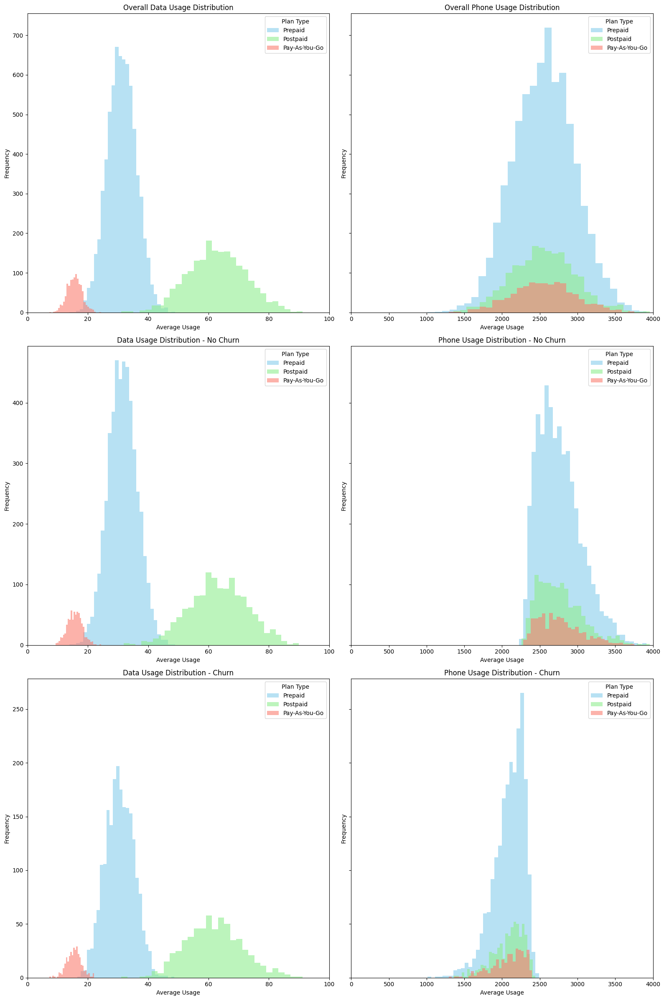

In [ ]:
# Filter out extreme outliers in data usage where usage is over 100
filtered_data = merged_data[merged_data['monthly_avg_data'] <= 100]

# Set up the plotting area
fig, axes = plt.subplots(3, 2, figsize=(16, 24), sharey='row')

# Titles for the charts
usage_titles = ['Data Usage Distribution', 'Phone Usage Distribution']
plan_types = ['plan_prepaid', 'plan_postpaid', 'plan_pay-as-you-go']
plan_labels = ['Prepaid', 'Postpaid', 'Pay-As-You-Go']
colors = ['skyblue', 'lightgreen', 'salmon']
churn_statuses = [0, 1]  # 0 for No Churn, 1 for Churn

# Plot overall distribution first
for j, usage_type in enumerate(['monthly_avg_data', 'monthly_avg_phone']):
    for plan, label, color in zip(plan_types, plan_labels, colors):
        # Filter data for the specific plan type
        plan_data = filtered_data[filtered_data[plan]]
        axes[0, j].hist(plan_data[usage_type], bins=30, color=color, alpha=0.6, label=label, stacked=True)

    axes[0, j].set_title(f'Overall {usage_titles[j]}')
    axes[0, j].set_xlabel('Average Usage')
    axes[0, j].set_ylabel('Frequency')
    axes[0, j].legend(title='Plan Type')
    axes[0, j].set_xlim(0, 4000 if j == 1 else 100)

# Iterate over each churn status and usage type to plot specific distributions
for i, churn in enumerate(churn_statuses, 1):  # Start from second row
    for j, usage_type in enumerate(['monthly_avg_data', 'monthly_avg_phone']):
        for plan, label, color in zip(plan_types, plan_labels, colors):
            # Filter data for the specific plan type and churn status
            plan_data = filtered_data[(filtered_data[plan]) & (filtered_data['churn_in_3mos'] == churn)]
            axes[i, j].hist(plan_data[usage_type], bins=30, color=color, alpha=0.6, label=label, stacked=True)

        axes[i, j].set_title(f'{usage_titles[j]} - {"No Churn" if churn == 0 else "Churn"}')
        axes[i, j].set_xlabel('Average Usage')
        axes[i, j].set_ylabel('Frequency')
        axes[i, j].legend(title='Plan Type')
        axes[i, j].set_xlim(0, 4000 if j == 1 else 100)

plt.tight_layout()
plt.show()

In [ ]:
# Create a cross-tabulation matrix
crosstab_matrix = pd.crosstab(merged_data['plan_type'], merged_data['phone_usage_bins'])

# Display the cross-tabulation matrix
print("Cross-Tabulation Matrix of Plan Type vs. Phone Usage Bins:")
print(crosstab_matrix)

# Create a normalized cross-tabulation matrix where each row sums to 1 (100%)
crosstab_normalized_by_plan = round(pd.crosstab(merged_data['plan_type'], merged_data['phone_usage_bins'], normalize='index') * 100,2)

# Display the normalized cross-tabulation matrix
print("Normalized Cross-Tabulation Matrix of Plan Type vs. Phone Usage Bins (Row %):")
print(crosstab_normalized_by_plan)

Cross-Tabulation Matrix of Plan Type vs. Phone Usage Bins:
phone_usage_bins  lower 2200  2200-2250  2250-2300  2300-2350  2350-2400  \
plan_type                                                                  
pay-as-you-go            196         37         36         46         42   
postpaid                 413         60         71         77         79   
prepaid                 1352        256        287        282        294   

phone_usage_bins  2400-2450  2450-2500  over 2500  
plan_type                                          
pay-as-you-go            48         44        538  
postpaid                102         90       1081  
prepaid                 301        344       3924  
Normalized Cross-Tabulation Matrix of Plan Type vs. Phone Usage Bins (Row %):
phone_usage_bins  lower 2200  2200-2250  2250-2300  2300-2350  2350-2400  \
plan_type                                                                  
pay-as-you-go          19.86       3.75       3.65       4.66       4.

#### App Usage (Average)

In [ ]:
# Cross-tabulation for total counts
total_counts_plans = pd.crosstab(
    merged_data['app_usage_bins'], merged_data['plan_type']
)

# Normalize within each complaint category (row-wise normalization)
relative_counts_plans = total_counts_plans.div(
    total_counts_plans.sum(axis=1), axis=0
) * 100  # Convert to percentage

# Display the matrices
print("Total Counts Matrix:")
print(total_counts_plans)

print("\nRelative Frequencies Matrix (in %):")
print(relative_counts_plans)

Total Counts Matrix:
plan_type       pay-as-you-go  postpaid  prepaid
app_usage_bins                                  
very_low                    3         6       22
low                       162       316     1107
medium                    412       873     3224
high                      250       458     1577
very_high                 160       320     1110

Relative Frequencies Matrix (in %):
plan_type       pay-as-you-go   postpaid    prepaid
app_usage_bins                                     
very_low             9.677419  19.354839  70.967742
low                 10.220820  19.936909  69.842271
medium               9.137281  19.361277  71.501442
high                10.940919  20.043764  69.015317
very_high           10.062893  20.125786  69.811321


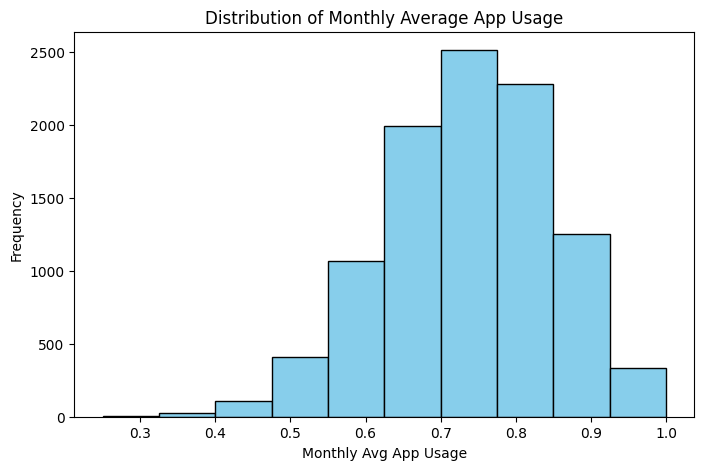

,count
app_usage_bins,
very_low,31
low,1585
medium,4509
high,2285
very_high,1590


In [ ]:
# Plotting the distribution of monthly_avg_app
plt.figure(figsize=(8, 5))
plt.hist(merged_data['monthly_avg_app'], bins=10, color='skyblue', edgecolor='black')
plt.title('Distribution of Monthly Average App Usage')
plt.xlabel('Monthly Avg App Usage')
plt.ylabel('Frequency')
plt.show()

# Display a quick summary of the binning
binning_summary = merged_data['app_usage_bins'].value_counts().sort_index()
binning_summary

#### Sociodemographics

In [ ]:
print("The earliest join date is :",merged_data['join_date'].min())
print("The latest join date is :",merged_data['join_date'].max())

The earliest join date is : 2012-01-01 00:00:00
The latest join date is : 2020-08-01 00:00:00


In [ ]:
print("The age span is :", merged_data['current_age'].max()-merged_data['current_age'].min())
print("The minimum age is :",merged_data['current_age'].min())
print("The maximum age is :",merged_data['current_age'].max())
print("The average age is :",merged_data['current_age'].mean())

The age span is : 50
The minimum age is : 11
The maximum age is : 61
The average age is : 36.136


In [ ]:
# Function to compute average values for tenure and age per contract type
def compute_averages_for_plan_type(df):
    # Group by contract type and calculate mean for tenure and current age
    averages = df.groupby('plan_type').agg(
        average_tenure=('years_on_plan', 'mean'),
        average_age=('current_age', 'mean')
    ).reset_index()
    return averages

# Calculate averages
average_values = compute_averages_for_plan_type(merged_data)

# Display the results
print("Average Tenure and Age per Contract Type:")
print(average_values)

Average Tenure and Age per Contract Type:
       plan_type  average_tenure  average_age
0  pay-as-you-go        5.247214    36.007092
1       postpaid        5.106944    36.278763
2        prepaid        5.221591    36.114063


In [ ]:
merged_data[['join_quarter','join_month']]

,join_quarter,join_month
0,Q4_2015,11_2015
1,Q1_2015,01_2015
2,Q2_2020,05_2020
3,Q4_2017,11_2017
4,Q2_2019,05_2019
...,...,...
9995,Q4_2015,11_2015
9996,Q1_2018,03_2018
9997,Q4_2012,12_2012
9998,Q3_2015,09_2015


In [ ]:
# Convert 'join_month' from string format MM_YYYY to a valid date format
merged_data['join_month'] = pd.to_datetime(merged_data['join_month'], format='%m_%Y', errors='coerce')


In [ ]:
print(merged_data[['join_month']].head(10))


  join_month
0 2015-11-01
1 2015-01-01
2 2020-05-01
3 2017-11-01
4 2019-05-01
5 2015-02-01
6 2018-04-01
7 2012-12-01
8 2013-11-01
9 2017-05-01


[Text(15340.0, 0, '01-2012'),
 Text(15706.0, 0, '01-2013'),
 Text(16071.0, 0, '01-2014'),
 Text(16436.0, 0, '01-2015'),
 Text(16801.0, 0, '01-2016'),
 Text(17167.0, 0, '01-2017'),
 Text(17532.0, 0, '01-2018'),
 Text(17897.0, 0, '01-2019'),
 Text(18262.0, 0, '01-2020')]

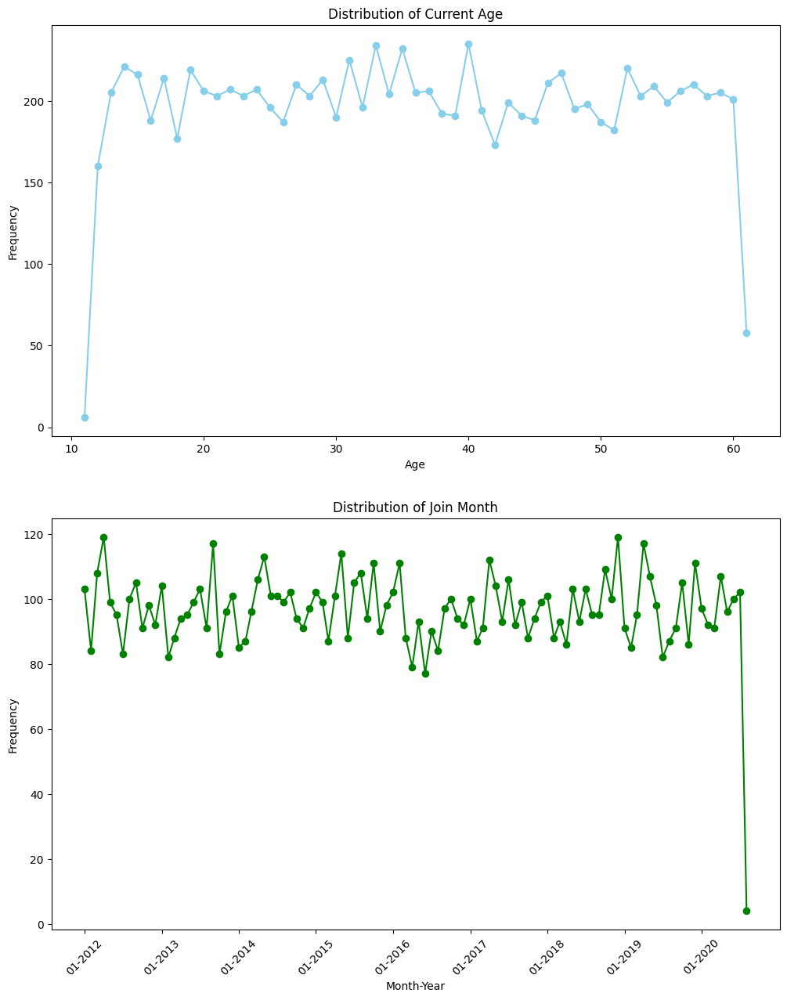

In [ ]:
# Plotting the distributions
fig, axes = plt.subplots(2, 1, figsize=(12, 15))

# Plot distribution of current_age
ages = merged_data['current_age'].value_counts().sort_index()
axes[0].plot(ages.index, ages.values, marker='o', linestyle='-', color='skyblue')
axes[0].set_title('Distribution of Current Age')
axes[0].set_xlabel('Age')
axes[0].set_ylabel('Frequency')

# Plot distribution of join_month
months = merged_data['join_month'].dt.to_period('M').value_counts().sort_index()
axes[1].plot(months.index.to_timestamp(), months.values, marker='o', linestyle='-', color='green')
axes[1].set_title('Distribution of Join Month')
axes[1].set_xlabel('Month-Year')
axes[1].set_ylabel('Frequency')
axes[1].set_xticks(months.index.to_timestamp()[::12])  # Every 12th month
axes[1].set_xticklabels([date.strftime('%m-%Y') for date in months.index.to_timestamp()][::12], rotation=45)

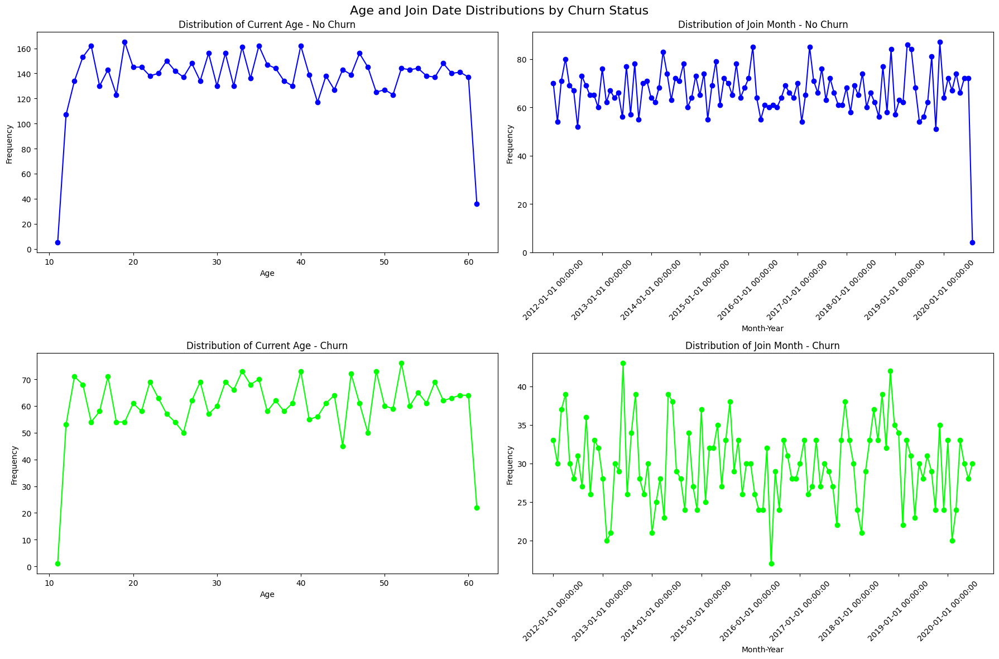

In [ ]:
def plot_age_and_join_distributions_by_churn(df):
    colors = {0: 'blue', 1: 'lime'}
    labels = {0: 'No Churn', 1: 'Churn'}
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    fig.suptitle('Age and Join Date Distributions by Churn Status', fontsize=16)

    for churn in [0, 1]:
        subset = df[df['churn_in_3mos'] == churn]

        # Plot current_age
        ages = subset['current_age'].value_counts().sort_index()
        axes[churn, 0].plot(ages.index, ages.values, marker='o', linestyle='-', color=colors[churn])
        axes[churn, 0].set_title(f'Distribution of Current Age - {labels[churn]}')
        axes[churn, 0].set_xlabel('Age')
        axes[churn, 0].set_ylabel('Frequency')

        # Plot join_month
        months = subset['join_month'].value_counts().sort_index()
        axes[churn, 1].plot(months.index, months.values, marker='o', linestyle='-', color=colors[churn])
        axes[churn, 1].set_title(f'Distribution of Join Month - {labels[churn]}')
        axes[churn, 1].set_xlabel('Month-Year')
        axes[churn, 1].set_ylabel('Frequency')
        axes[churn, 1].set_xticks(months.index[::12])
        axes[churn, 1].set_xticklabels(months.index[::12], rotation=45)

    plt.tight_layout()
    plt.show()

# Call the function
plot_age_and_join_distributions_by_churn(merged_data)

In [ ]:
# Function to compute average values for tenure and age per contract type and usage intensity
def compute_averages_for_usage_intensity(df, usage_bin_column):
    # Group by contract type and usage bins, then calculate the mean for tenure and current age
    averages = df.groupby(['plan_type', usage_bin_column]).agg(
        average_tenure=('years_on_plan', 'mean'),
        average_age=('current_age', 'mean')
    ).reset_index()
    return averages

# Calculate averages for phone usage intensity
average_tenure_age_phone = compute_averages_for_usage_intensity(merged_data, 'phone_usage_bins')

# Display the results for phone usage intensity
print("\nAverage Tenure and Age per Contract Type and Phone Usage Intensity:")
print(average_tenure_age_phone)


Average Tenure and Age per Contract Type and Phone Usage Intensity:
        plan_type phone_usage_bins  average_tenure  average_age
0   pay-as-you-go       lower 2200        5.265306    35.622449
1   pay-as-you-go        2200-2250        4.729730    36.810811
2   pay-as-you-go        2250-2300        5.000000    39.444444
3   pay-as-you-go        2300-2350        5.413043    30.043478
4   pay-as-you-go        2350-2400        4.642857    36.190476
5   pay-as-you-go        2400-2450        5.875000    36.791667
6   pay-as-you-go        2450-2500        5.022727    36.136364
7   pay-as-you-go        over 2500        5.288104    36.276952
8        postpaid       lower 2200        5.164649    36.958838
9        postpaid        2200-2250        5.100000    38.650000
10       postpaid        2250-2300        5.394366    36.521127
11       postpaid        2300-2350        5.000000    36.168831
12       postpaid        2350-2400        4.797468    37.405063
13       postpaid        2400-2450 

<ipython-input-63-0a5071ebd88c>:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  averages = df.groupby(['plan_type', usage_bin_column]).agg(


### Usage Patterns

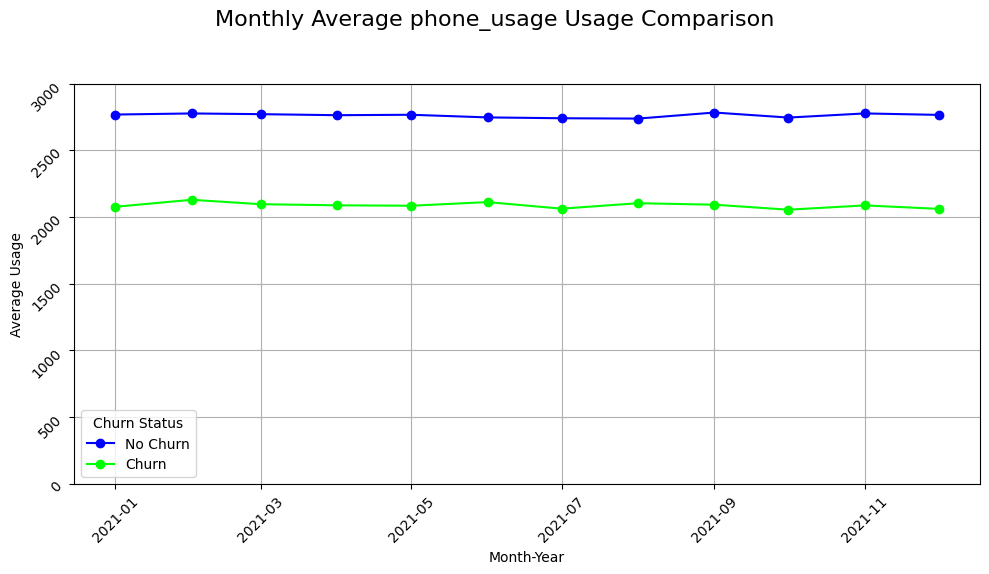

In [ ]:
def plot_average_usage_comparison(df, usage_type):
    colors = {0: 'blue', 1: 'lime'}  # Colors for No Churn and Churn
    fig, ax = plt.subplots(figsize=(10, 6))  # Create a single plot
    fig.suptitle(f'Monthly Average {usage_type} Usage Comparison', fontsize=16)

    for churn, color in colors.items():
        # Filter data by churn status
        subset = df[df['churn_in_3mos'] == churn]
        monthly_data = subset.groupby('month_year')[usage_type].mean().reset_index()
        monthly_data.sort_values('month_year', inplace=True)
        monthly_data['month_year'] = pd.to_datetime(monthly_data['month_year'])  # Ensure month_year is datetime for proper plotting

        if not monthly_data.empty:
            ax.plot(monthly_data['month_year'], monthly_data[usage_type], marker='o', linestyle='-', color=color, label=f'{"No Churn" if churn == 0 else "Churn"}')
        else:
            ax.text(0.5, 0.5, 'No data available', horizontalalignment='center', verticalalignment='center', fontsize=12, transform=ax.transAxes)

        ax.set_xlabel('Month-Year')
        ax.set_ylabel('Average Usage')
        ax.tick_params(labelrotation=45)
        ax.grid(True)
        ax.legend(title='Churn Status')
        ax.set_ylim(0, 3000)


    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Call the function for the phone usage data
plot_average_usage_comparison(all_usage_long, 'phone_usage')

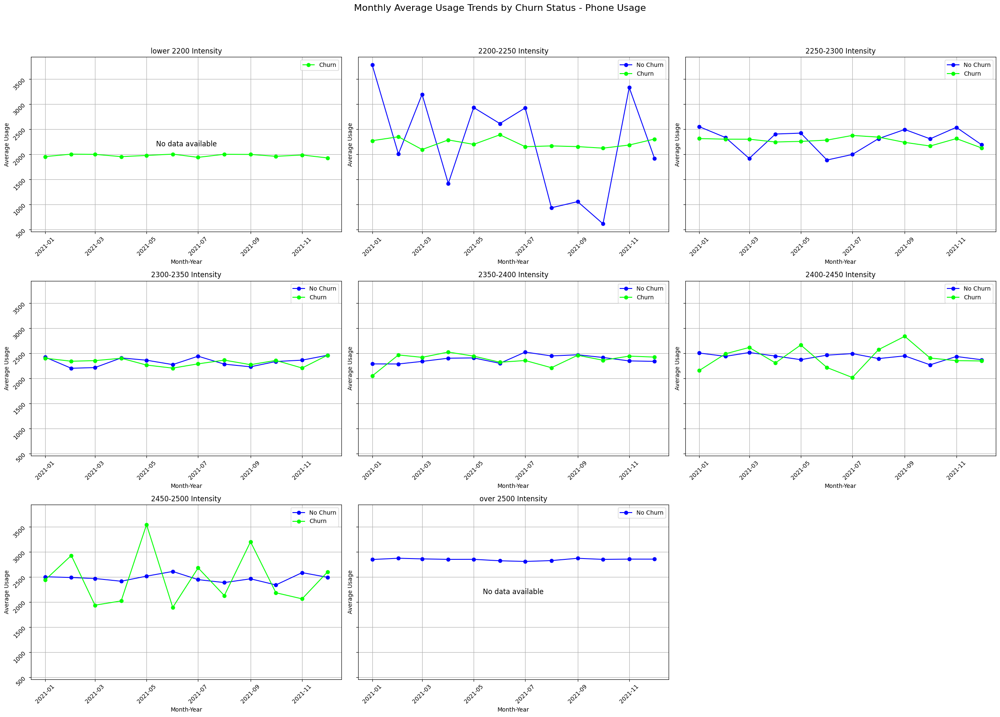

Churn and No Churn Counts per Phone Usage Bin:
           No Churn  Churn No Churn %    Churn %
lower 2200        0  23532        0.0      100.0
2200-2250        36   4200   0.849858  99.150142
2250-2300       336   4392   7.106599  92.893401
2300-2350      1884   2976  38.765432  61.234568
2350-2400      3612   1368   72.53012   27.46988
2400-2450      5160    252  95.343681   4.656319
2450-2500      5688     48   99.16318    0.83682
over 2500     66516      0      100.0        0.0


In [ ]:
def plot_trends_and_calculate_counts(df, usage_type, title_suffix):
    colors = {0: 'blue', 1: 'lime'}
    # Update intensity levels to the new bins
    intensity_levels = ['lower 2200', '2200-2250', '2250-2300', '2300-2350', '2350-2400', '2400-2450', '2450-2500', 'over 2500']

    # Calculate number of rows needed for the given number of intensity levels
    num_rows = (len(intensity_levels) + 2) // 3  # Ensure there are enough rows in the subplot grid
    fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(24, 6*num_rows), sharey=True)
    fig.suptitle(f'Monthly Average Usage Trends by Churn Status - {title_suffix}', fontsize=16)

    # Prepare a DataFrame to store the count of churn and no churn cases
    churn_counts = pd.DataFrame(index=intensity_levels, columns=['No Churn', 'Churn', 'No Churn %', 'Churn %'])

    # Flatten axes array for easier indexing if it's multidimensional
    axes = axes.flatten()

    for i, intensity in enumerate(intensity_levels):
        ax = axes[i]  # Assign subplot to each intensity level
        total = 0  # Initialize total counts for the bin
        for churn in [0, 1]:
            subset = df[(df[usage_type + '_bins'] == intensity) & (df['churn_in_3mos'] == churn)]
            monthly_data = subset.groupby('month_year')[usage_type].mean().reset_index()
            monthly_data.sort_values('month_year', inplace=True)
            monthly_data['month_year'] = pd.to_datetime(monthly_data['month_year'])

            # Count the number of cases in each category
            count = subset.shape[0]
            churn_counts.loc[intensity, 'Churn' if churn else 'No Churn'] = count
            total += count

            if not monthly_data.empty:
                ax.plot(monthly_data['month_year'], monthly_data[usage_type], marker='o', linestyle='-', color=colors[churn], label=f'{"No Churn" if churn == 0 else "Churn"}')
            else:
                ax.text(0.5, 0.5, 'No data available', horizontalalignment='center', verticalalignment='center', fontsize=12, transform=ax.transAxes)

            ax.set_title(f'{intensity} Intensity')
            ax.set_xlabel('Month-Year')
            ax.set_ylabel('Average Usage')
            ax.tick_params(labelrotation=45)
            ax.grid(True)
            ax.legend()

        # Calculate percentages if total is greater than 0
        if total > 0:
            churn_counts.loc[intensity, 'No Churn %'] = (churn_counts.loc[intensity, 'No Churn'] / total) * 100
            churn_counts.loc[intensity, 'Churn %'] = (churn_counts.loc[intensity, 'Churn'] / total) * 100

    # Hide any unused subplots if there are any
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # Print the table of churn counts
    print("Churn and No Churn Counts per Phone Usage Bin:")
    print(churn_counts)

# Example usage, make sure to pass the right DataFrame
plot_trends_and_calculate_counts(all_usage_long, 'phone_usage', 'Phone Usage')

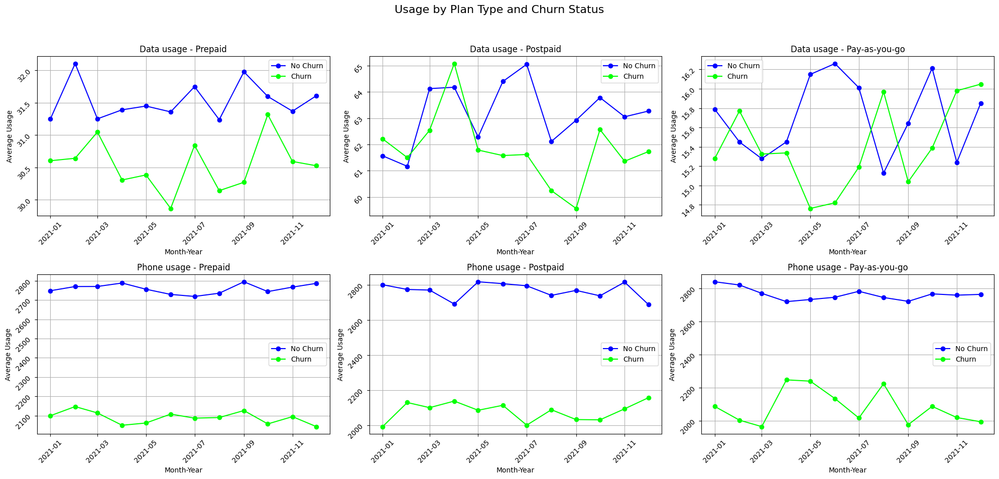

In [ ]:
def plot_usage_by_plan_and_churn(df, usage_types, plan_types):
    # Define colors and layout
    colors = {0: 'blue', 1: 'lime'}
    num_usage_types = len(usage_types)
    num_plans = len(plan_types)

    # Setup plot grid: one row per usage type, three columns (one for each plan type)
    fig, axes = plt.subplots(nrows=num_usage_types, ncols=num_plans, figsize=(20, 5 * num_usage_types))  # Adjust the size as needed
    fig.suptitle('Usage by Plan Type and Churn Status', fontsize=16)

    # Iterate over usage types and plan types
    for i, usage_type in enumerate(usage_types):
        for j, plan_type in enumerate(plan_types):
            ax = axes[i, j]  # Determine the correct subplot

            # Plot both churn and no churn data in the same subplot
            for churn, color in colors.items():
                # Filter data for the specific plan and churn status
                subset = df[(df['plan_type'] == plan_type) & (df['churn_in_3mos'] == churn)]
                monthly_data = subset.groupby('month_year')[usage_type].mean().reset_index()
                monthly_data.sort_values('month_year', inplace=True)
                monthly_data['month_year'] = pd.to_datetime(monthly_data['month_year'])

                if not monthly_data.empty:
                    ax.plot(monthly_data['month_year'], monthly_data[usage_type], marker='o', linestyle='-', color=color, label=f'{"No Churn" if churn == 0 else "Churn"}')
                    ax.set_title(f'{usage_type.replace("_", " ").capitalize()} - {plan_type.capitalize()}')
                    ax.set_xlabel('Month-Year')
                    ax.set_ylabel('Average Usage')
                    ax.tick_params(labelrotation=45)
                    ax.grid(True)
                    ax.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Assuming 'all_usage_long' is prepared and has the correct 'plan_type' column
plan_types = ['prepaid', 'postpaid', 'pay-as-you-go']
usage_types = ['data_usage', 'phone_usage']

# Example call to the plotting function
plot_usage_by_plan_and_churn(all_usage_long, usage_types, plan_types)

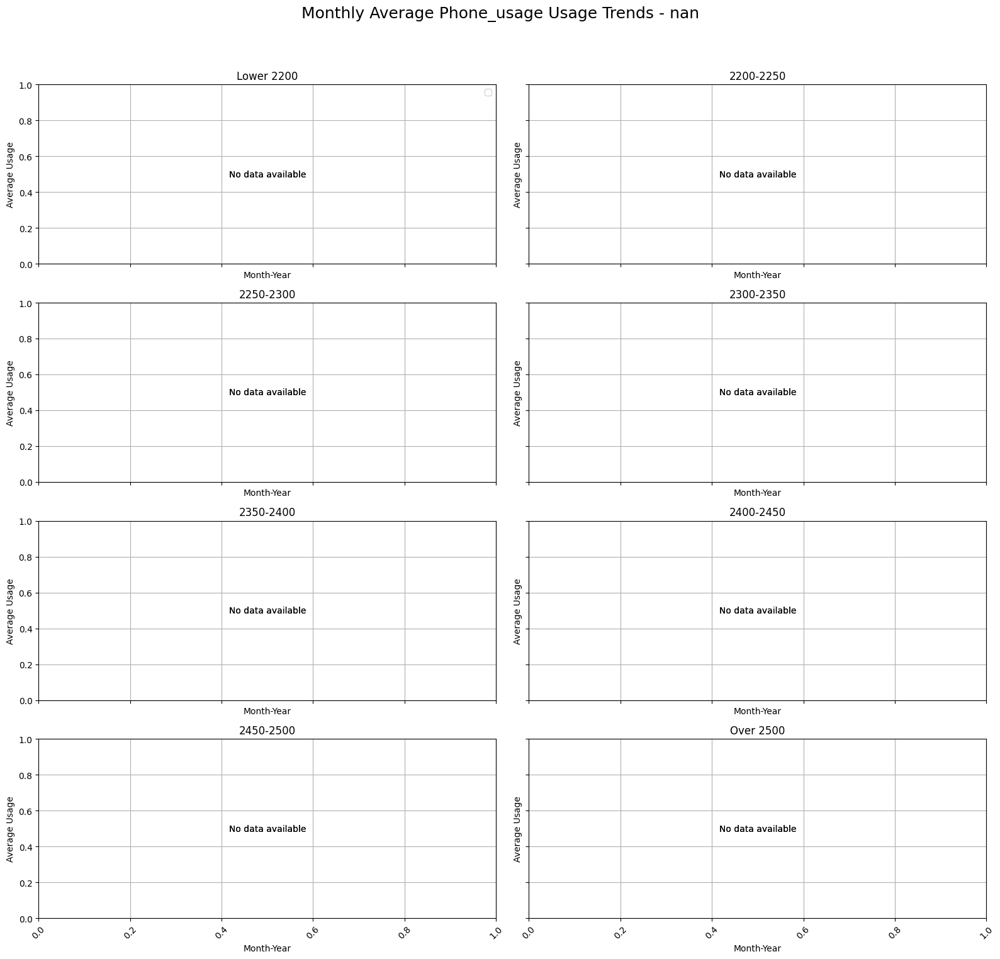

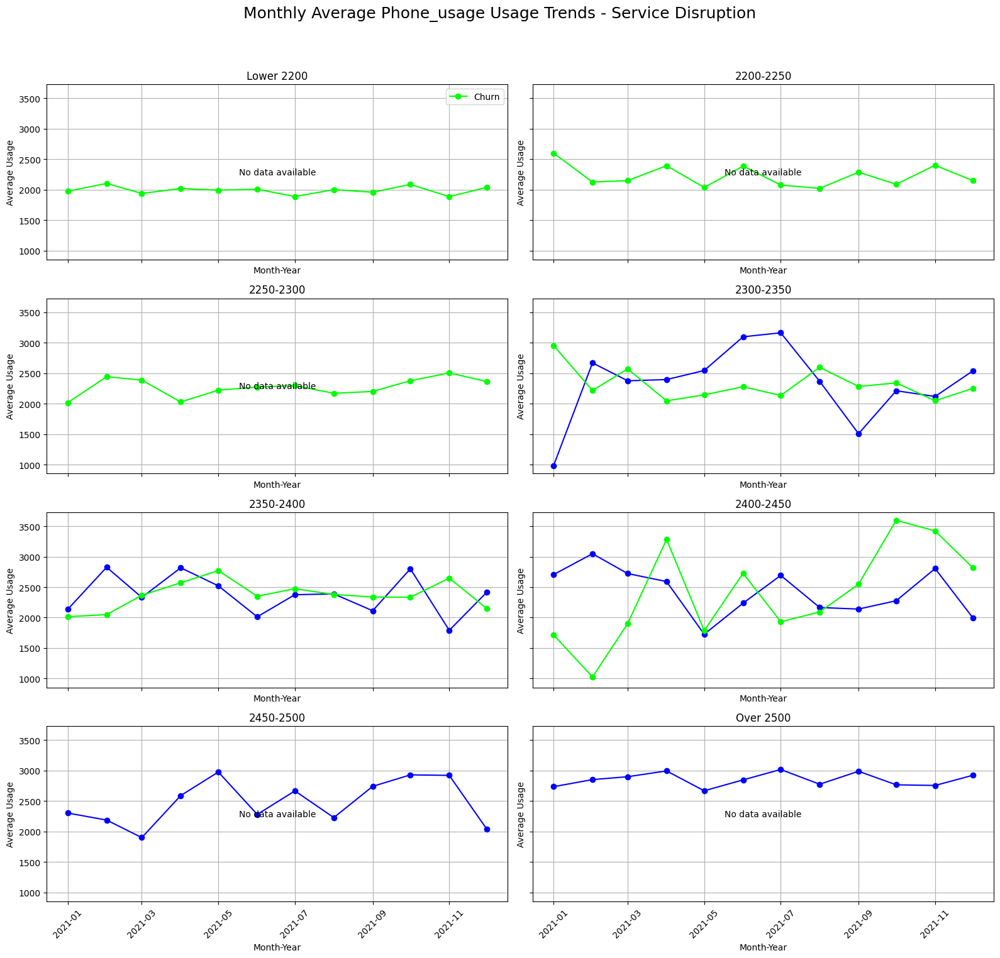

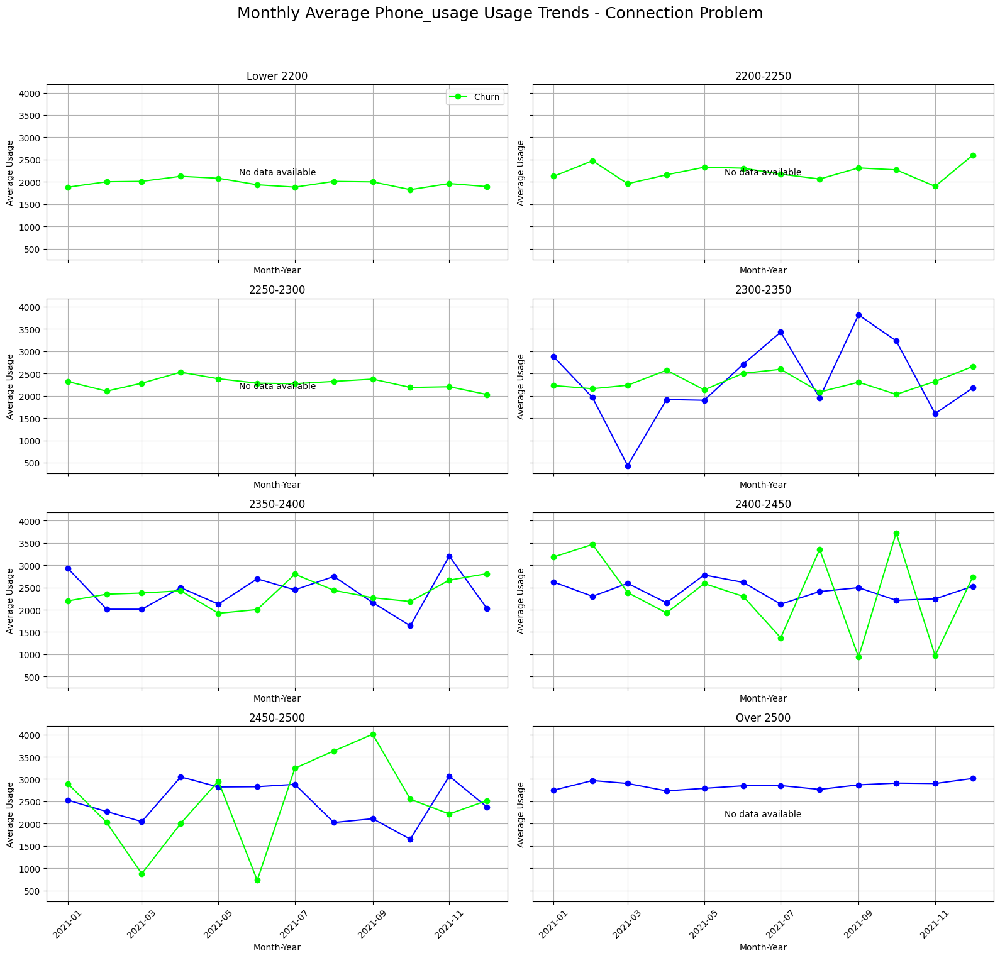

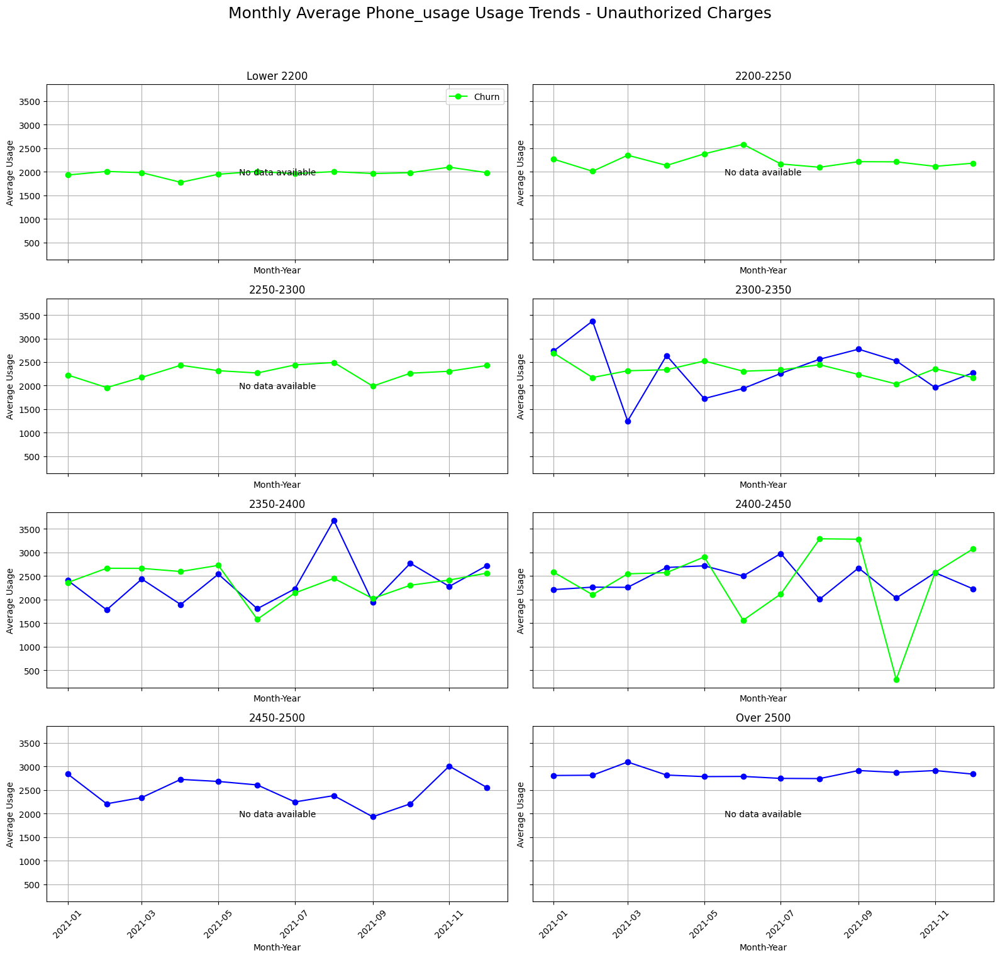

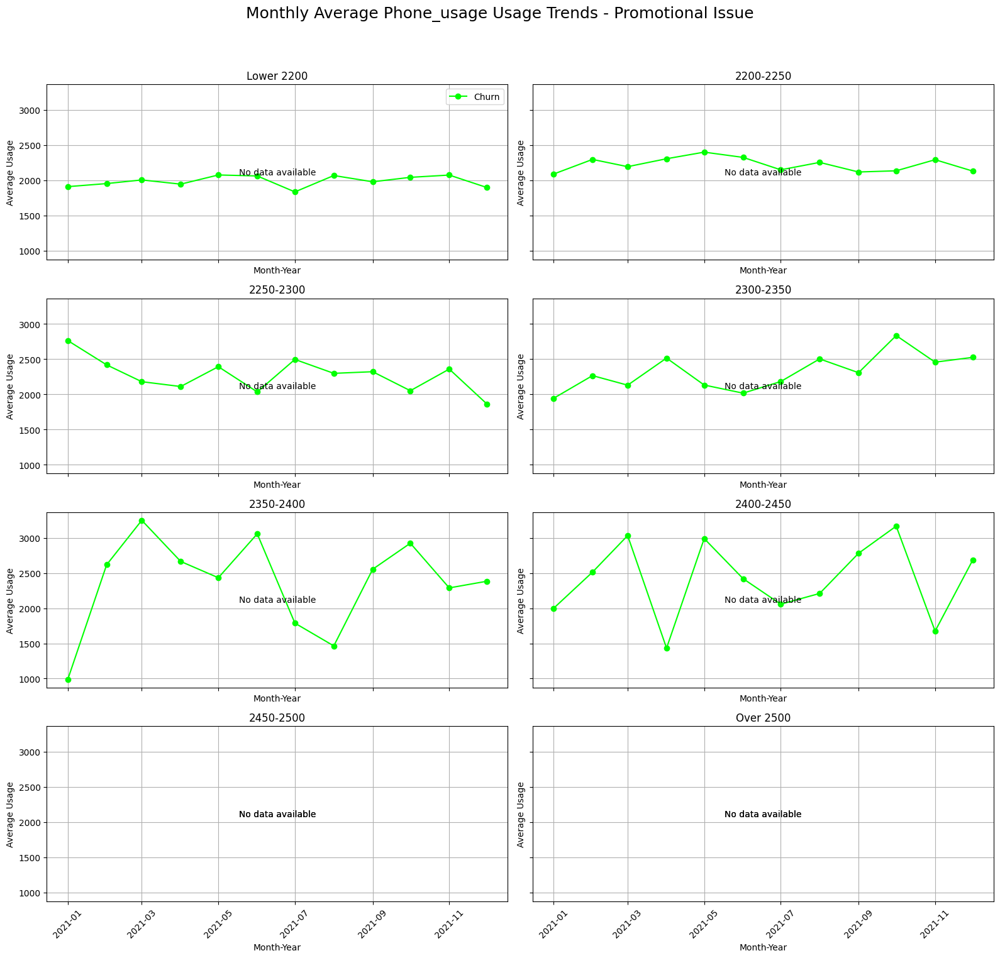

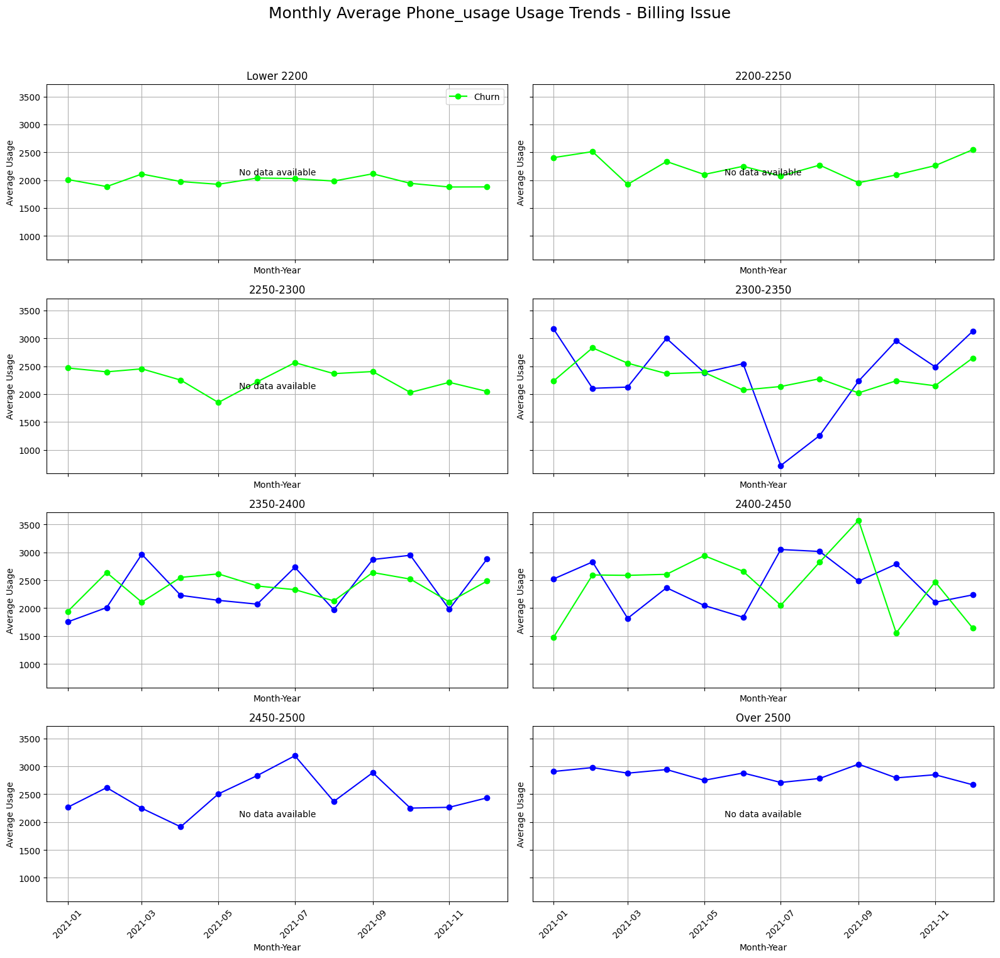

In [ ]:
def plot_trends_for_all_categories(df, usage_type):
    colors = {0: 'blue', 1: 'lime'}

    # Get unique categories from the dataframe
    categories = df['category'].unique()

    # Define intensity levels
    intensity_levels = ['lower 2200', '2200-2250', '2250-2300', '2300-2350', '2350-2400', '2400-2450', '2450-2500', 'over 2500']

    # Loop through each category to generate plots
    for category in categories:
        fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(16, 16), sharex=True, sharey=True)  # 4 rows, 2 columns

        fig.suptitle(f'Monthly Average {usage_type.capitalize()} Usage Trends - {category}', fontsize=18)

        for i, intensity in enumerate(intensity_levels):
            ax = axes[i // 2, i % 2]  # Properly index into the 2D array

            for churn in [0, 1]:
                subset = df[(df[usage_type + '_bins'] == intensity) &
                            (df['churn_in_3mos'] == churn) &
                            (df['category'] == category)]
                monthly_data = subset.groupby('month_year')[usage_type].mean().reset_index()
                monthly_data.sort_values('month_year', inplace=True)

                if not monthly_data.empty:
                    monthly_data['month_year'] = pd.to_datetime(monthly_data['month_year'])
                    ax.plot(monthly_data['month_year'], monthly_data[usage_type], marker='o', linestyle='-', color=colors[churn],
                            label=f'{"No Churn" if churn == 0 else "Churn"}')
                else:
                    ax.text(0.5, 0.5, 'No data available', horizontalalignment='center',
                            verticalalignment='center', fontsize=10, transform=ax.transAxes)

            ax.set_title(f'{intensity.capitalize()}')
            ax.set_xlabel('Month-Year')
            ax.set_ylabel('Average Usage')
            ax.tick_params(axis='x', rotation=45)
            ax.grid(True)

        axes[0, 0].legend(loc='upper right')  # Show legend only once
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

# Example function calls with your data frames
plot_trends_for_all_categories(all_usage_long, 'phone_usage')

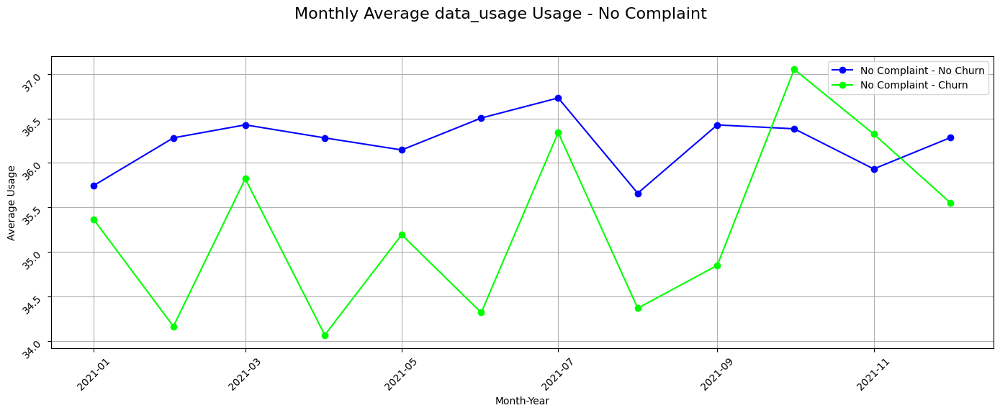

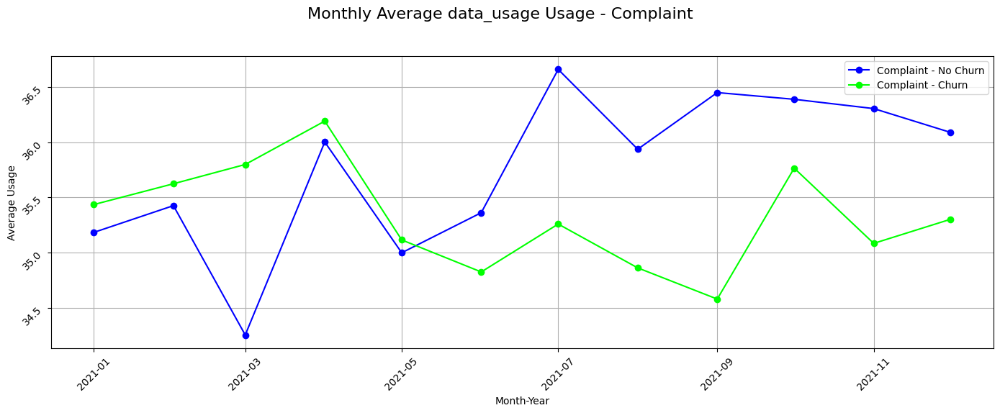

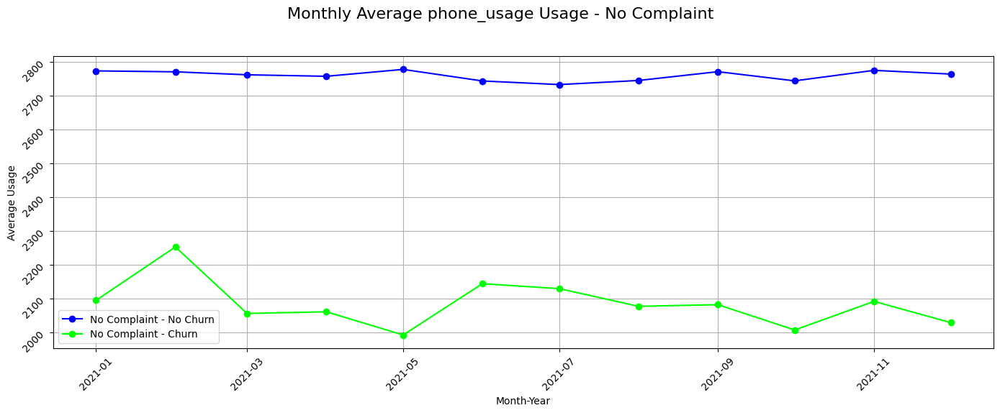

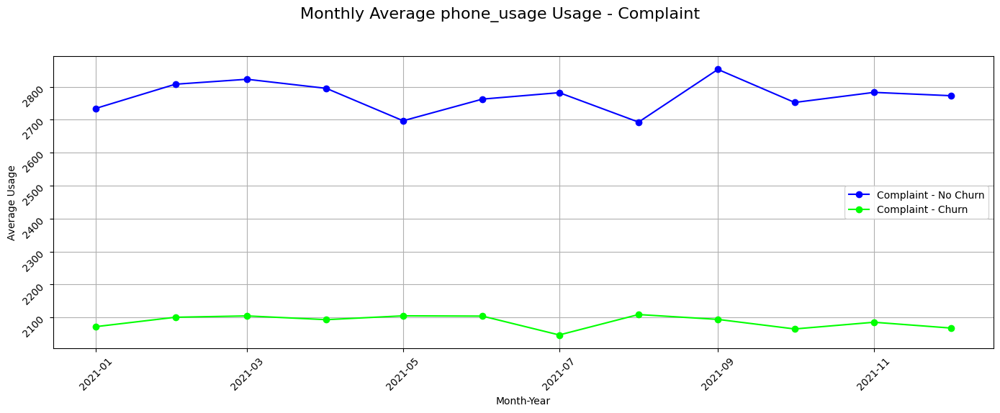

In [ ]:
def plot_trends_by_complaint_status(df, usage_type):
    colors = {0: 'blue', 1: 'lime'}  # Colors for No Churn and Churn
    complaint_status = {0: 'No Complaint', 1: 'Complaint'}

    # Iterate over each complaint status
    for comp in [0, 1]:  # 0 for No Complaint, 1 for Complaint
        fig, ax = plt.subplots(figsize=(14, 6))  # Single plot for each complaint status
        fig.suptitle(f'Monthly Average {usage_type} Usage - {complaint_status[comp]}', fontsize=16)

        # Plot data for both churn and no churn on the same axis
        for churn in [0, 1]:
            subset = df[(df['complaint'] == comp) & (df['churn_in_3mos'] == churn)]
            monthly_data = subset.groupby('month_year')[usage_type].mean().reset_index()
            monthly_data.sort_values('month_year', inplace=True)
            monthly_data['month_year'] = pd.to_datetime(monthly_data['month_year'])  # Convert for proper plotting

            if not monthly_data.empty:
                ax.plot(monthly_data['month_year'], monthly_data[usage_type], marker='o', linestyle='-', color=colors[churn], label=f'{complaint_status[comp]} - {"No Churn" if churn == 0 else "Churn"}')
            else:
                ax.text(0.5, 0.5, 'No data available', horizontalalignment='center', verticalalignment='center', fontsize=12, transform=ax.transAxes)

        ax.set_xlabel('Month-Year')
        ax.set_ylabel('Average Usage')
        ax.tick_params(labelrotation=45)
        ax.grid(True)
        ax.legend()

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

# Example function calls with your data frames
# Assuming 'data_usage_long' and 'phone_usage_long' have been prepared with a 'complaint' column
plot_trends_by_complaint_status(all_usage_long, 'data_usage')
plot_trends_by_complaint_status(all_usage_long, 'phone_usage')

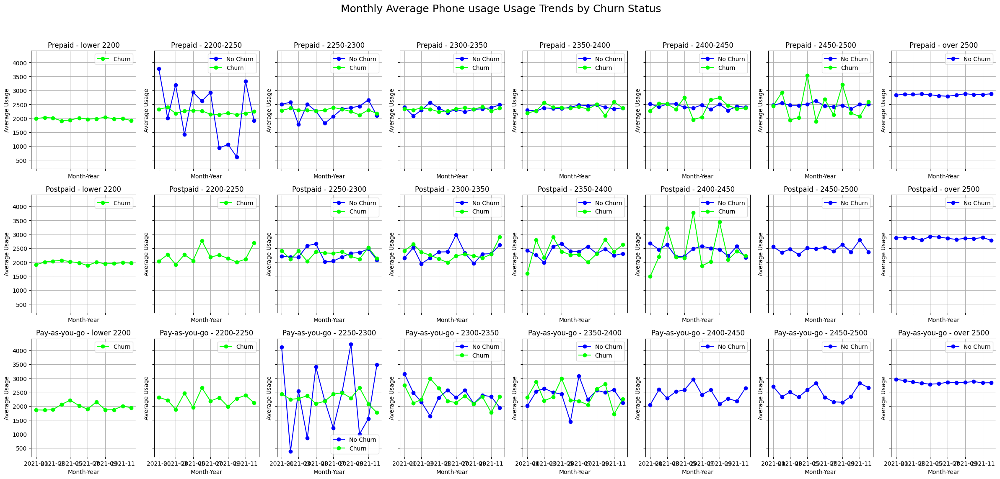

In [ ]:


# Define the contract types, intensity levels, and churn status colors
contract_types = ['prepaid', 'postpaid', 'pay-as-you-go']
intensity_levels = ['lower 2200', '2200-2250', '2250-2300', '2300-2350', '2350-2400', '2400-2450', '2450-2500', 'over 2500']
churn_colors = {0: 'blue', 1: 'lime'}  # Mapping churn status to colors

# Function to plot churn vs. no churn trends with specific colors
def plot_churn_trends(df, usage_type):
    fig, axes = plt.subplots(nrows=len(contract_types), ncols=len(intensity_levels), figsize=(24, 12), sharex=True, sharey=True)
    fig.suptitle(f'Monthly Average {usage_type.replace("_", " ").capitalize()} Usage Trends by Churn Status', fontsize=18)

    for i, contract in enumerate(contract_types):
        for j, intensity in enumerate(intensity_levels):
            ax = axes[i, j]

            data_plotted = False  # Track if we plotted anything

            for churn, color in churn_colors.items():
                # Filter data by contract type, intensity, and churn status
                subset = df[(df['plan_type'] == contract) & (df[usage_type + '_bins'] == intensity) & (df['churn_in_3mos'] == churn)]

                # Group by month_year to get average usage
                monthly_avg = subset.groupby('month_year')[usage_type].mean().reset_index()

                if not monthly_avg.empty:
                    monthly_avg['month_year'] = pd.to_datetime(monthly_avg['month_year'])
                    ax.plot(monthly_avg['month_year'], monthly_avg[usage_type], marker='o', linestyle='-', color=color, label=f'{"No Churn" if churn == 0 else "Churn"}')
                    data_plotted = True

            ax.set_title(f'{contract.capitalize()} - {intensity}')
            ax.set_xlabel('Month-Year')
            ax.set_ylabel('Average Usage')
            ax.grid(True)

            if data_plotted:
                ax.legend()
            else:
                ax.text(0.5, 0.5, 'No data', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize=10)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Call the function for both data and phone usage
plot_churn_trends(all_usage_long, 'phone_usage')

### Churn Analysis

In [ ]:
total_counts = merged_data.groupby(['complaint', 'churn_in_3mos']).size().unstack(fill_value=0)
total_counts.columns = ['No Churn', 'Churn']
total_counts.index = ['No Complaint', 'Complaint']

# Creating the relative frequencies matrix
relative_counts = total_counts.div(total_counts.sum(axis=1), axis=0) * 100  # Percentage calculation

# Printing the results
print("Total Counts Matrix:")
print(total_counts)
print("\nRelative Frequencies Matrix:")
print(relative_counts)

Total Counts Matrix:
              No Churn  Churn
No Complaint      5936    564
Complaint         1000   2500

Relative Frequencies Matrix:
               No Churn      Churn
No Complaint  91.323077   8.676923
Complaint     28.571429  71.428571


In [ ]:
# Create a crosstab for app_usage_bins vs churn_in_3mos (Total counts)
app_usage_churn_counts = pd.crosstab(
    merged_data['app_usage_bins'],
    merged_data['churn_in_3mos'],
    margins=True,
    margins_name='Total'
)

# Rename the columns for readability
app_usage_churn_counts.columns = ['No Churn', 'Churn', 'Total']

# Create a relative percentage matrix
app_usage_churn_relative = app_usage_churn_counts.div(app_usage_churn_counts['Total'], axis=0) * 100

# Display the matrices
app_usage_churn_counts, app_usage_churn_relative

(                No Churn  Churn  Total
 app_usage_bins                        
 very_low              22      9     31
 low                 1105    480   1585
 medium              3137   1372   4509
 high                1601    684   2285
 very_high           1071    519   1590
 Total               6936   3064  10000,
                  No Churn      Churn  Total
 app_usage_bins                             
 very_low        70.967742  29.032258  100.0
 low             69.716088  30.283912  100.0
 medium          69.571967  30.428033  100.0
 high            70.065646  29.934354  100.0
 very_high       67.358491  32.641509  100.0
 Total           69.360000  30.640000  100.0)

In [ ]:
# Create the total counts matrix
total_counts_categories = pd.crosstab(
    merged_data['category'], merged_data['app_usage_bins']
)

# Add a 'Total' column for easier division later
total_counts_categories['Total'] = total_counts_categories.sum(axis=1)

# Create a relative matrix as percentage of each row (i.e., each category)
relative_counts_categories = total_counts_categories.drop(columns='Total').div(total_counts_categories['Total'], axis=0) * 100

print("Total Counts Matrix:")
print(total_counts_categories)

print("\nRelative Frequencies Matrix (in %):")
print(relative_counts_categories)

Total Counts Matrix:
app_usage_bins        very_low  low  medium  high  very_high  Total
category                                                           
Billing Issue                1  112     370   165        122    770
Connection Problem           2  112     345   160        131    750
Promotional Issue            2   76     236   118         72    504
Service Disruption           1  114     306   168        139    728
Unauthorized Charges         6  121     326   175        120    748

Relative Frequencies Matrix (in %):
app_usage_bins        very_low        low     medium       high  very_high
category                                                                  
Billing Issue         0.129870  14.545455  48.051948  21.428571  15.844156
Connection Problem    0.266667  14.933333  46.000000  21.333333  17.466667
Promotional Issue     0.396825  15.079365  46.825397  23.412698  14.285714
Service Disruption    0.137363  15.659341  42.032967  23.076923  19.093407
Unauthorized Cha

### Complaint Analysis

In [ ]:
# Creating the total counts matrix by category
total_counts_category = merged_data['category'].value_counts()

# Creating the relative frequencies matrix by category (as percentage of the total)
relative_counts_category = (total_counts_category / total_counts_category.sum()) * 100

# Printing the results
print("Total Counts Matrix by Complaint Type:")
print(total_counts_category)

print("\nRelative Frequencies Matrix by Complaint Type:")
print(relative_counts_category)

Total Counts Matrix by Complaint Type:
category
Billing Issue           770
Connection Problem      750
Unauthorized Charges    748
Service Disruption      728
Promotional Issue       504
Name: count, dtype: int64

Relative Frequencies Matrix by Complaint Type:
category
Billing Issue           22.000000
Connection Problem      21.428571
Unauthorized Charges    21.371429
Service Disruption      20.800000
Promotional Issue       14.400000
Name: count, dtype: float64


In [ ]:
# Assuming 'merged_data' is your DataFrame and it contains 'churn_in_3mos' and 'category' as columns

# Creating the total counts matrix by category and churn status
total_counts_category = merged_data.groupby(['category', 'churn_in_3mos']).size().unstack(fill_value=0)
total_counts_category.columns = ['No Churn', 'Churn']
total_counts_category.index.name = 'Complaint Type'

# Creating the relative frequencies matrix by category
relative_counts_category = total_counts_category.div(total_counts_category.sum(axis=1), axis=0) * 100  # Percentage calculation
relative_counts_category.columns = ['No Churn Relative', 'Churn Relative']

# Printing the results
print("Total Counts Matrix by Complaint Type:")
print(total_counts_category)
print("\nRelative Frequencies Matrix by Complaint Type:")
print(relative_counts_category)

Total Counts Matrix by Complaint Type:
                      No Churn  Churn
Complaint Type                       
Billing Issue              254    516
Connection Problem         250    500
Promotional Issue            0    504
Service Disruption         248    480
Unauthorized Charges       248    500

Relative Frequencies Matrix by Complaint Type:
                      No Churn Relative  Churn Relative
Complaint Type                                         
Billing Issue                 32.987013       67.012987
Connection Problem            33.333333       66.666667
Promotional Issue              0.000000      100.000000
Service Disruption            34.065934       65.934066
Unauthorized Charges          33.155080       66.844920


In [ ]:
# Assuming 'merged_data' is the DataFrame and it contains 'churn_in_3mos', 'data_usage_bins', and 'phone_usage_bins'

def churn_per_usage_intensity(df, usage_bins):
    # Calculate total counts of churn per usage intensity
    total_counts = df.groupby([usage_bins, 'churn_in_3mos']).size().unstack(fill_value=0)
    total_counts.columns = ['No Churn', 'Churn']

    # Calculate relative frequencies of churn per usage intensity
    relative_counts = total_counts.div(total_counts.sum(axis=1), axis=0) * 100  # Converts counts to percentage
    relative_counts.columns = ['No Churn Relative', 'Churn Relative']

    return total_counts, relative_counts

# Calculate churn per usage intensity for data usage and phone usage
phone_usage_totals, phone_usage_relatives = churn_per_usage_intensity(merged_data, 'phone_usage_bins')

print("\nPhone Usage - Total Counts by Intensity:")
print(phone_usage_totals)
print("\nPhone Usage - Relative Frequencies by Intensity:")
print(phone_usage_relatives)


Phone Usage - Total Counts by Intensity:
                  No Churn  Churn
phone_usage_bins                 
lower 2200               0   1961
2200-2250                3    350
2250-2300               28    366
2300-2350              157    248
2350-2400              301    114
2400-2450              430     21
2450-2500              474      4
over 2500             5543      0

Phone Usage - Relative Frequencies by Intensity:
                  No Churn Relative  Churn Relative
phone_usage_bins                                   
lower 2200                 0.000000      100.000000
2200-2250                  0.849858       99.150142
2250-2300                  7.106599       92.893401
2300-2350                 38.765432       61.234568
2350-2400                 72.530120       27.469880
2400-2450                 95.343681        4.656319
2450-2500                 99.163180        0.836820
over 2500                100.000000        0.000000


<ipython-input-75-212bd574b521>:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  total_counts = df.groupby([usage_bins, 'churn_in_3mos']).size().unstack(fill_value=0)


In [ ]:
# Example of calculating totals
def calculate_churn_distributions(df):
    # Group by necessary columns and calculate the count
    churn_totals = df.groupby(['plan_type', 'churn_in_3mos']).size().unstack(fill_value=0)
    churn_totals.columns = ['No Churn', 'Churn']

    # Calculate the relative frequencies
    churn_relative = churn_totals.div(churn_totals.sum(axis=1), axis=0)
    churn_relative.columns = ['No Churn Relative', 'Churn Relative']

    # Combine totals and relative data
    churn_distribution = pd.concat([churn_totals, churn_relative], axis=1)
    return churn_distribution

# Calculate churn distributions for data usage
data_usage_churn_distribution = calculate_churn_distributions(merged_data[merged_data['plan_type'].isin(['prepaid', 'postpaid', 'pay-as-you-go'])])

print(data_usage_churn_distribution)

               No Churn  Churn  No Churn Relative  Churn Relative
plan_type                                                        
pay-as-you-go       676    311           0.684904        0.315096
postpaid           1355    618           0.686771        0.313229
prepaid            4905   2135           0.696733        0.303267


In [ ]:
churn_phone_percentage = round(1- (all_usage_long[all_usage_long['churn_in_3mos'] == 1]['phone_usage'].mean())/(all_usage_long[all_usage_long['churn_in_3mos'] == 0]['phone_usage'].mean()),2)

churn_phone_total = round((all_usage_long[all_usage_long['churn_in_3mos'] == 0]['phone_usage'].mean())-(all_usage_long[all_usage_long['churn_in_3mos'] == 1]['phone_usage'].mean()),2)

print(f"Churners make {churn_phone_percentage*100}% less phone calls, ({churn_phone_total} in minutes).")


Churners make 24.0% less phone calls, (673.97 in minutes).


### ADDITIONAL EDA (RAFA)

STANDARD DEVIATION / CHURN with PHONE USAGE + DATA USAGE

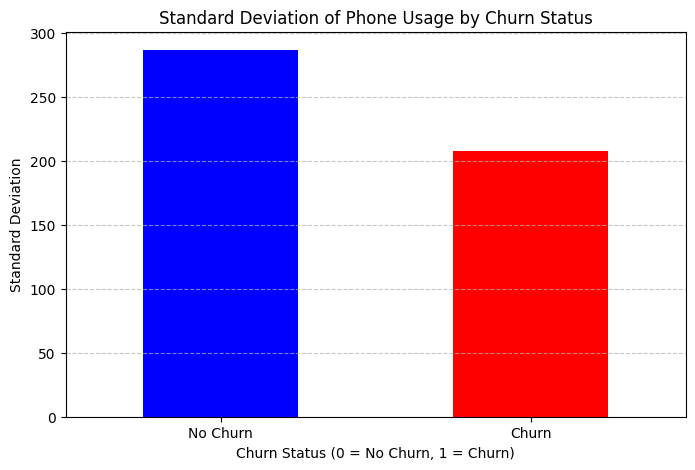

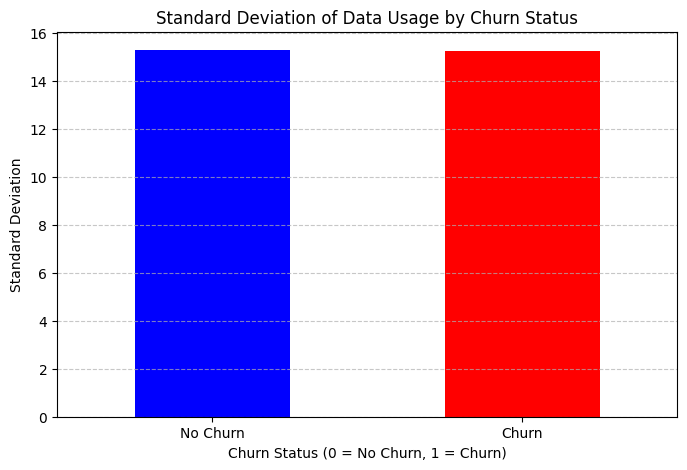

In [ ]:
# Ensure churn_in_3mos is numeric
merged_data['churn_in_3mos'] = merged_data['churn_in_3mos'].astype(int)

# Group by churn status and calculate standard deviation for phone usage
std_phone_usage = merged_data.groupby('churn_in_3mos')['monthly_avg_phone'].std()

# Group by churn status and calculate standard deviation for data usage
std_data_usage = merged_data.groupby('churn_in_3mos')['monthly_avg_data'].std()

# Plot standard deviation of phone usage by churn status
fig, ax = plt.subplots(figsize=(8, 5))
std_phone_usage.plot(kind='bar', color=['blue', 'red'], ax=ax)
ax.set_title('Standard Deviation of Phone Usage by Churn Status')
ax.set_xlabel('Churn Status (0 = No Churn, 1 = Churn)')
ax.set_ylabel('Standard Deviation')
ax.set_xticklabels(['No Churn', 'Churn'], rotation=0)
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

# Plot standard deviation of data usage by churn status
fig, ax = plt.subplots(figsize=(8, 5))
std_data_usage.plot(kind='bar', color=['blue', 'red'], ax=ax)
ax.set_title('Standard Deviation of Data Usage by Churn Status')
ax.set_xlabel('Churn Status (0 = No Churn, 1 = Churn)')
ax.set_ylabel('Standard Deviation')
ax.set_xticklabels(['No Churn', 'Churn'], rotation=0)
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()


<ipython-input-79-b86f85745a8f>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=merged_data["churn_in_3mos"], y=merged_data["monthly_avg_phone"], ax=axes[0], palette=["blue", "red"])
<ipython-input-79-b86f85745a8f>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=merged_data["churn_in_3mos"], y=merged_data["monthly_avg_data"], ax=axes[1], palette=["blue", "red"])


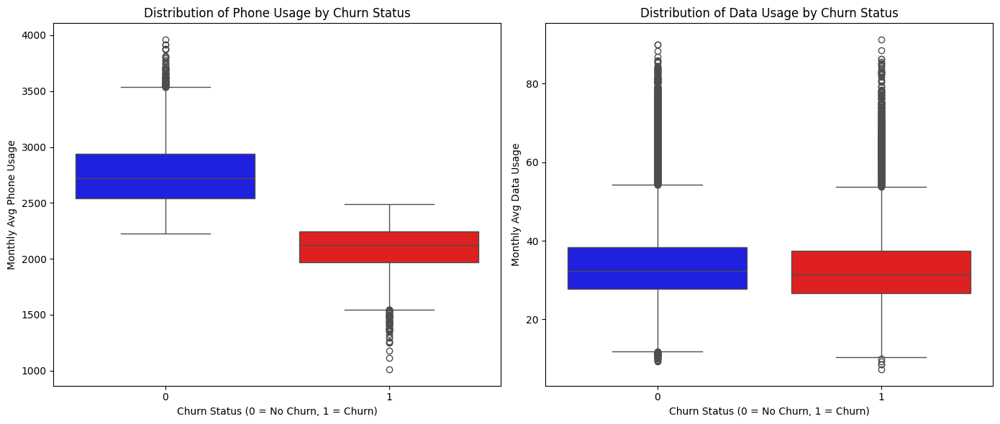

In [ ]:
import seaborn as sns

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Boxplot for phone usage
sns.boxplot(x=merged_data["churn_in_3mos"], y=merged_data["monthly_avg_phone"], ax=axes[0], palette=["blue", "red"])
axes[0].set_title("Distribution of Phone Usage by Churn Status")
axes[0].set_xlabel("Churn Status (0 = No Churn, 1 = Churn)")
axes[0].set_ylabel("Monthly Avg Phone Usage")

# Boxplot for data usage
sns.boxplot(x=merged_data["churn_in_3mos"], y=merged_data["monthly_avg_data"], ax=axes[1], palette=["blue", "red"])
axes[1].set_title("Distribution of Data Usage by Churn Status")
axes[1].set_xlabel("Churn Status (0 = No Churn, 1 = Churn)")
axes[1].set_ylabel("Monthly Avg Data Usage")

plt.tight_layout()
plt.show()


<ipython-input-80-8438b0a0cdd8>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=merged_data["churn_in_3mos"], y=merged_data["monthly_avg_phone"], ax=axes[0], palette=["blue", "red"])
<ipython-input-80-8438b0a0cdd8>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=merged_data["churn_in_3mos"], y=merged_data["monthly_avg_data"], ax=axes[1], palette=["blue", "red"])


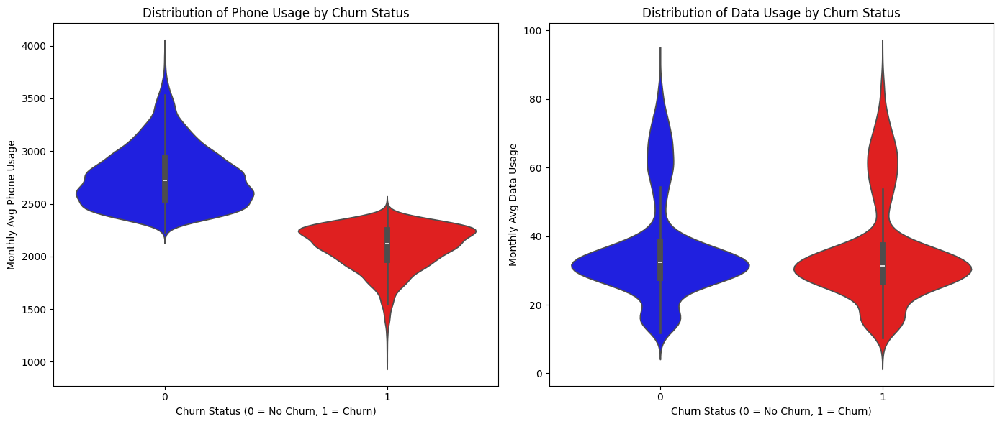

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Violin plot for phone usage
sns.violinplot(x=merged_data["churn_in_3mos"], y=merged_data["monthly_avg_phone"], ax=axes[0], palette=["blue", "red"])
axes[0].set_title("Distribution of Phone Usage by Churn Status")
axes[0].set_xlabel("Churn Status (0 = No Churn, 1 = Churn)")
axes[0].set_ylabel("Monthly Avg Phone Usage")

# Violin plot for data usage
sns.violinplot(x=merged_data["churn_in_3mos"], y=merged_data["monthly_avg_data"], ax=axes[1], palette=["blue", "red"])
axes[1].set_title("Distribution of Data Usage by Churn Status")
axes[1].set_xlabel("Churn Status (0 = No Churn, 1 = Churn)")
axes[1].set_ylabel("Monthly Avg Data Usage")

plt.tight_layout()
plt.show()


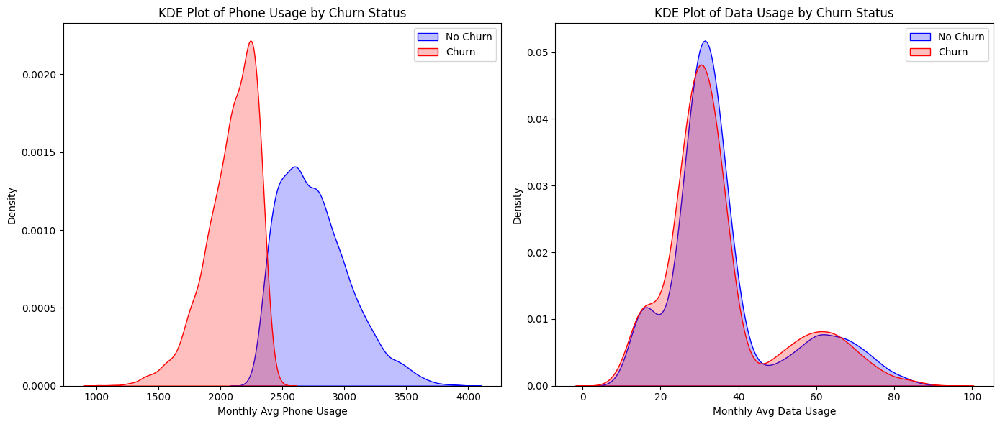

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# KDE plot for phone usage
sns.kdeplot(merged_data[merged_data["churn_in_3mos"] == 0]["monthly_avg_phone"], fill=True, label="No Churn", color="blue", ax=axes[0])
sns.kdeplot(merged_data[merged_data["churn_in_3mos"] == 1]["monthly_avg_phone"], fill=True, label="Churn", color="red", ax=axes[0])
axes[0].set_title("KDE Plot of Phone Usage by Churn Status")
axes[0].set_xlabel("Monthly Avg Phone Usage")
axes[0].set_ylabel("Density")
axes[0].legend()

# KDE plot for data usage
sns.kdeplot(merged_data[merged_data["churn_in_3mos"] == 0]["monthly_avg_data"], fill=True, label="No Churn", color="blue", ax=axes[1])
sns.kdeplot(merged_data[merged_data["churn_in_3mos"] == 1]["monthly_avg_data"], fill=True, label="Churn", color="red", ax=axes[1])
axes[1].set_title("KDE Plot of Data Usage by Churn Status")
axes[1].set_xlabel("Monthly Avg Data Usage")
axes[1].set_ylabel("Density")
axes[1].legend()

plt.tight_layout()
plt.show()


In [ ]:
pd.set_option("display.max_columns", None)  # Show all columns


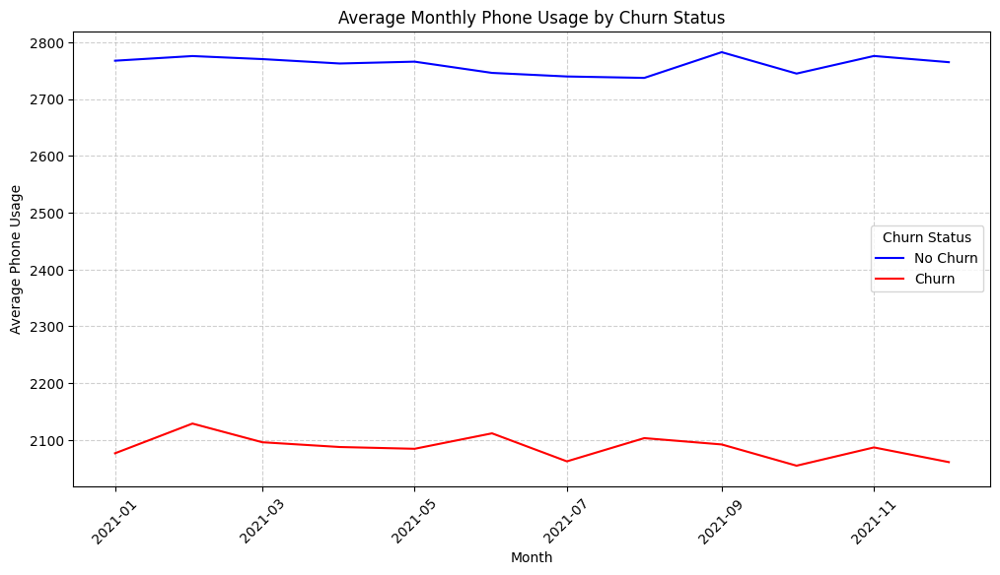

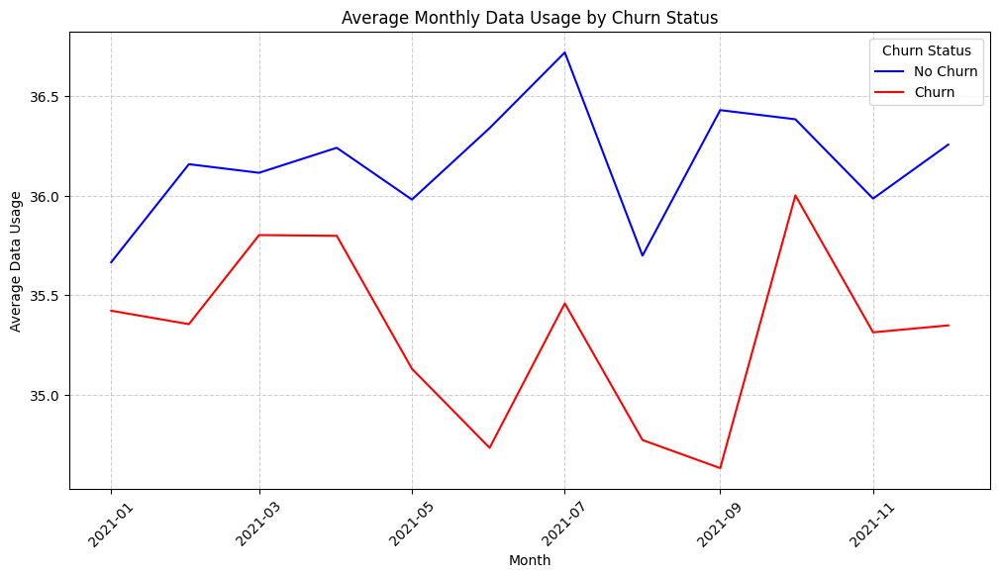

In [ ]:
import seaborn as sns

# Ensure 'month_year' is in datetime format
all_usage_long['month_year'] = pd.to_datetime(all_usage_long['month_year'], format="%Y-%m")

# Define churn labels for better readability
churn_labels = {0: "No Churn", 1: "Churn"}

# Aggregate by month and churn status to calculate average phone and data usage
phone_usage_summary = all_usage_long.groupby(['month_year', 'churn_in_3mos'])['phone_usage'].mean().reset_index()
data_usage_summary = all_usage_long.groupby(['month_year', 'churn_in_3mos'])['data_usage'].mean().reset_index()

# Convert churn status to categorical labels
phone_usage_summary['churn_in_3mos'] = phone_usage_summary['churn_in_3mos'].map(churn_labels)
data_usage_summary['churn_in_3mos'] = data_usage_summary['churn_in_3mos'].map(churn_labels)

# Plot average monthly phone usage by churn status
plt.figure(figsize=(12, 6))
sns.lineplot(data=phone_usage_summary, x='month_year', y='phone_usage', hue='churn_in_3mos', palette=['blue', 'red'])
plt.title("Average Monthly Phone Usage by Churn Status")
plt.xlabel("Month")
plt.ylabel("Average Phone Usage")
plt.legend(title="Churn Status")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# Plot average monthly data usage by churn status
plt.figure(figsize=(12, 6))
sns.lineplot(data=data_usage_summary, x='month_year', y='data_usage', hue='churn_in_3mos', palette=['blue', 'red'])
plt.title("Average Monthly Data Usage by Churn Status")
plt.xlabel("Month")
plt.ylabel("Average Data Usage")
plt.legend(title="Churn Status")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()


RELATIONSHIP APP USAGE AND CHURM

Summary Statistics for App Usage by Churn Status:
                  count      mean       std  min  25%  50%  75%  max
churn_in_3mos                                                      
0              83232.0  0.748102  0.434106  0.0  0.0  1.0  1.0  1.0
1              36768.0  0.750381  0.432799  0.0  1.0  1.0  1.0  1.0


<ipython-input-84-d3f594f979dd>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="churn_label", y="use_app", data=all_usage_long, palette=["blue", "red"], ax=axes[0])
<ipython-input-84-d3f594f979dd>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="churn_label", y="use_app", data=all_usage_long, palette=["blue", "red"], ax=axes[1])


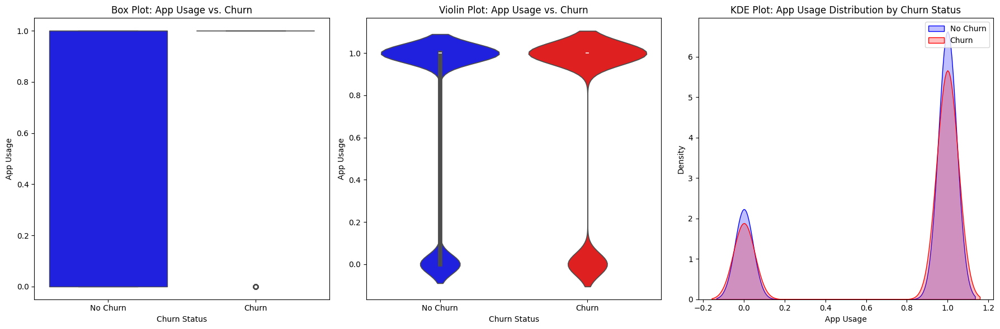

In [ ]:
# Check summary statistics of app usage by churn status
app_usage_summary = all_usage_long.groupby("churn_in_3mos")["use_app"].describe()
print("Summary Statistics for App Usage by Churn Status:\n", app_usage_summary)

# Mapping churn status for readability
churn_labels = {0: "No Churn", 1: "Churn"}
all_usage_long["churn_label"] = all_usage_long["churn_in_3mos"].map(churn_labels)

# Create a figure with multiple plots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Box Plot: App Usage vs. Churn
sns.boxplot(x="churn_label", y="use_app", data=all_usage_long, palette=["blue", "red"], ax=axes[0])
axes[0].set_title("Box Plot: App Usage vs. Churn")
axes[0].set_xlabel("Churn Status")
axes[0].set_ylabel("App Usage")

# Violin Plot: App Usage vs. Churn
sns.violinplot(x="churn_label", y="use_app", data=all_usage_long, palette=["blue", "red"], ax=axes[1])
axes[1].set_title("Violin Plot: App Usage vs. Churn")
axes[1].set_xlabel("Churn Status")
axes[1].set_ylabel("App Usage")

# KDE Plot: App Usage Distribution by Churn Status
sns.kdeplot(all_usage_long[all_usage_long["churn_in_3mos"] == 0]["use_app"], fill=True, label="No Churn", color="blue", ax=axes[2])
sns.kdeplot(all_usage_long[all_usage_long["churn_in_3mos"] == 1]["use_app"], fill=True, label="Churn", color="red", ax=axes[2])
axes[2].set_title("KDE Plot: App Usage Distribution by Churn Status")
axes[2].set_xlabel("App Usage")
axes[2].set_ylabel("Density")
axes[2].legend()

plt.tight_layout()
plt.show()


<ipython-input-85-0206abcd17d8>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=churn_rates, x='Low App Usage (1=Yes, 0=No)', y='Churn Rate', palette=['blue', 'red'])


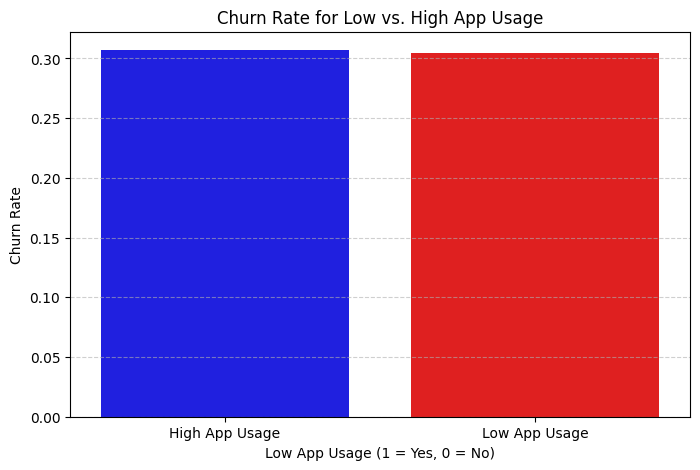

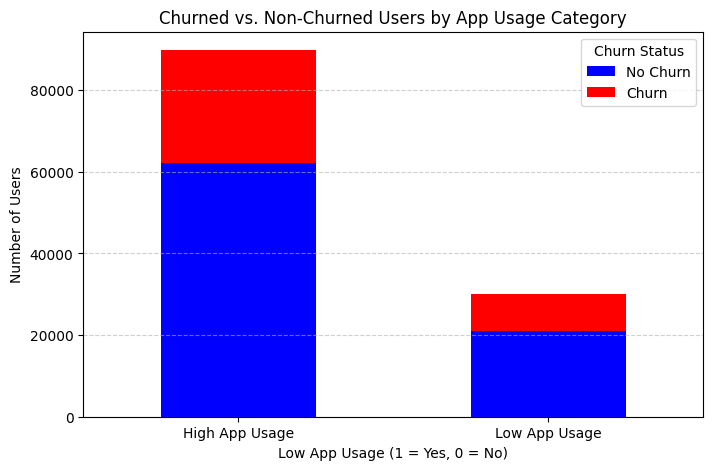

In [ ]:
# Define Low App Usage: Users with use_app == 0
all_usage_long['low_app_usage'] = (all_usage_long['use_app'] == 0).astype(int)

# Compute churn rates for Low vs. High App Usage
churn_rates = all_usage_long.groupby('low_app_usage')['churn_in_3mos'].mean().reset_index()
churn_rates.columns = ['Low App Usage (1=Yes, 0=No)', 'Churn Rate']

# Count the number of churned vs. non-churned users in each app usage category
app_usage_churn_counts = all_usage_long.groupby(['low_app_usage', 'churn_in_3mos']).size().unstack()

# 📊 Bar Plot: Churn Rate by App Usage
plt.figure(figsize=(8, 5))
sns.barplot(data=churn_rates, x='Low App Usage (1=Yes, 0=No)', y='Churn Rate', palette=['blue', 'red'])
plt.title("Churn Rate for Low vs. High App Usage")
plt.xlabel("Low App Usage (1 = Yes, 0 = No)")
plt.ylabel("Churn Rate")
plt.xticks([0, 1], ["High App Usage", "Low App Usage"])
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()

# 📊 Stacked Bar Chart: Distribution of Churn by App Usage Category
app_usage_churn_counts.plot(kind='bar', stacked=True, color=['blue', 'red'], figsize=(8, 5))
plt.title("Churned vs. Non-Churned Users by App Usage Category")
plt.xlabel("Low App Usage (1 = Yes, 0 = No)")
plt.ylabel("Number of Users")
plt.xticks([0, 1], ["High App Usage", "Low App Usage"], rotation=0)
plt.legend(["No Churn", "Churn"], title="Churn Status")
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()


<ipython-input-86-72669652616c>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=churn_rates, x=title_suffix, y='Churn Rate', palette=['blue', 'red'])


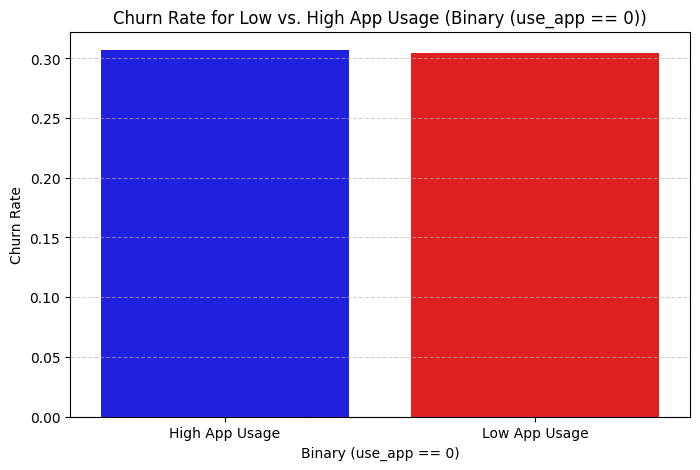

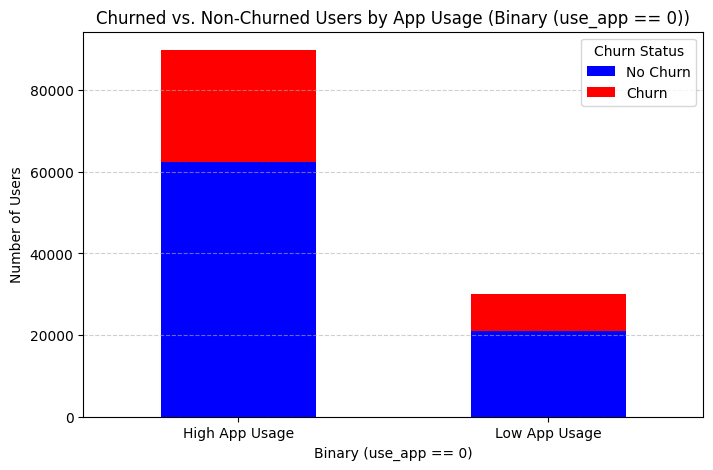

<ipython-input-86-72669652616c>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=churn_rates, x=title_suffix, y='Churn Rate', palette=['blue', 'red'])


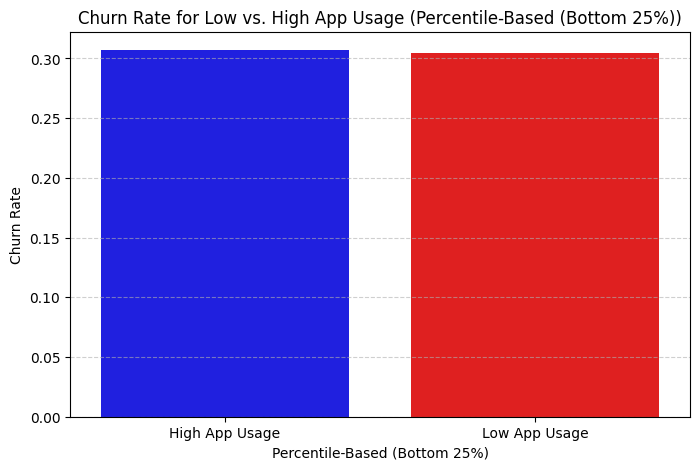

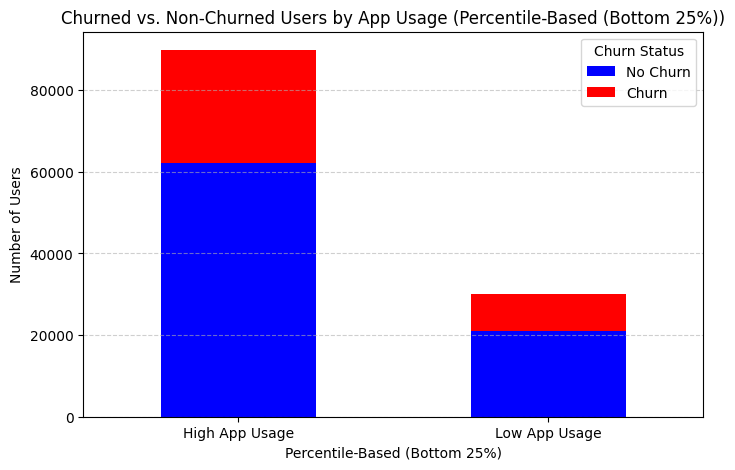

In [ ]:
# Approach 1: Binary Low App Usage (users with use_app == 0)
all_usage_long['low_app_usage_binary'] = (all_usage_long['use_app'] == 0).astype(int)

# Approach 2: Percentile-Based Low App Usage (bottom 25%)
threshold_25 = all_usage_long['use_app'].quantile(0.25)
all_usage_long['low_app_usage_percentile'] = (all_usage_long['use_app'] <= threshold_25).astype(int)

# Function to compute churn rates and plot results
def plot_churn_analysis(usage_column, title_suffix):
    churn_rates = all_usage_long.groupby(usage_column)['churn_in_3mos'].mean().reset_index()
    churn_rates.columns = [title_suffix, 'Churn Rate']

    app_usage_churn_counts = all_usage_long.groupby([usage_column, 'churn_in_3mos']).size().unstack()

    # 📊 Bar Chart: Churn Rate by App Usage
    plt.figure(figsize=(8, 5))
    sns.barplot(data=churn_rates, x=title_suffix, y='Churn Rate', palette=['blue', 'red'])
    plt.title(f"Churn Rate for Low vs. High App Usage ({title_suffix})")
    plt.xlabel(title_suffix)
    plt.ylabel("Churn Rate")
    plt.xticks([0, 1], ["High App Usage", "Low App Usage"])
    plt.grid(axis='y', linestyle="--", alpha=0.6)
    plt.show()

    # 📊 Stacked Bar Chart: Churned vs. Non-Churned Users
    app_usage_churn_counts.plot(kind='bar', stacked=True, color=['blue', 'red'], figsize=(8, 5))
    plt.title(f"Churned vs. Non-Churned Users by App Usage ({title_suffix})")
    plt.xlabel(title_suffix)
    plt.ylabel("Number of Users")
    plt.xticks([0, 1], ["High App Usage", "Low App Usage"], rotation=0)
    plt.legend(["No Churn", "Churn"], title="Churn Status")
    plt.grid(axis='y', linestyle="--", alpha=0.6)
    plt.show()

# Run the analysis for both thresholds
plot_churn_analysis('low_app_usage_binary', "Binary (use_app == 0)")
plot_churn_analysis('low_app_usage_percentile', "Percentile-Based (Bottom 25%)")


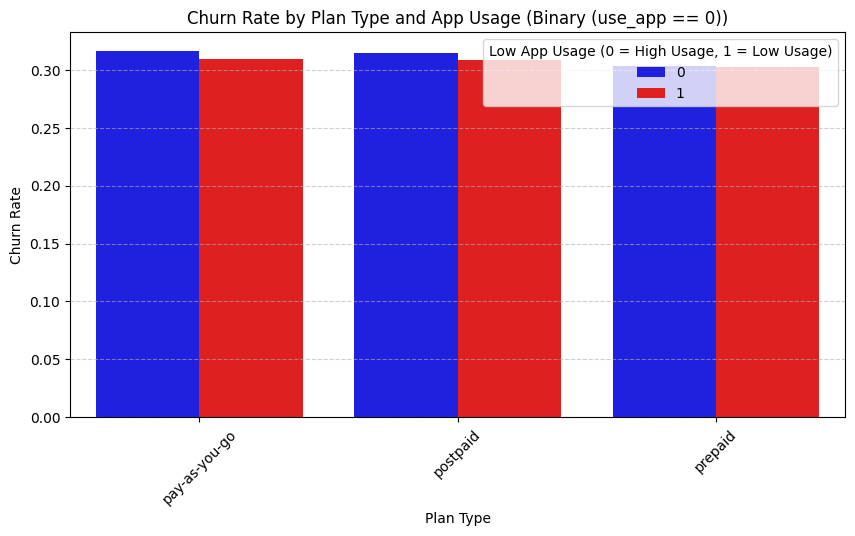

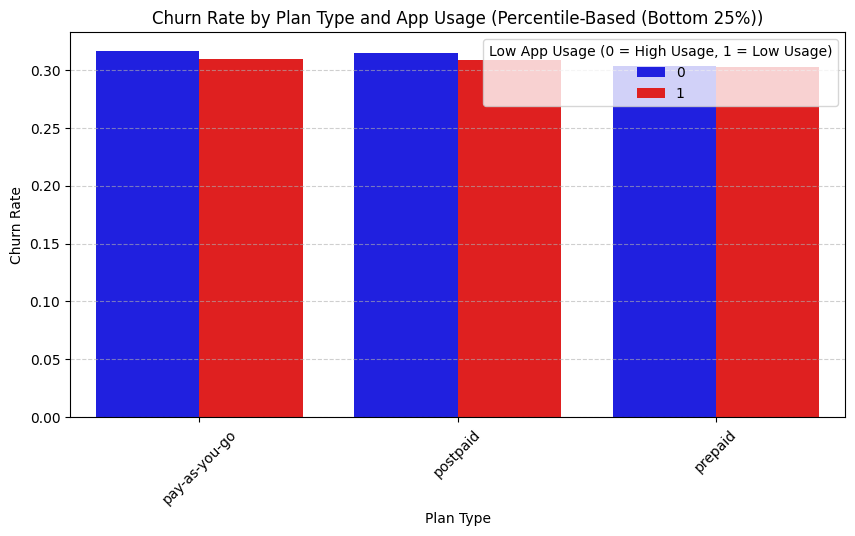

In [ ]:
# Ensure 'plan_type' is categorical
all_usage_long['plan_type'] = all_usage_long['plan_type'].astype(str)

# Define Low App Usage (Binary: No app engagement)
all_usage_long['low_app_usage_binary'] = (all_usage_long['use_app'] == 0).astype(int).astype(str)  # Convert to string

# Define Low App Usage (Percentile-Based: Bottom 25%)
threshold_25 = all_usage_long['use_app'].quantile(0.25)
all_usage_long['low_app_usage_percentile'] = (all_usage_long['use_app'] <= threshold_25).astype(int).astype(str)  # Convert to string

# Function to compute churn rates for low vs. high app usage by plan type
def compute_churn_by_plan(usage_column):
    churn_by_plan = all_usage_long.groupby(['plan_type', usage_column])['churn_in_3mos'].mean().reset_index()
    churn_by_plan.columns = ['Plan Type', 'Low App Usage', 'Churn Rate']
    return churn_by_plan

# Compute churn rates for both definitions of low app usage
churn_by_plan_binary = compute_churn_by_plan('low_app_usage_binary')
churn_by_plan_percentile = compute_churn_by_plan('low_app_usage_percentile')

# Function to plot churn rates for low vs. high app usage by plan type
def plot_churn_by_plan(churn_data, title_suffix):
    churn_data['Low App Usage'] = churn_data['Low App Usage'].astype(str)  # Ensure categorical format
    plt.figure(figsize=(10, 5))
    sns.barplot(data=churn_data, x='Plan Type', y='Churn Rate', hue='Low App Usage', palette=['blue', 'red'])
    plt.title(f"Churn Rate by Plan Type and App Usage ({title_suffix})")
    plt.xlabel("Plan Type")
    plt.ylabel("Churn Rate")
    plt.legend(title="Low App Usage (0 = High Usage, 1 = Low Usage)")
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle="--", alpha=0.6)
    plt.show()

# 📊 Plot churn rates for both thresholds
plot_churn_by_plan(churn_by_plan_binary, "Binary (use_app == 0)")
plot_churn_by_plan(churn_by_plan_percentile, "Percentile-Based (Bottom 25%)")


RATE OF CHURN BY QUARTER

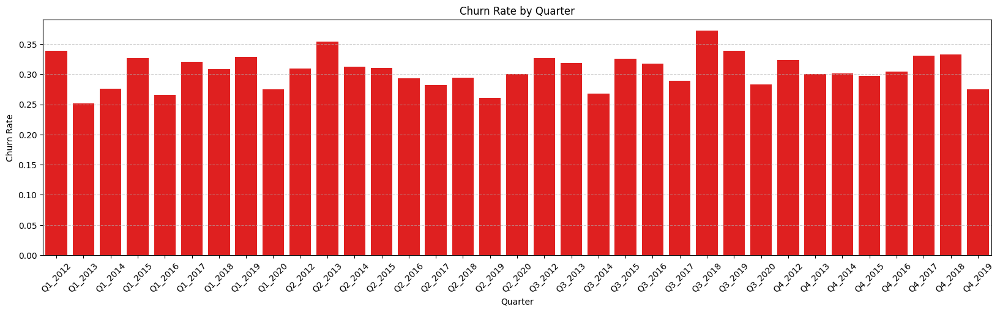

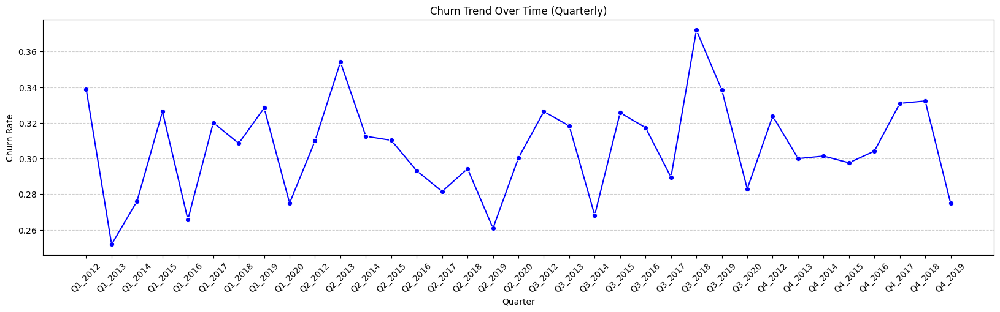

In [ ]:
# Ensure 'join_quarter' is a string for proper grouping
merged_data['join_quarter'] = merged_data['join_quarter'].astype(str)

# Compute churn rate per quarter
churn_by_quarter = merged_data.groupby('join_quarter')['churn_in_3mos'].mean().reset_index()
churn_by_quarter.columns = ['Join Quarter', 'Churn Rate']

# Sort quarters chronologically
churn_by_quarter = churn_by_quarter.sort_values(by='Join Quarter')

# 📊 Bar Chart: Churn Rate by Quarter
plt.figure(figsize=(20, 5))
sns.barplot(data=churn_by_quarter, x='Join Quarter', y='Churn Rate', color='red')
plt.title("Churn Rate by Quarter")
plt.xlabel("Quarter")
plt.ylabel("Churn Rate")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()

# 📉 Line Chart: Churn Trend Over Time
plt.figure(figsize=(20, 5))
sns.lineplot(data=churn_by_quarter, x='Join Quarter', y='Churn Rate', marker='o', color='blue')
plt.title("Churn Trend Over Time (Quarterly)")
plt.xlabel("Quarter")
plt.ylabel("Churn Rate")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()


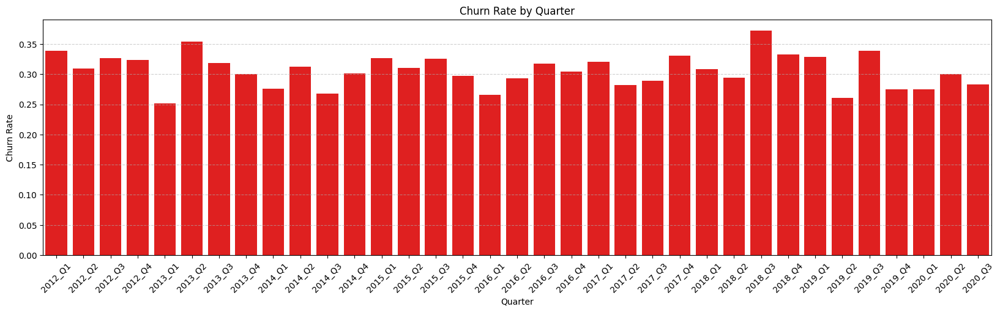

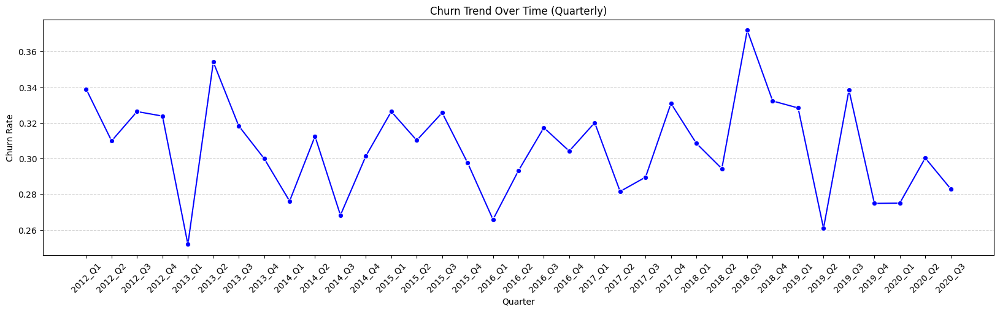

In [ ]:
# Ensure 'join_quarter' is a string
merged_data['join_quarter'] = merged_data['join_quarter'].astype(str)

# Transform 'join_quarter' from "Q#_YYYY" to "YYYY_Q#"
merged_data['join_quarter_transformed'] = merged_data['join_quarter'].apply(lambda x: f"{x.split('_')[1]}_{x.split('_')[0]}")

# Compute churn rate per quarter
churn_by_quarter = merged_data.groupby('join_quarter_transformed')['churn_in_3mos'].mean().reset_index()
churn_by_quarter.columns = ['Join Quarter', 'Churn Rate']

# Sort quarters chronologically
churn_by_quarter = churn_by_quarter.sort_values(by='Join Quarter')

# 📊 Bar Chart: Churn Rate by Quarter
plt.figure(figsize=(20, 5))
sns.barplot(data=churn_by_quarter, x='Join Quarter', y='Churn Rate', color='red')
plt.title("Churn Rate by Quarter")
plt.xlabel("Quarter")
plt.ylabel("Churn Rate")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()

# 📉 Line Chart: Churn Trend Over Time
plt.figure(figsize=(20, 5))
sns.lineplot(data=churn_by_quarter, x='Join Quarter', y='Churn Rate', marker='o', color='blue')
plt.title("Churn Trend Over Time (Quarterly)")
plt.xlabel("Quarter")
plt.ylabel("Churn Rate")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()


COMPLAINTS CATEGORY AND CHURN RELATIONSHIP + OTHER INSIGTHS

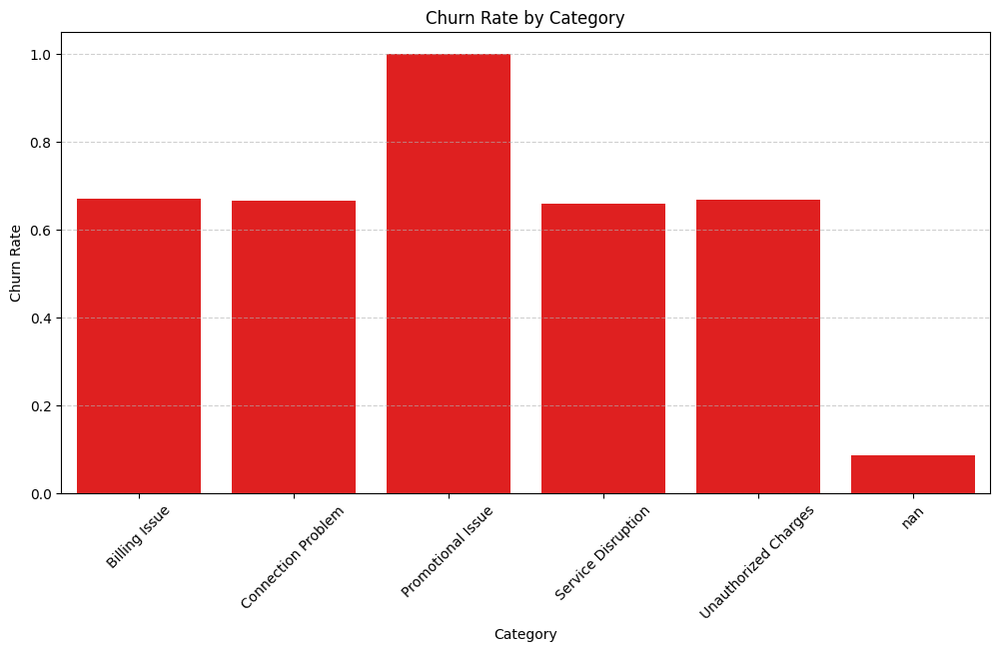

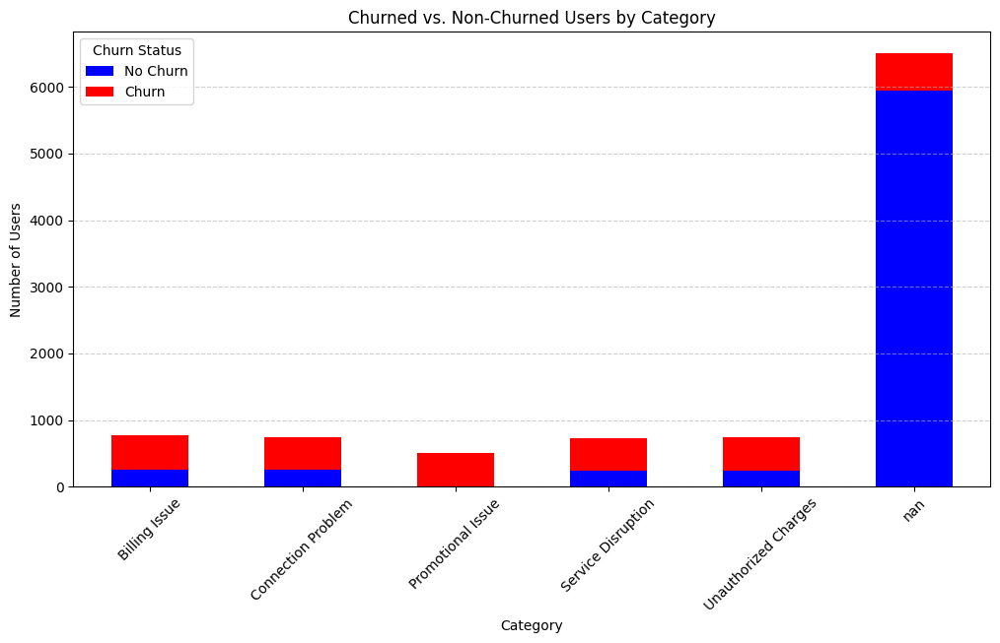

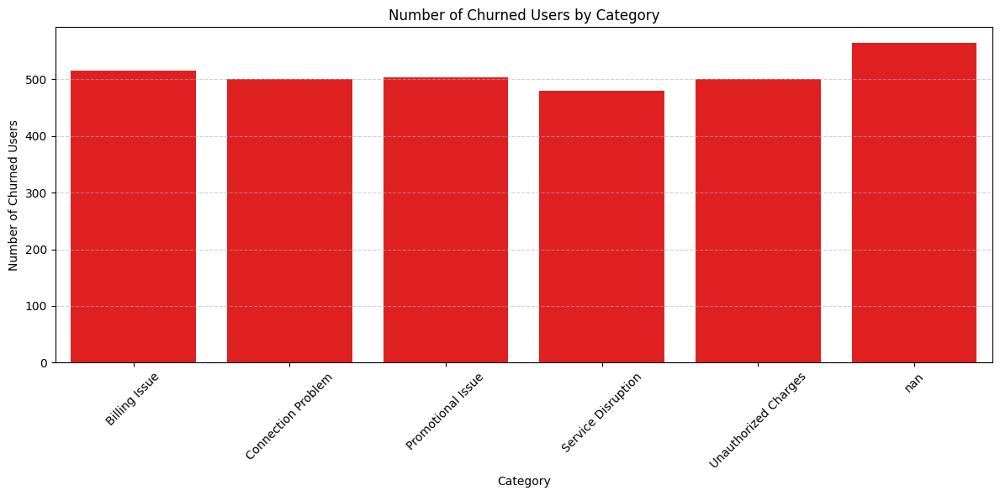

In [ ]:
# Ensure 'category' is a string for proper grouping
merged_data['category'] = merged_data['category'].astype(str)

# Compute churn rate per category
churn_by_category = merged_data.groupby('category')['churn_in_3mos'].mean().reset_index()
churn_by_category.columns = ['Category', 'Churn Rate']

# Compute churned vs. non-churned user counts per category
category_churn_counts = merged_data.groupby(['category', 'churn_in_3mos']).size().unstack()

# 📊 Bar Chart: Churn Rate by Category
plt.figure(figsize=(12, 6))
sns.barplot(data=churn_by_category, x='Category', y='Churn Rate', color='red')
plt.title("Churn Rate by Category")
plt.xlabel("Category")
plt.ylabel("Churn Rate")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()

# 📊 Stacked Bar Chart: Churned vs. Non-Churned Users by Category
category_churn_counts.plot(kind='bar', stacked=True, color=['blue', 'red'], figsize=(12, 6))
plt.title("Churned vs. Non-Churned Users by Category")
plt.xlabel("Category")
plt.ylabel("Number of Users")
plt.xticks(rotation=45)
plt.legend(["No Churn", "Churn"], title="Churn Status")
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()

# Ensure 'category' is a string and drop NaN values before analysis
merged_data['category'] = merged_data['category'].astype(str)

# Drop rows with NaN values in 'category' or 'churn_in_3mos' columns
merged_data_filtered = merged_data.dropna(subset=['category', 'churn_in_3mos'])

# Filter for churned users (churn_in_3mos == 1)
churned_users = merged_data_filtered[merged_data_filtered['churn_in_3mos'] == 1]

# Compute the number of churned users by category
churned_by_category = churned_users.groupby('category').size().reset_index(name='Churned Users')

# 📊 Bar Chart: Number of Churned Users by Category
plt.figure(figsize=(12, 6))
sns.barplot(data=churned_by_category, x='category', y='Churned Users', color='red')
plt.title("Number of Churned Users by Category")
plt.xlabel("Category")
plt.ylabel("Number of Churned Users")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.tight_layout()  # Adjust layout to avoid clipping
plt.show()


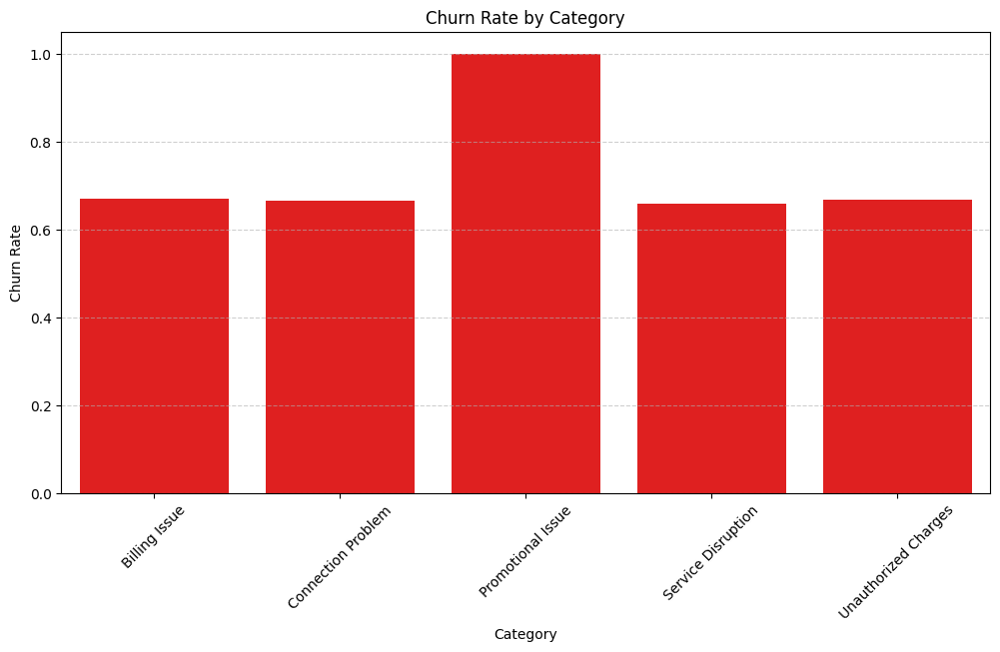

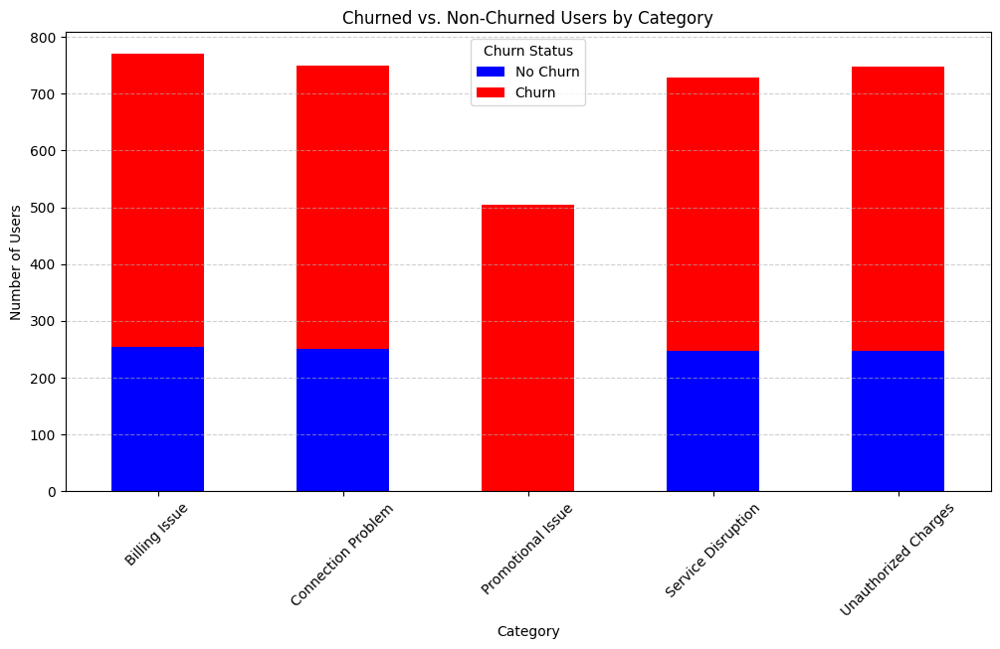

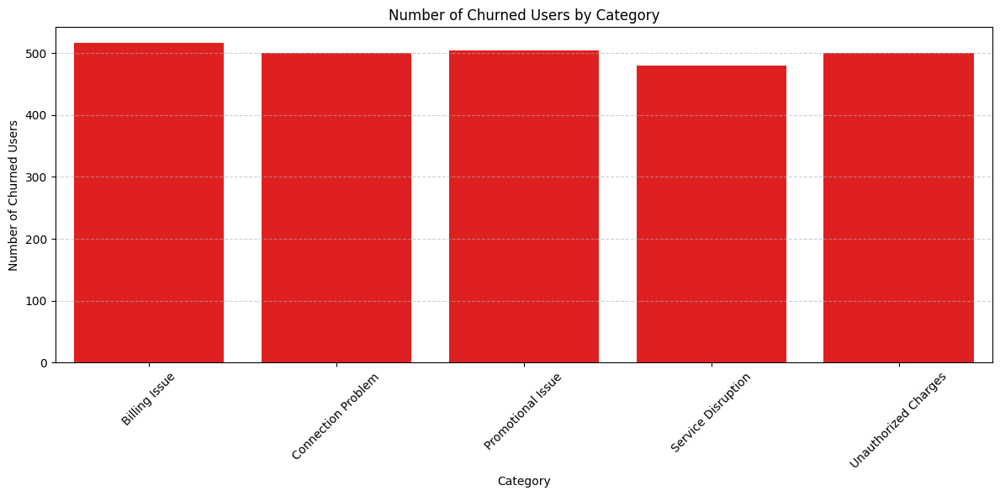

In [ ]:
# Ensure 'category' is a string and drop NaN values before analysis
merged_data['category'] = merged_data['category'].astype(str)
merged_data_filtered = merged_data.dropna(subset=['category'])  # Ensure NaN values are removed

# Remove rows where 'category' is explicitly labeled as 'nan' (sometimes it gets converted to string)
merged_data_filtered = merged_data_filtered[merged_data_filtered['category'].str.lower() != 'nan']

# Compute churn rate per category
churn_by_category = merged_data_filtered.groupby('category')['churn_in_3mos'].mean().reset_index()
churn_by_category.columns = ['Category', 'Churn Rate']

# Compute churned vs. non-churned user counts per category
category_churn_counts = merged_data_filtered.groupby(['category', 'churn_in_3mos']).size().unstack(fill_value=0)  # Fill missing values with 0

# 📊 Bar Chart: Churn Rate by Category
plt.figure(figsize=(12, 6))
sns.barplot(data=churn_by_category, x='Category', y='Churn Rate', color='red')
plt.title("Churn Rate by Category")
plt.xlabel("Category")
plt.ylabel("Churn Rate")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()

# 📊 Stacked Bar Chart: Churned vs. Non-Churned Users by Category
category_churn_counts.plot(kind='bar', stacked=True, color=['blue', 'red'], figsize=(12, 6))
plt.title("Churned vs. Non-Churned Users by Category")
plt.xlabel("Category")
plt.ylabel("Number of Users")
plt.xticks(rotation=45)
plt.legend(["No Churn", "Churn"], title="Churn Status")
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()


# Ensure 'category' is a string and strip whitespace
merged_data['category'] = merged_data['category'].astype(str).str.strip()

# Remove rows where 'category' is NaN or contains invalid entries like 'nan', 'null', or empty strings
merged_data_filtered = merged_data[~merged_data['category'].isin(['nan', 'null', 'NaN', 'None', ''])]

# Drop rows where 'category' or 'churn_in_3mos' are NaN after filtering
merged_data_filtered = merged_data_filtered.dropna(subset=['category', 'churn_in_3mos'])

# Filter for churned users (churn_in_3mos == 1)
churned_users = merged_data_filtered[merged_data_filtered['churn_in_3mos'] == 1]

# Compute the number of churned users by category
churned_by_category = churned_users.groupby('category').size().reset_index(name='Churned Users')

# 📊 Bar Chart: Number of Churned Users by Category
plt.figure(figsize=(12, 6))
sns.barplot(data=churned_by_category, x='category', y='Churned Users', color='red')
plt.title("Number of Churned Users by Category")
plt.xlabel("Category")
plt.ylabel("Number of Churned Users")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.tight_layout()  # Adjust layout to avoid clipping
plt.show()

<ipython-input-92-cda988fddae3>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=merged_data_filtered, x="category", y="churn_in_3mos", palette="Set2")


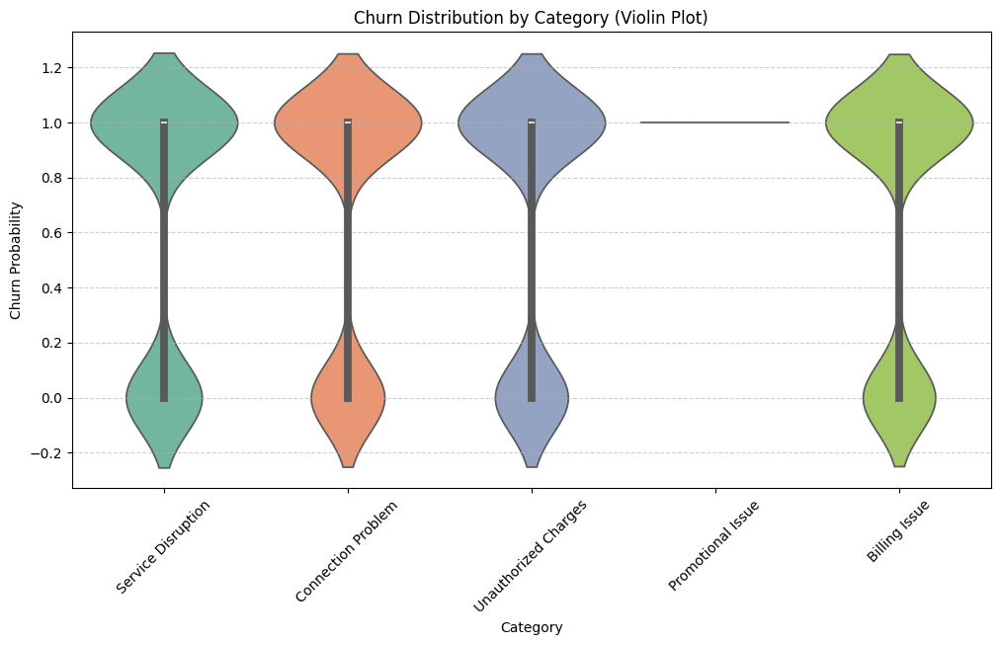

In [ ]:
# Ensure 'category' is a string and drop NaN values before analysis
merged_data['category'] = merged_data['category'].astype(str)
merged_data_filtered = merged_data.dropna(subset=['category'])  # Remove NaN values

# Remove rows where 'category' is explicitly labeled as 'nan' (sometimes it gets converted to string)
merged_data_filtered = merged_data_filtered[merged_data_filtered['category'].str.lower() != 'nan']

# 📊 Violin Plot: Churn Distribution by Category
plt.figure(figsize=(12, 6))
sns.violinplot(data=merged_data_filtered, x="category", y="churn_in_3mos", palette="Set2")
plt.title("Churn Distribution by Category (Violin Plot)")
plt.xlabel("Category")
plt.ylabel("Churn Probability")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()


<ipython-input-93-3c61dcd4c548>:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=merged_data_filtered, x="churn_in_3mos", hue="category", fill=False, common_norm=False, palette="Set2", lw=2)


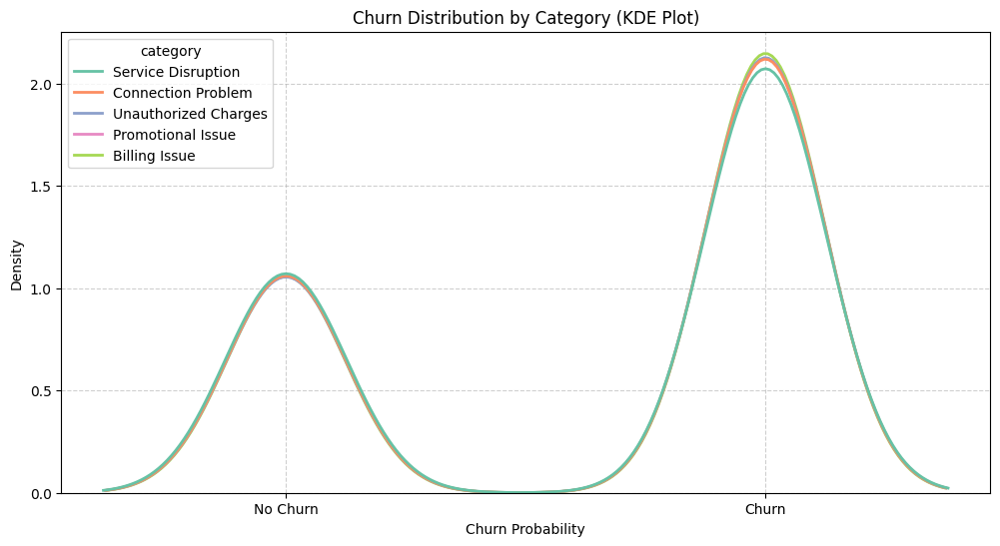

In [ ]:
# Ensure 'category' is a string and drop NaN values before analysis
merged_data['category'] = merged_data['category'].astype(str)
merged_data_filtered = merged_data.dropna(subset=['category'])  # Remove NaN values

# Remove rows where 'category' is explicitly labeled as 'nan' (sometimes it gets converted to string)
merged_data_filtered = merged_data_filtered[merged_data_filtered['category'].str.lower() != 'nan']

# 📊 KDE Plot: Churn Distribution by Category (Line Only)
plt.figure(figsize=(12, 6))
sns.kdeplot(data=merged_data_filtered, x="churn_in_3mos", hue="category", fill=False, common_norm=False, palette="Set2", lw=2)
plt.title("Churn Distribution by Category (KDE Plot)")
plt.xlabel("Churn Probability")
plt.ylabel("Density")
plt.xticks([0, 1], ["No Churn", "Churn"])
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()


<ipython-input-94-a46e1d4d1960>:16: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=merged_data_filtered[merged_data_filtered['category'] == category],


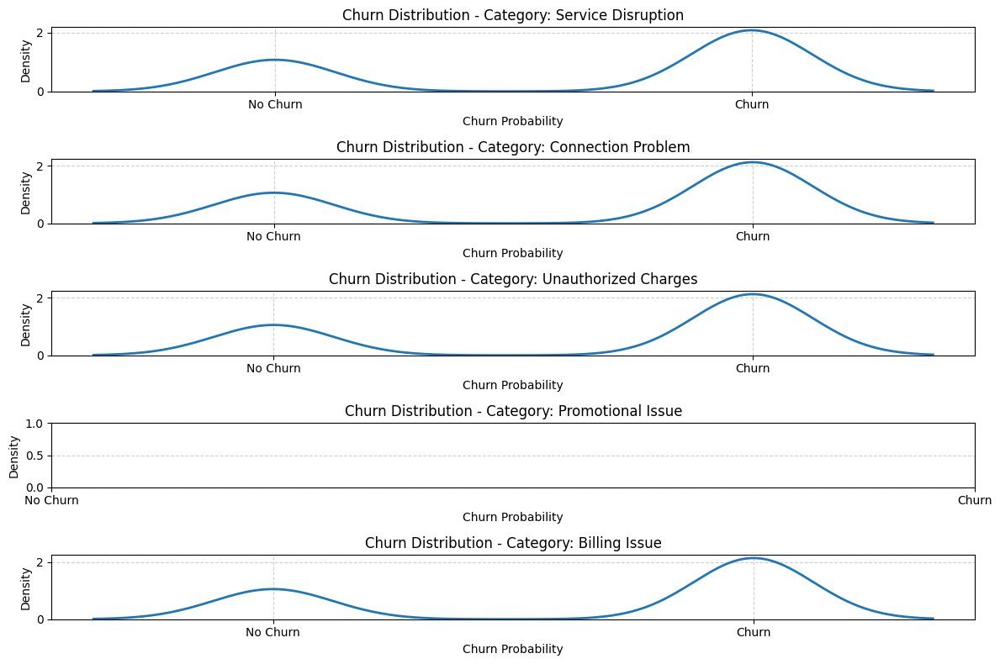

In [ ]:
# Ensure 'category' is a string and drop NaN values before analysis
merged_data['category'] = merged_data['category'].astype(str)
merged_data_filtered = merged_data.dropna(subset=['category'])  # Remove NaN values

# Remove rows where 'category' is explicitly labeled as 'nan' (sometimes it gets converted to string)
merged_data_filtered = merged_data_filtered[merged_data_filtered['category'].str.lower() != 'nan']

# Get unique categories for plotting
categories = merged_data_filtered['category'].unique()

# Plot one KDE per category
plt.figure(figsize=(12, 8))

for idx, category in enumerate(categories):
    plt.subplot(len(categories), 1, idx+1)  # Create a new subplot for each category
    sns.kdeplot(data=merged_data_filtered[merged_data_filtered['category'] == category],
                x="churn_in_3mos", fill=False, common_norm=False, lw=2)
    plt.title(f"Churn Distribution - Category: {category}")
    plt.xlabel("Churn Probability")
    plt.ylabel("Density")
    plt.xticks([0, 1], ["No Churn", "Churn"])
    plt.grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()  # Adjust subplots to fit properly
plt.show()


<ipython-input-95-b286a09f91a5>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=complaint_churn_rate.index, y=complaint_churn_rate.values, palette=["blue", "red"])


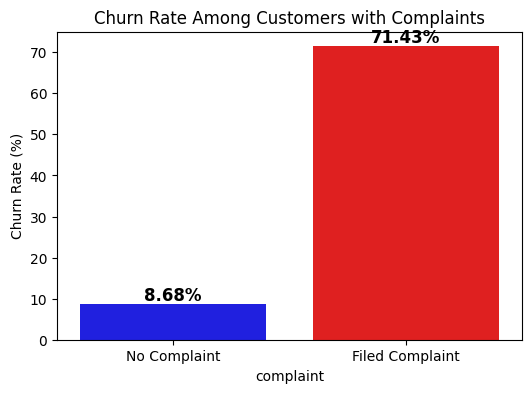

In [ ]:
# Complaints Impact on Churn
complaint_churn_rate = merged_data.groupby('complaint')['churn_in_3mos'].mean() * 100

plt.figure(figsize=(6, 4))
ax = sns.barplot(x=complaint_churn_rate.index, y=complaint_churn_rate.values, palette=["blue", "red"])
plt.xticks([0, 1], ['No Complaint', 'Filed Complaint'])
plt.ylabel("Churn Rate (%)")
plt.title("Churn Rate Among Customers with Complaints")

# Add values on bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.show()

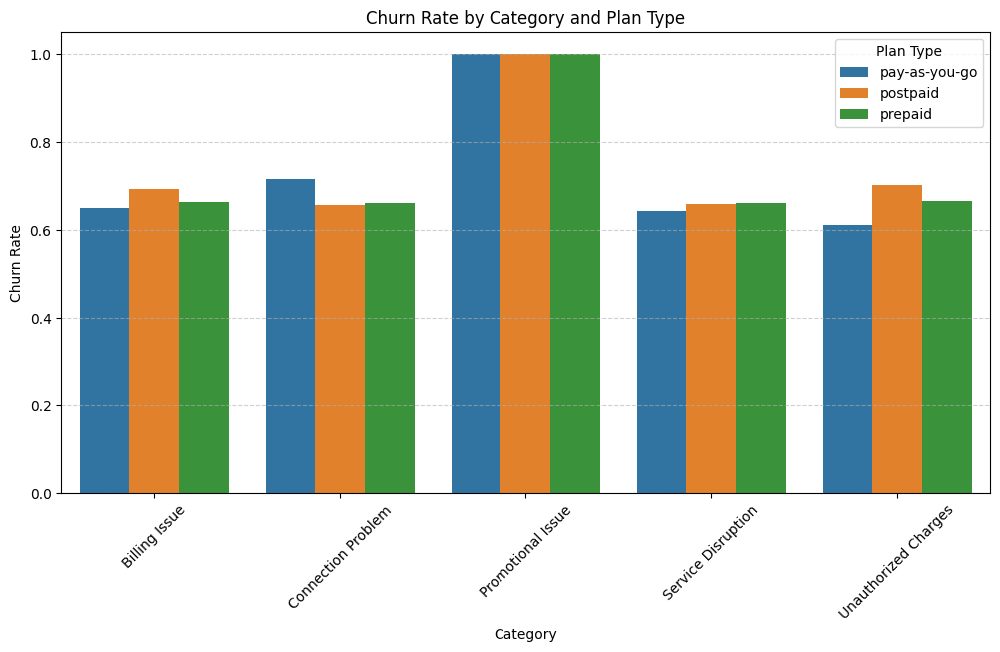

In [ ]:
# Compare Churn Rate with Plan Type within each Category
churn_by_category_plan = merged_data_filtered.groupby(['category', 'plan_type'])['churn_in_3mos'].mean().reset_index()
churn_by_category_plan.columns = ['Category', 'Plan Type', 'Churn Rate']

# 📊 Bar Chart: Churn Rate by Category and Plan Type
plt.figure(figsize=(12, 6))
sns.barplot(data=churn_by_category_plan, x='Category', y='Churn Rate', hue='Plan Type')
plt.title("Churn Rate by Category and Plan Type")
plt.xlabel("Category")
plt.ylabel("Churn Rate")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.show()



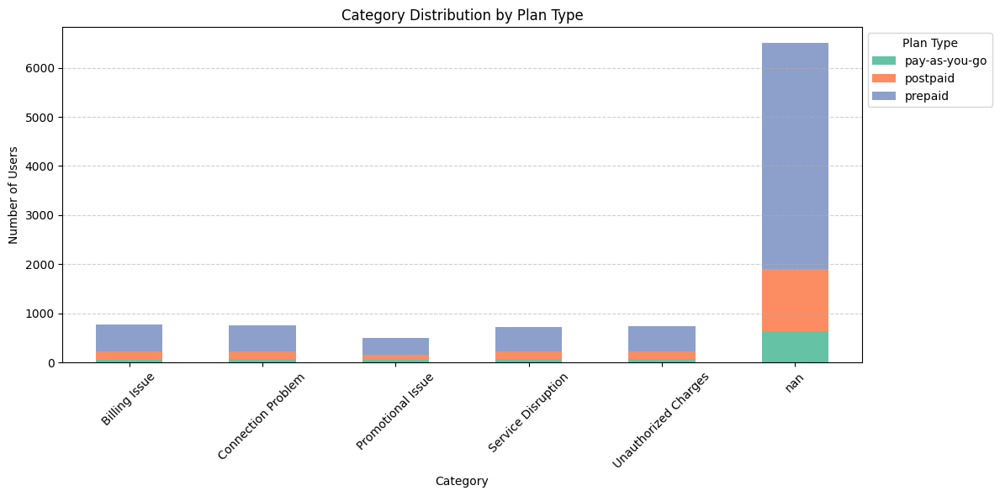

In [ ]:
# Ensure 'category' and 'plan_type' are strings for proper grouping
merged_data['category'] = merged_data['category'].astype(str)
merged_data['plan_type'] = merged_data['plan_type'].astype(str)

# Compute the distribution of categories by plan type
category_plan_counts = merged_data.groupby(['category', 'plan_type']).size().unstack(fill_value=0)

# 📊 Stacked Bar Chart: Category Distribution by Plan Type
category_plan_counts.plot(kind='bar', stacked=True, figsize=(12, 6), color=sns.color_palette("Set2"))
plt.title("Category Distribution by Plan Type")
plt.xlabel("Category")
plt.ylabel("Number of Users")
plt.xticks(rotation=45)
plt.legend(title="Plan Type", bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.tight_layout()  # Adjust layout to avoid clipping
plt.show()


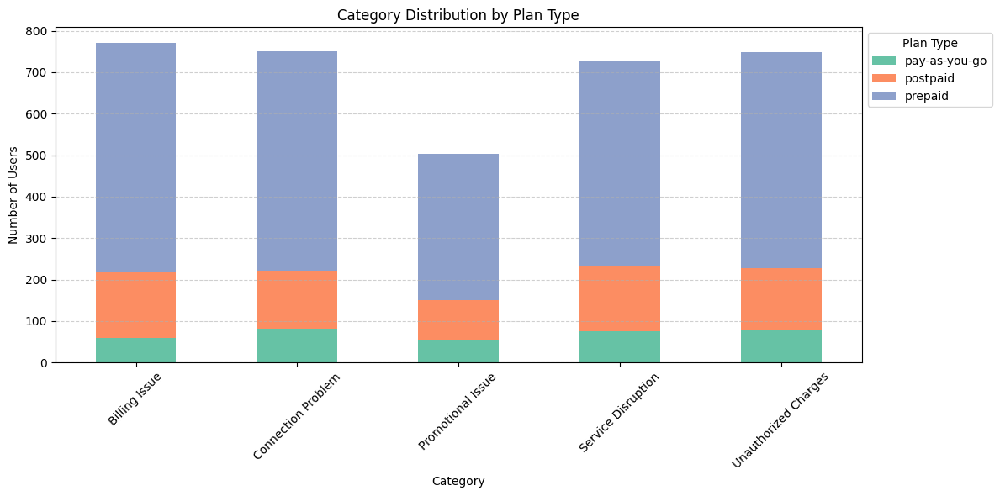

In [ ]:
# Ensure 'category' and 'plan_type' are strings and drop rows with NaN or "nan"/"null" values in these columns
merged_data['category'] = merged_data['category'].astype(str)
merged_data['plan_type'] = merged_data['plan_type'].astype(str)

# Drop rows where 'category' or 'plan_type' are NaN or "nan"/"null" as strings
merged_data_filtered = merged_data[~merged_data['category'].isin(['nan', 'null', 'NaN', 'None', ''])]  # Remove invalid entries
merged_data_filtered = merged_data_filtered[~merged_data_filtered['plan_type'].isin(['nan', 'null', 'NaN', 'None', ''])]  # Remove invalid entries

# Compute the distribution of categories by plan type
category_plan_counts = merged_data_filtered.groupby(['category', 'plan_type']).size().unstack(fill_value=0)

# 📊 Stacked Bar Chart: Category Distribution by Plan Type
category_plan_counts.plot(kind='bar', stacked=True, figsize=(12, 6), color=sns.color_palette("Set2"))
plt.title("Category Distribution by Plan Type")
plt.xlabel("Category")
plt.ylabel("Number of Users")
plt.xticks(rotation=45)
plt.legend(title="Plan Type", bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.tight_layout()  # Adjust layout to avoid clipping
plt.show()


## Model Preperocessing

In [ ]:
print(f"Number of columns: {merged_data.shape[1]}")

Number of columns: 59


In [ ]:
# Saving as an XSLX to better analyze data

merged_data.to_excel("merged_data.xlsx", index=False)

In [ ]:
print(merged_data.columns)

Index(['customer_id', 'birth_date', 'join_date', 'churn_in_3mos',
       'plan_pay-as-you-go', 'plan_postpaid', 'plan_prepaid', 'age_at_joining',
       'years_on_plan', 'data_usage_2021-01-01 00:00:00',
       'data_usage_2021-02-01 00:00:00', 'data_usage_2021-03-01 00:00:00',
       'data_usage_2021-04-01 00:00:00', 'data_usage_2021-05-01 00:00:00',
       'data_usage_2021-06-01 00:00:00', 'data_usage_2021-07-01 00:00:00',
       'data_usage_2021-08-01 00:00:00', 'data_usage_2021-09-01 00:00:00',
       'data_usage_2021-10-01 00:00:00', 'data_usage_2021-11-01 00:00:00',
       'data_usage_2021-12-01 00:00:00', 'phone_usage_2021-01-01 00:00:00',
       'phone_usage_2021-02-01 00:00:00', 'phone_usage_2021-03-01 00:00:00',
       'phone_usage_2021-04-01 00:00:00', 'phone_usage_2021-05-01 00:00:00',
       'phone_usage_2021-06-01 00:00:00', 'phone_usage_2021-07-01 00:00:00',
       'phone_usage_2021-08-01 00:00:00', 'phone_usage_2021-09-01 00:00:00',
       'phone_usage_2021-10-01 00:00:

In [ ]:
# Converting plan columns into int
merged_data[['plan_pay-as-you-go', 'plan_postpaid', 'plan_prepaid']] = merged_data[['plan_pay-as-you-go', 'plan_postpaid', 'plan_prepaid']].astype(int)

In [ ]:
# Dropping unnecessary columns and categorical variables created for EDA
merged_data.drop(columns=['customer_id','category','plan_type','app_usage_bins','phone_usage_bins', 'join_quarter','join_month', 'category', 'issue', 'action_required','join_quarter_transformed'], inplace=True)

Here most of the categorical variables, and variables created for the EDA, are removed. Furthermore, before completing a correlation analysis and removing redundant variables, further inspection is necessary for more duplicated columns, such as:
birth_date and Join_date with age_at_joining and years_on_plan, as they say the same thing

In [ ]:
print(merged_data.columns)

Index(['birth_date', 'join_date', 'churn_in_3mos', 'plan_pay-as-you-go',
       'plan_postpaid', 'plan_prepaid', 'age_at_joining', 'years_on_plan',
       'data_usage_2021-01-01 00:00:00', 'data_usage_2021-02-01 00:00:00',
       'data_usage_2021-03-01 00:00:00', 'data_usage_2021-04-01 00:00:00',
       'data_usage_2021-05-01 00:00:00', 'data_usage_2021-06-01 00:00:00',
       'data_usage_2021-07-01 00:00:00', 'data_usage_2021-08-01 00:00:00',
       'data_usage_2021-09-01 00:00:00', 'data_usage_2021-10-01 00:00:00',
       'data_usage_2021-11-01 00:00:00', 'data_usage_2021-12-01 00:00:00',
       'phone_usage_2021-01-01 00:00:00', 'phone_usage_2021-02-01 00:00:00',
       'phone_usage_2021-03-01 00:00:00', 'phone_usage_2021-04-01 00:00:00',
       'phone_usage_2021-05-01 00:00:00', 'phone_usage_2021-06-01 00:00:00',
       'phone_usage_2021-07-01 00:00:00', 'phone_usage_2021-08-01 00:00:00',
       'phone_usage_2021-09-01 00:00:00', 'phone_usage_2021-10-01 00:00:00',
       'phone_usa

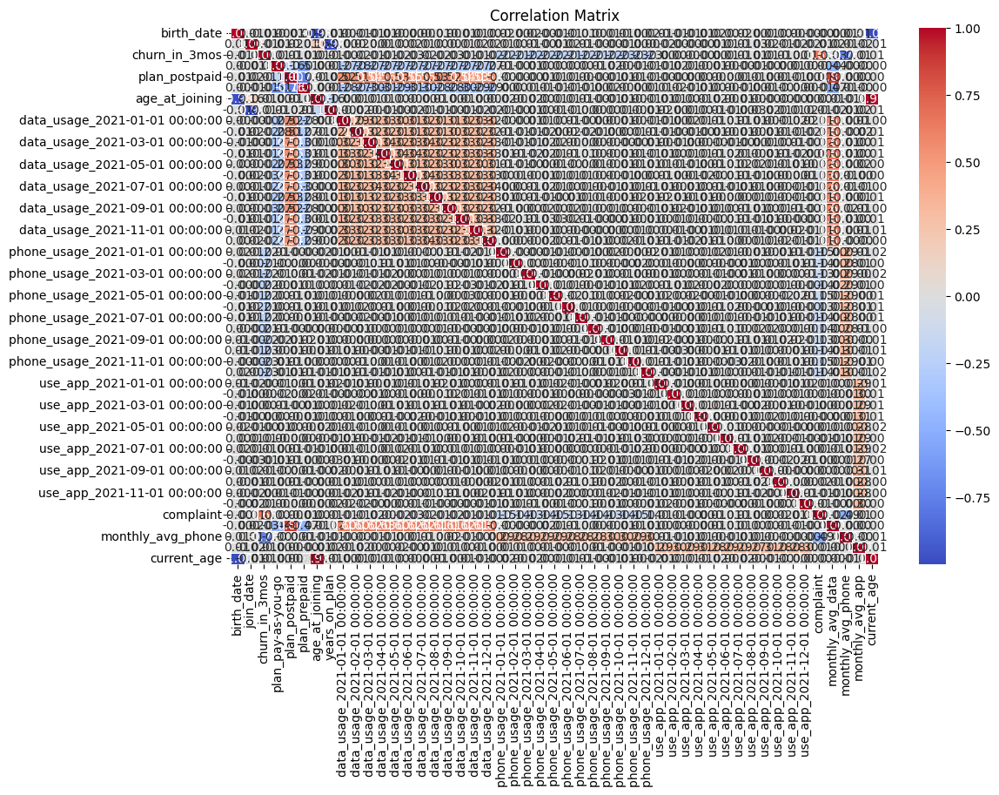

In [ ]:
# Correlation Matrix
correlation_matrix = merged_data.corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

In [ ]:
# Impossible to read, so we decided to import it as an excel, insights below:
correlation_matrix.to_excel("correlation_matrix.xlsx")

In [ ]:
# Correlation threshold
threshold = 0.6

# Find highly correlated feature pairs
high_corr_pairs = [(correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j])
                   for i in range(len(correlation_matrix.columns))
                   for j in range(i+1, len(correlation_matrix.columns))
                   if abs(correlation_matrix.iloc[i, j]) > threshold]

# Convert to DataFrame for easy interpretation
high_corr_df = pd.DataFrame(high_corr_pairs, columns=["Feature 1", "Feature 2", "Correlation"])

# Display the filtered features
print(high_corr_df)


                         Feature 1          Feature 2  Correlation
0                       birth_date     age_at_joining    -0.984740
1                       birth_date        current_age    -0.999582
2                        join_date      years_on_plan    -0.993366
3                    churn_in_3mos          complaint     0.649257
4                    churn_in_3mos  monthly_avg_phone    -0.760897
5                    plan_postpaid       plan_prepaid    -0.764588
6                    plan_postpaid   monthly_avg_data     0.871988
7                   age_at_joining        current_age     0.984854
8   data_usage_2021-01-01 00:00:00   monthly_avg_data     0.604636
9   data_usage_2021-02-01 00:00:00   monthly_avg_data     0.600729
10  data_usage_2021-03-01 00:00:00   monthly_avg_data     0.624235
11  data_usage_2021-04-01 00:00:00   monthly_avg_data     0.630273
12  data_usage_2021-05-01 00:00:00   monthly_avg_data     0.602628
13  data_usage_2021-06-01 00:00:00   monthly_avg_data     0.62

- Current_age and age_at_joining are both completely explained by birth_date (correlation very close to 1), so we can remove both variables
- Choose between joint_date and years_on_plan as having both is redundant
- Monthly_avg_data is correlated to a lot of features, decision on weather to keep it or delete the others

### Testing Area (Creating Quarterly averages for Data Usage)

Since the monthly average is quite correlated to each month data consumption, we thought that by creating quarterly averages we could reduce the number variables by at least three times, by dropping the monthly variables and the average monthly data variable.

Let's test out this theory:

In [ ]:
# Create a copy of the dataset for testing
merged_data_test = merged_data.copy()

# Identify phone and data usage columns
data_usage_cols = [col for col in merged_data_test.columns if "data_usage" in col]

# Convert column names to datetime format
data_usage_df = merged_data_test[data_usage_cols].copy()

data_usage_df.columns = pd.to_datetime(data_usage_df.columns.str.extract(r'(\d{4}-\d{2}-\d{2})')[0])

# Define trimester mapping (grouping months manually)
trimester_map = {
    1: "quarter_1", 2: "quarter_1", 3: "quarter_1",
    4: "quarter_2", 5: "quarter_2", 6: "quarter_2",
    7: "quarter_3", 8: "quarter_3", 9: "quarter_3",
    10: "quarter_4", 11: "quarter_4", 12: "quarter_4"
}

# Apply mapping to group data by trimester
data_usage_df = data_usage_df.groupby(data_usage_df.columns.month.map(trimester_map), axis=1).mean()

# Rename columns for clarity
data_usage_df.columns = [f'data_usage_{col}' for col in data_usage_df.columns]

# Merge back into test dataset
merged_data_test = pd.concat([merged_data_test, data_usage_df], axis=1)

# Display the updated dataset with correct trimester averages
print(merged_data_test.head())  # Preview the dataset

  birth_date  join_date  churn_in_3mos  plan_pay-as-you-go  plan_postpaid  \
0 1994-08-13 2015-11-22              0                   0              1   
1 1994-06-25 2015-01-12              1                   1              0   
2 2008-06-10 2020-05-22              0                   0              0   
3 1970-09-04 2017-11-10              0                   0              0   
4 1969-11-06 2019-05-19              0                   0              0   

   plan_prepaid  age_at_joining  years_on_plan  \
0             0              21              6   
1             0              20              6   
2             1              11              1   
3             1              47              4   
4             1              49              2   

   data_usage_2021-01-01 00:00:00  data_usage_2021-02-01 00:00:00  \
0                           43.61                          115.97   
1                            2.07                           13.87   
2                           4

<ipython-input-108-b96869495e9a>:21: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  data_usage_df = data_usage_df.groupby(data_usage_df.columns.month.map(trimester_map), axis=1).mean()


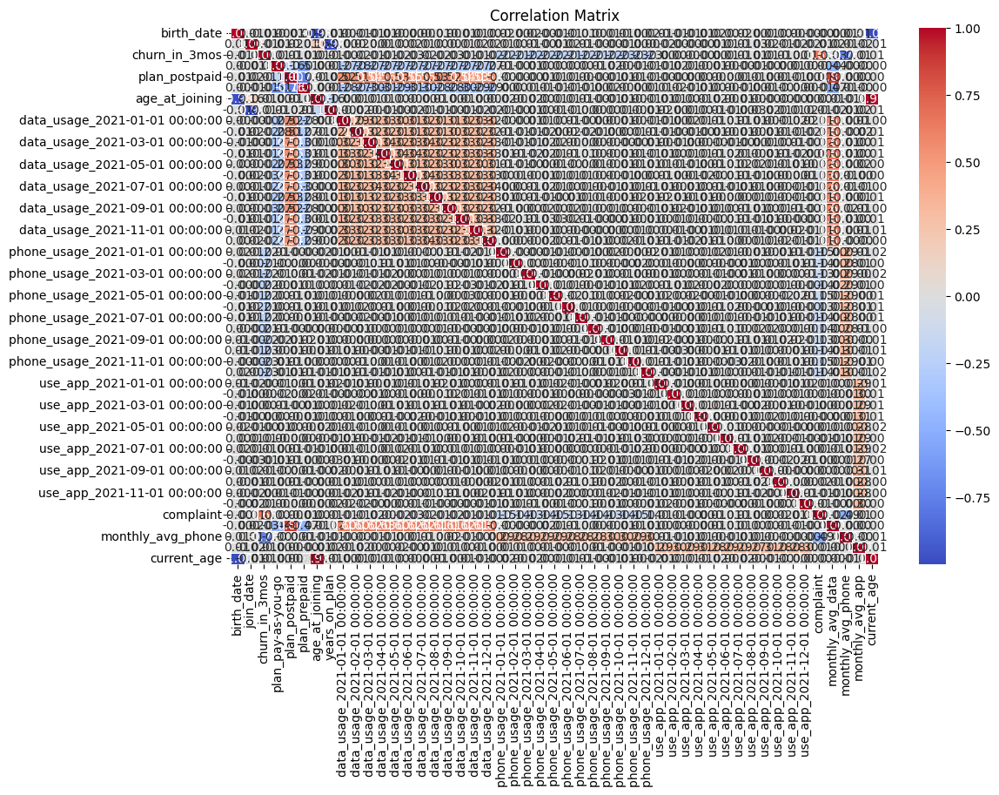

In [ ]:
# Correlation Matrix
correlation_matrix_test = merged_data_test.corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

In [ ]:
# Correlation threshold
threshold = 0.7

# Find highly correlated feature pairs
high_corr_pairs = [(correlation_matrix_test.columns[i], correlation_matrix_test.columns[j], correlation_matrix_test.iloc[i, j])
                   for i in range(len(correlation_matrix_test.columns))
                   for j in range(i+1, len(correlation_matrix_test.columns))
                   if abs(correlation_matrix_test.iloc[i, j]) > threshold]

# Convert to DataFrame for easy interpretation
high_corr_df = pd.DataFrame(high_corr_pairs, columns=["Feature 1", "Feature 2", "Correlation"])

# Display the filtered features
print(high_corr_df)

                         Feature 1             Feature 2  Correlation
0                       birth_date        age_at_joining    -0.984740
1                       birth_date           current_age    -0.999582
2                        join_date         years_on_plan    -0.993366
3                    churn_in_3mos     monthly_avg_phone    -0.760897
4                    plan_postpaid          plan_prepaid    -0.764588
5                    plan_postpaid      monthly_avg_data     0.871988
6                    plan_postpaid  data_usage_quarter_1     0.718417
7                    plan_postpaid  data_usage_quarter_2     0.733150
8                    plan_postpaid  data_usage_quarter_3     0.721790
9                    plan_postpaid  data_usage_quarter_4     0.725477
10                  age_at_joining           current_age     0.984854
11  data_usage_2021-01-01 00:00:00  data_usage_quarter_1     0.730042
12  data_usage_2021-02-01 00:00:00  data_usage_quarter_1     0.724278
13  data_usage_2021-

In [ ]:
merged_data_test.drop(columns=['age_at_joining','birth_date','join_date','monthly_avg_phone','monthly_avg_data', 'plan_postpaid'], inplace=True)

data_usage_monthly_cols = [col for col in merged_data_test.columns if col.startswith('data_usage_20')]
columns_to_drop.extend(data_usage_monthly_cols)

merged_data_test.drop(columns=columns_to_drop, inplace=True, errors='ignore')

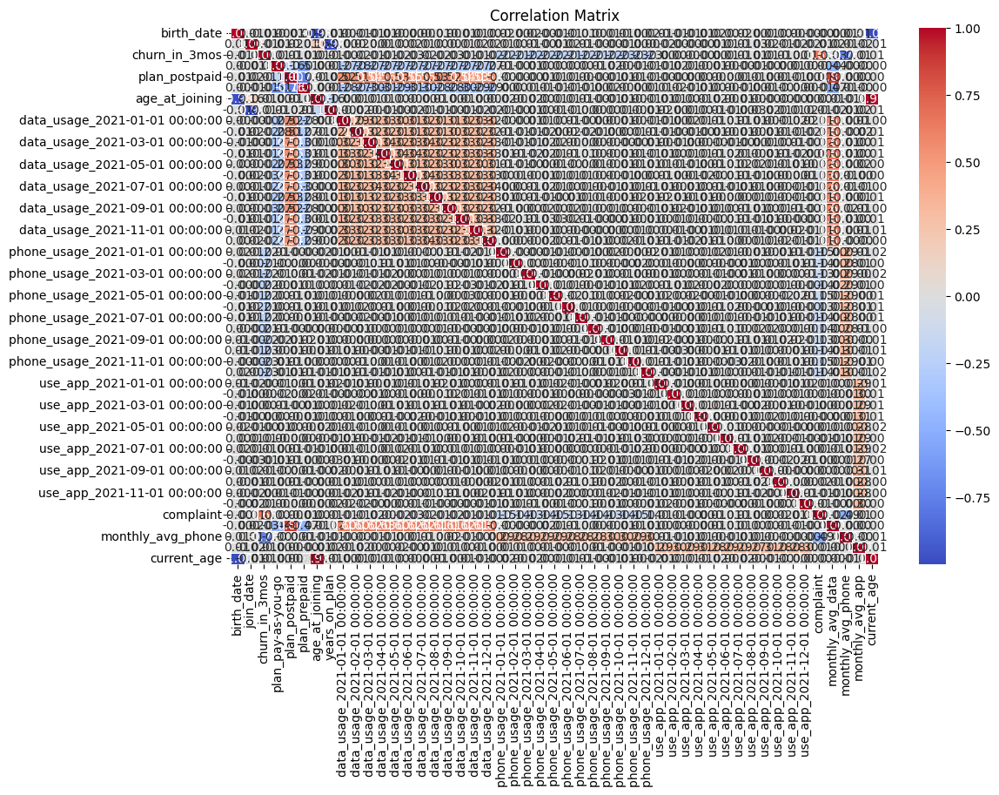

In [ ]:
# Correlation Matrix
correlation_matrix_test = merged_data_test.corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

In [ ]:
# Correlation threshold
threshold = 0.7

# Find highly correlated feature pairs
high_corr_pairs = [(correlation_matrix_test.columns[i], correlation_matrix_test.columns[j], correlation_matrix_test.iloc[i, j])
                   for i in range(len(correlation_matrix_test.columns))
                   for j in range(i+1, len(correlation_matrix_test.columns))
                   if abs(correlation_matrix_test.iloc[i, j]) > threshold]

# Convert to DataFrame for easy interpretation
high_corr_df = pd.DataFrame(high_corr_pairs, columns=["Feature 1", "Feature 2", "Correlation"])

# Display the filtered features
print(high_corr_df)

Empty DataFrame
Columns: [Feature 1, Feature 2, Correlation]
Index: []


We are happy with the result, by dropping unnecessary variables, categorical variables, and creating a quarterly average data usage variable we reduced the number of variables by 29, and at the moment we have no variable above 0.7 correlation.

In [ ]:
print(f"Number of columns: {merged_data_test.shape[1]}")

Number of columns: 35


Since the test was successful, let's re-name the variable merged_data

In [ ]:
merged_data = merged_data_test

In [ ]:
merged_data.head(5)

,churn_in_3mos,plan_pay-as-you-go,plan_prepaid,years_on_plan,phone_usage_2021-01-01 00:00:00,phone_usage_2021-02-01 00:00:00,phone_usage_2021-03-01 00:00:00,phone_usage_2021-04-01 00:00:00,phone_usage_2021-05-01 00:00:00,phone_usage_2021-06-01 00:00:00,phone_usage_2021-07-01 00:00:00,phone_usage_2021-08-01 00:00:00,phone_usage_2021-09-01 00:00:00,phone_usage_2021-10-01 00:00:00,phone_usage_2021-11-01 00:00:00,phone_usage_2021-12-01 00:00:00,use_app_2021-01-01 00:00:00,use_app_2021-02-01 00:00:00,use_app_2021-03-01 00:00:00,use_app_2021-04-01 00:00:00,use_app_2021-05-01 00:00:00,use_app_2021-06-01 00:00:00,use_app_2021-07-01 00:00:00,use_app_2021-08-01 00:00:00,use_app_2021-09-01 00:00:00,use_app_2021-10-01 00:00:00,use_app_2021-11-01 00:00:00,use_app_2021-12-01 00:00:00,complaint,monthly_avg_app,current_age,data_usage_quarter_1,data_usage_quarter_2,data_usage_quarter_3,data_usage_quarter_4
0,0,0,0,6,4570.12,4589.49,835.60,4398.57,1060.44,703.84,596.48,4590.48,1934.41,4706.93,4217.64,4010.24,1,1,0,1,0,0,1,1,1,1,1,0,0,0.666667,27,81.260000,60.736667,93.640000,72.026667
1,1,1,0,6,2038.61,1952.95,1762.70,1383.54,217.01,174.23,1983.84,799.41,3371.37,2168.73,227.18,4920.68,0,1,1,1,1,1,1,1,1,1,1,1,1,0.916667,26,9.350000,12.226667,11.963333,15.606667
2,0,0,1,1,1786.97,4118.81,3137.10,1736.49,3278.96,1962.14,2801.82,166.68,4878.91,4089.35,1397.95,4926.51,1,0,1,0,0,1,0,0,1,1,1,1,0,0.583333,12,39.936667,36.990000,36.623333,33.316667
3,0,0,1,4,2450.95,1551.45,2738.69,3627.57,4662.40,1018.62,1742.39,2876.11,1795.95,720.50,4444.18,3381.92,1,1,1,1,1,0,1,1,1,1,1,1,0,0.916667,51,31.603333,34.980000,29.893333,30.450000
4,0,0,1,2,4627.57,1785.52,4617.92,2639.51,2159.29,3285.00,2919.12,4636.01,186.52,243.33,2102.91,236.99,1,1,0,1,1,1,1,1,0,1,0,1,1,0.750000,51,27.556667,35.826667,43.010000,37.613333


Note: check if monthly_avg_app is needed

## Model Selection

### PYCARET

In [ ]:
# Drop the 'Unnamed: 0' column
merged_data = merged_data.drop(columns=['Unnamed: 0'], errors='ignore')

In [ ]:
!pip install pycaret

In [ ]:
from pycaret.classification import *
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Define categorical columns that need encoding
# categorical_features = ['category']

# Apply Label Encoding to categorical features
# label_encoder = LabelEncoder()
# for col in categorical_features:
 #   merged_data[col] = label_encoder.fit_transform(merged_data[col])

# One-hot encode plan types (binary categorical variables)
# merged_data = pd.get_dummies(merged_data, columns=['plan_pay-as-you-go', 'plan_postpaid', 'plan_prepaid'], drop_first=True)

# Define target variable
target = 'churn_in_3mos'

# Splitting the dataset
train_data, test_data = train_test_split(merged_data, test_size=0.2, random_state=42)

# Initialize PyCaret without explicit categorical encoding (since it's preprocessed)
clf = setup(
    data=train_data,
    target=target,
    session_id=123,
    normalize=True,
    #ignore_features=['birth_date', 'join_date']
)

# Compare models and select the best one
best_model = compare_models()

,Description,Value
0,Session id,123
1,Target,churn_in_3mos
2,Target type,Binary
3,Original data shape,"(8000, 35)"
4,Transformed data shape,"(8000, 35)"
5,Transformed train set shape,"(5600, 35)"
6,Transformed test set shape,"(2400, 35)"
7,Numeric features,34
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9884,0.9995,0.9783,0.9836,0.9809,0.9726,0.9726,1.1180
svm,SVM - Linear Kernel,0.9875,0.9993,0.9789,0.9802,0.9795,0.9705,0.9706,0.0510
ada,Ada Boost Classifier,0.9520,0.9898,0.9064,0.9345,0.9200,0.8857,0.8861,0.7790
xgboost,Extreme Gradient Boosting,0.9432,0.9872,0.8800,0.9306,0.9043,0.8640,0.8649,0.5370
qda,Quadratic Discriminant Analysis,0.9427,0.9873,0.8900,0.9203,0.9044,0.8635,0.8642,0.0440
lightgbm,Light Gradient Boosting Machine,0.9354,0.9834,0.8742,0.9106,0.8917,0.8457,0.8463,1.4750
ridge,Ridge Classifier,0.9316,0.9895,0.8871,0.8887,0.8878,0.8386,0.8387,0.0430
lda,Linear Discriminant Analysis,0.9316,0.9895,0.8912,0.8855,0.8883,0.8390,0.8391,0.0450
gbc,Gradient Boosting Classifier,0.9282,0.9806,0.8561,0.9038,0.8790,0.8280,0.8289,2.9500
rf,Random Forest Classifier,0.9134,0.9692,0.8204,0.8873,0.8523,0.7912,0.7926,1.2900


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
# Evaluate the best model on the test set
test_results = predict_model(best_model, data=test_data)

# Show test results
evaluate_model(best_model)

# Get detailed metrics
metrics = pull()
print(metrics)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.9890,0.9996,0.9775,0.9870,0.9823,0.9743,0.9743


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

                 Model  Accuracy     AUC  Recall  Prec.      F1   Kappa  \
0  Logistic Regression     0.989  0.9996  0.9775  0.987  0.9823  0.9743   

      MCC  
0  0.9743  


In [ ]:
# Evaluate the best model on the test set
test_results = predict_model(best_model, data=test_data)

# Display test results
from pycaret.classification import evaluate_model

# Interactive model evaluation (confusion matrix, AUC, feature importance, etc.)
evaluate_model(best_model)

# Extract detailed test metrics
metrics = pull()
print(metrics)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.9890,0.9996,0.9775,0.9870,0.9823,0.9743,0.9743


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

                 Model  Accuracy     AUC  Recall  Prec.      F1   Kappa  \
0  Logistic Regression     0.989  0.9996  0.9775  0.987  0.9823  0.9743   

      MCC  
0  0.9743  


In [ ]:
# Tune hyperparameters of the best model
tuned_model = tune_model(best_model, optimize='AUC', n_iter=50)

# Evaluate the tuned model on the test set
test_results_tuned = predict_model(tuned_model, data=test_data)

# Interactive model evaluation after tuning
evaluate_model(tuned_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9929,0.9998,0.9882,0.9882,0.9882,0.9831,0.9831
1,0.9946,0.9997,1.0000,0.9828,0.9913,0.9874,0.9875
2,0.9875,0.9998,1.0000,0.9607,0.9799,0.9709,0.9713
3,0.9964,1.0000,1.0000,0.9884,0.9942,0.9916,0.9916
4,0.9893,0.9998,0.9942,0.9714,0.9827,0.9749,0.9750
5,0.9857,0.9993,1.0000,0.9553,0.9771,0.9668,0.9673
6,0.9982,0.9999,1.0000,0.9942,0.9971,0.9958,0.9958
7,0.9929,0.9999,0.9942,0.9827,0.9884,0.9832,0.9833
8,0.9964,1.0000,0.9942,0.9942,0.9942,0.9916,0.9916


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 50 candidates, totalling 500 fits


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.9905,0.9997,0.9936,0.9763,0.9849,0.9780,0.9780


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
test_results = predict_model(best_model, data=test_data)
evaluate_model(best_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.9890,0.9996,0.9775,0.9870,0.9823,0.9743,0.9743


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
!pip install scikit-optimize

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 5.0 MB/s eta 0:00:00


In [ ]:
# Finalize the model (trains on the full dataset)
final_model = finalize_model(tuned_model)

# Save the final model
save_model(final_model, 'final_churn_model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['plan_pay-as-you-go',
                                              'plan_prepaid', 'years_on_plan',
                                              'phone_usage_2021-01-01 00:00:00',
                                              'phone_usage_2021-02-01 00:00:00',
                                              'phone_usage_2021-03-01 00:00:00',
                                              'phone_usage_2021-04-01 00:00:00',
                                              'phone_usage_2021-05-01 00:00:00',
                                              'phone_usage_2021-06-01 00:...
                  TransformerWrapper(exclude=None, include=None,
                                     transformer=CleanColumnNames(match='[\\]\\[\\,\\{\\}\\"\\:]+'))),
                 ('actual_estimator',
                  LogisticRegressio

In [ ]:
from pycaret.classification import *
from sklearn.metrics import classification_report, roc_auc_score

# Predict on train data
train_predictions = predict_model(best_model, data=train_data)
test_predictions = predict_model(best_model, data=test_data)

# Extract actual and predicted values using 'prediction_label' column
train_actual = train_predictions[target]
train_predicted = train_predictions['prediction_label']  # Correct column name

test_actual = test_predictions[target]
test_predicted = test_predictions['prediction_label']  # Correct column name

# Generate classification reports
train_report = classification_report(train_actual, train_predicted)
test_report = classification_report(test_actual, test_predicted)

# Compute AUC-ROC scores
train_auc = roc_auc_score(train_actual, train_predicted)
test_auc = roc_auc_score(test_actual, test_predicted)

# Print reports and AUC scores
print("===== Train Classification Report =====")
print(train_report)
print(f"Train AUC-ROC Score: {train_auc:.4f}\n")

print("===== Test Classification Report =====")
print(test_report)
print(f"Test AUC-ROC Score: {test_auc:.4f}")

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.9891,0.9995,0.9799,0.9844,0.9821,0.9743,0.9743


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.9890,0.9996,0.9775,0.9870,0.9823,0.9743,0.9743


===== Train Classification Report =====
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      5559
           1       0.98      0.98      0.98      2441

    accuracy                           0.99      8000
   macro avg       0.99      0.99      0.99      8000
weighted avg       0.99      0.99      0.99      8000

Train AUC-ROC Score: 0.9865

===== Test Classification Report =====
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1377
           1       0.99      0.98      0.98       623

    accuracy                           0.99      2000
   macro avg       0.99      0.99      0.99      2000
weighted avg       0.99      0.99      0.99      2000

Test AUC-ROC Score: 0.9859


### SHAP Feature Evaluation

In [ ]:
print(final_model.named_steps.keys())


dict_keys(['numerical_imputer', 'categorical_imputer', 'normalize', 'clean_column_names', 'actual_estimator'])


In [ ]:
# Extract the model
model = final_model.named_steps["actual_estimator"]

print(type(model))

<class 'sklearn.linear_model._logistic.LogisticRegression'>


In [ ]:
!pip install shap

In [ ]:
X_train = get_config('X_train_transformed')  # Extract transformed training features

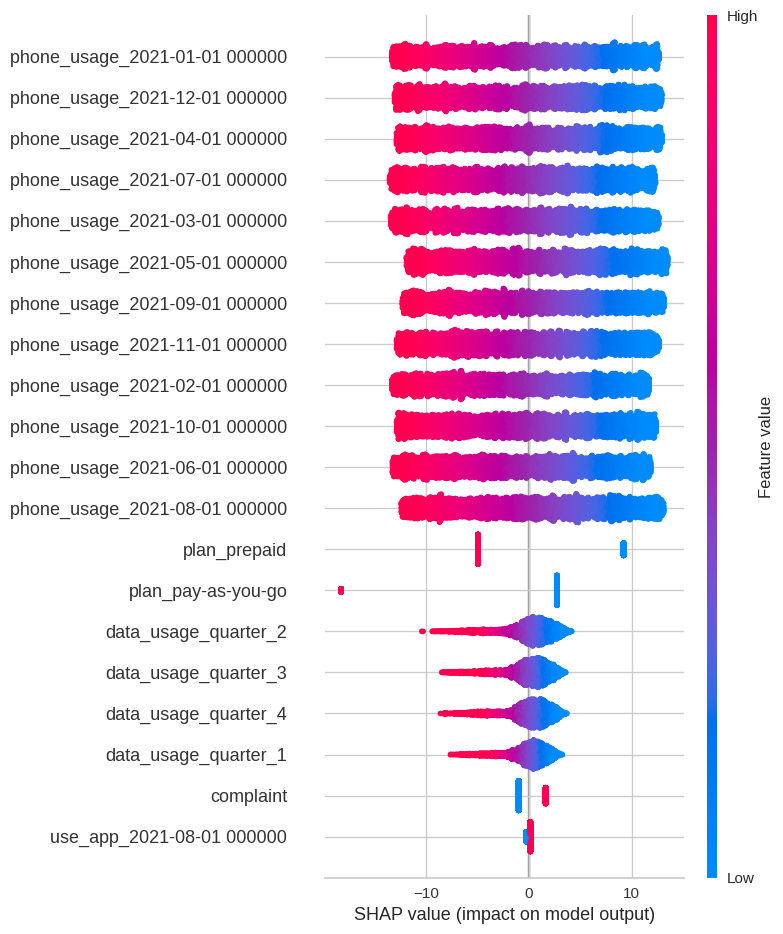

In [ ]:
import shap
import matplotlib.pyplot as plt

# Use LinearExplainer instead of generic Explainer
explainer = shap.LinearExplainer(final_model, X_train, feature_perturbation="interventional")

# Compute SHAP values
shap_values = explainer.shap_values(X_train)

# SHAP Summary Plot
shap.summary_plot(shap_values, X_train)

In [ ]:
# Convert SHAP values into a DataFrame directly
shap_df = pd.DataFrame(shap_values, columns=X_train.columns)

# Compute mean absolute SHAP values (importance)
shap_importance = shap_df.abs().mean().sort_values(ascending=False)

# Convert to DataFrame for display
shap_importance_df = pd.DataFrame({
    "Feature": shap_importance.index,
    "Mean |SHAP Value|": shap_importance.values
})

# Display the first 35 rows
print(shap_importance_df.head(35))

                          Feature  Mean |SHAP Value|
0   phone_usage_2021-01-01 000000           6.561945
1   phone_usage_2021-12-01 000000           6.531797
2   phone_usage_2021-04-01 000000           6.513311
3   phone_usage_2021-07-01 000000           6.461820
4   phone_usage_2021-03-01 000000           6.440969
5   phone_usage_2021-05-01 000000           6.432144
6   phone_usage_2021-09-01 000000           6.396292
7   phone_usage_2021-11-01 000000           6.370820
8   phone_usage_2021-02-01 000000           6.366568
9   phone_usage_2021-10-01 000000           6.366379
10  phone_usage_2021-06-01 000000           6.363575
11  phone_usage_2021-08-01 000000           6.336589
12                   plan_prepaid           6.222710
13             plan_pay-as-you-go           4.222659
14           data_usage_quarter_2           1.754703
15           data_usage_quarter_3           1.572192
16           data_usage_quarter_4           1.568786
17           data_usage_quarter_1           1.

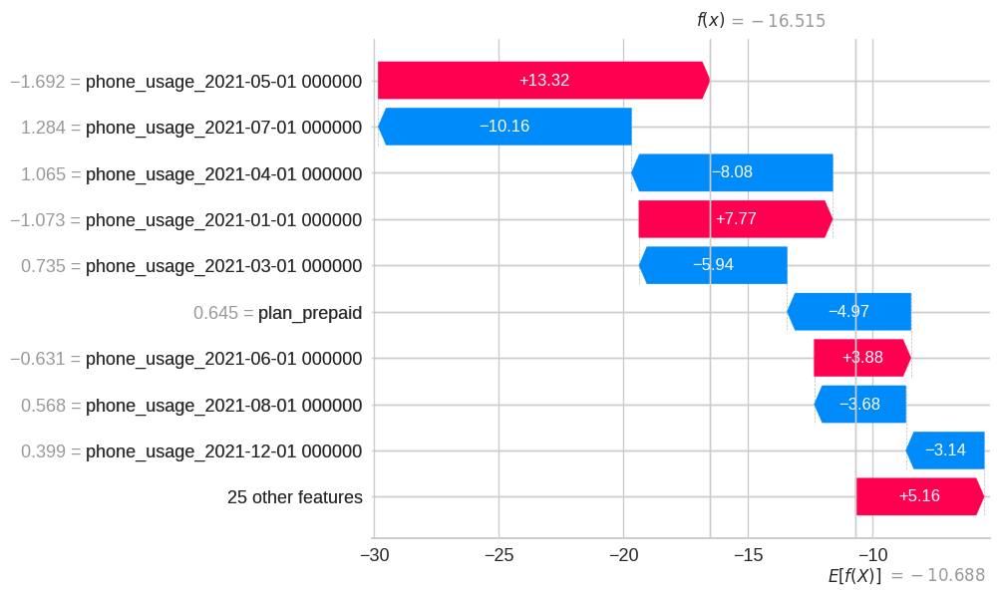

In [ ]:
# Convert SHAP values into Explanation object with proper feature names
shap_values_exp = shap.Explanation(
    values=shap_values,
    base_values=explainer.expected_value,
    data=X_train,  # Ensures correct feature values are displayed
    feature_names=X_train.columns  # Ensures correct feature names are displayed
)

# Selecting an instance (e.g., first sample)
instance_idx = 0  # Change this to analyze different samples
shap_value_instance = shap_values_exp[instance_idx]

# Plot SHAP waterfall with correct feature names
shap.plots.waterfall(shap_value_instance)


This is interesting, because we had hypothesized that due to their shared high influence monthly usage data could be correlated. What this plot says is that some monthly data influences the production in opposite ways, with also diverging proportion.

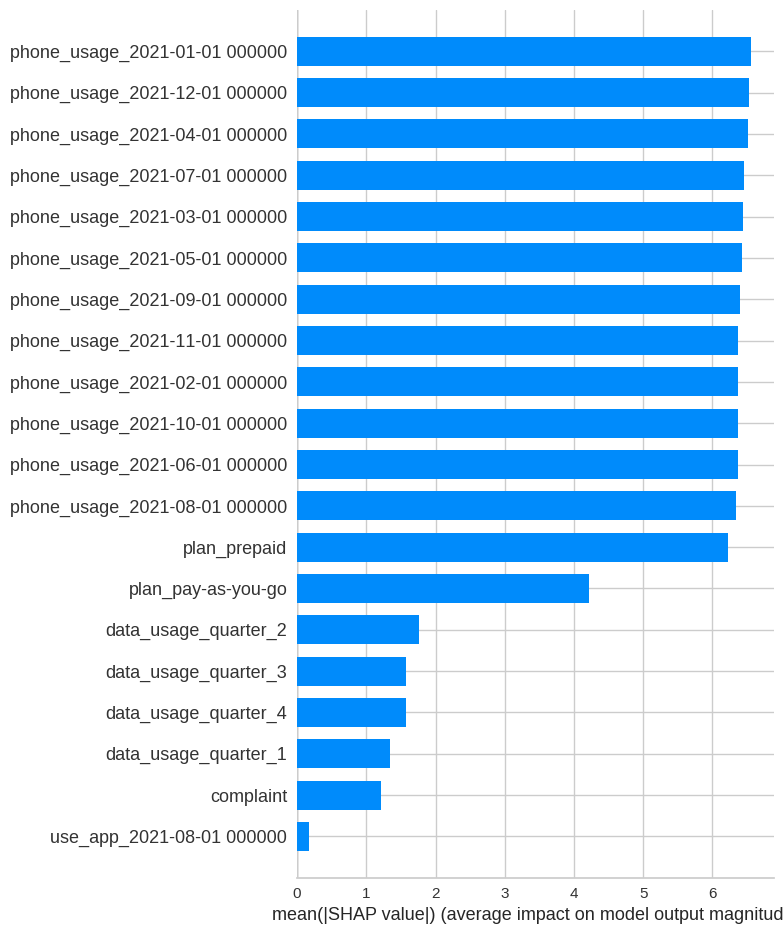

In [ ]:
# Bar plot for mean absolute SHAP values
shap.summary_plot(shap_values_exp, X_train, plot_type="bar")

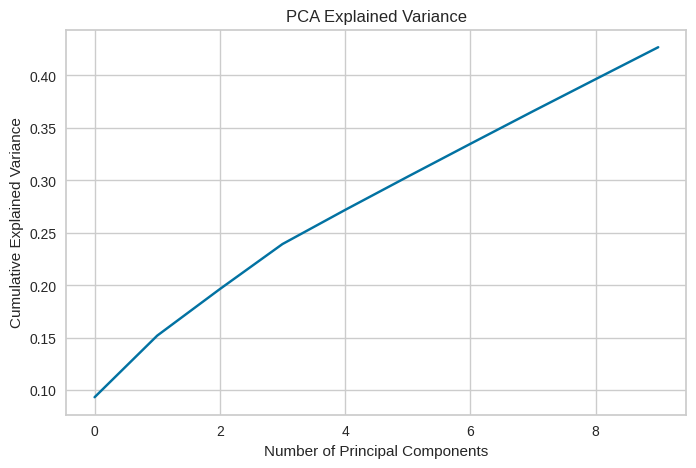

In [ ]:
from sklearn.decomposition import PCA

# Fitting PCA on the training dataset (assuming X_train contains your phone usage features)
pca = PCA(n_components=10)  # Adjust number of components if needed
pca.fit(X_train)

# Plotting explained variance
plt.figure(figsize=(8,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.show()


The cumulative variance increases gradually and linearly:
- Even with 9 principal components, the cumulative variance is still below 50% (~0.45).

**This suggests that many components are needed to explain a significant portion of the variance.**

What This Means for Feature Reduction:

- Since no sharp elbow is visible in the plot, no small subset of principal components explains most of the variance.
- We could might still [possibly] reduce dimensions, but you may need many components to preserve information.


### Pycaret (Post-Shap)

In [ ]:
# Dropping non-relevant variables after SHAP feature evaluation:
app_usage_monthly_cols = [col for col in merged_data.columns if col.startswith('use_app_20')]
columns_to_drop.extend(app_usage_monthly_cols)

merged_data.drop(columns=columns_to_drop, inplace=True, errors='ignore')

In [ ]:
merged_data

,churn_in_3mos,plan_pay-as-you-go,plan_prepaid,years_on_plan,phone_usage_2021-01-01 00:00:00,phone_usage_2021-02-01 00:00:00,phone_usage_2021-03-01 00:00:00,phone_usage_2021-04-01 00:00:00,phone_usage_2021-05-01 00:00:00,phone_usage_2021-06-01 00:00:00,...,phone_usage_2021-10-01 00:00:00,phone_usage_2021-11-01 00:00:00,phone_usage_2021-12-01 00:00:00,complaint,monthly_avg_app,current_age,data_usage_quarter_1,data_usage_quarter_2,data_usage_quarter_3,data_usage_quarter_4
0,0,0,0,6,4570.12,4589.49,835.60,4398.57,1060.44,703.84,...,4706.93,4217.64,4010.24,0,0.666667,27,81.260000,60.736667,93.640000,72.026667
1,1,1,0,6,2038.61,1952.95,1762.70,1383.54,217.01,174.23,...,2168.73,227.18,4920.68,1,0.916667,26,9.350000,12.226667,11.963333,15.606667
2,0,0,1,1,1786.97,4118.81,3137.10,1736.49,3278.96,1962.14,...,4089.35,1397.95,4926.51,0,0.583333,12,39.936667,36.990000,36.623333,33.316667
3,0,0,1,4,2450.95,1551.45,2738.69,3627.57,4662.40,1018.62,...,720.50,4444.18,3381.92,0,0.916667,51,31.603333,34.980000,29.893333,30.450000
4,0,0,1,2,4627.57,1785.52,4617.92,2639.51,2159.29,3285.00,...,243.33,2102.91,236.99,1,0.750000,51,27.556667,35.826667,43.010000,37.613333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,0,1,6,176.33,2347.89,794.46,285.20,1462.39,597.70,...,3454.54,4503.46,1733.67,1,0.666667,14,25.156667,26.930000,48.093333,25.506667
9996,0,0,1,3,2636.17,2960.40,2076.95,2106.95,3721.75,2504.46,...,1676.06,3344.52,4220.29,0,0.916667,39,24.996667,29.826667,46.963333,44.256667
9997,0,0,0,9,509.70,912.83,4649.21,370.82,4262.41,2247.21,...,793.92,3831.65,1659.82,0,0.666667,22,62.766667,98.150000,99.653333,53.806667
9998,0,0,0,6,3340.94,2361.35,4090.45,3010.06,1699.38,2924.75,...,4559.14,1423.28,4154.94,0,0.750000,28,45.883333,53.763333,67.570000,43.683333


In [ ]:
merged_data.drop(columns=['monthly_avg_app'], inplace=True)


In [ ]:
merged_data.drop(columns=['years_on_plan', 'current_age'], inplace=True)


In [ ]:
# Define target variable
target = 'churn_in_3mos'

# Splitting the dataset
train_data, test_data = train_test_split(merged_data, test_size=0.2, random_state=42)

# Initialize PyCaret without explicit categorical encoding (since it's preprocessed)
clf = setup(
    data=train_data,
    target=target,
    session_id=123,
    normalize=True,
    #ignore_features=['birth_date', 'join_date']
)

# Compare models and select the best one
best_model = compare_models()

,Description,Value
0,Session id,123
1,Target,churn_in_3mos
2,Target type,Binary
3,Original data shape,"(8000, 20)"
4,Transformed data shape,"(8000, 20)"
5,Transformed train set shape,"(5600, 20)"
6,Transformed test set shape,"(2400, 20)"
7,Numeric features,19
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
svm,SVM - Linear Kernel,0.9886,0.9995,0.9772,0.9853,0.9811,0.9729,0.9731,0.0870
lr,Logistic Regression,0.9875,0.9995,0.9766,0.9824,0.9794,0.9705,0.9705,0.0630
ada,Ada Boost Classifier,0.9520,0.9898,0.9064,0.9345,0.9200,0.8857,0.8861,1.1360
xgboost,Extreme Gradient Boosting,0.9455,0.9878,0.8917,0.9273,0.9089,0.8701,0.8707,0.3690
qda,Quadratic Discriminant Analysis,0.9438,0.9913,0.8958,0.9178,0.9065,0.8663,0.8666,0.1260
lightgbm,Light Gradient Boosting Machine,0.9364,0.9844,0.8777,0.9108,0.8937,0.8484,0.8489,1.2020
ridge,Ridge Classifier,0.9321,0.9896,0.8877,0.8898,0.8887,0.8399,0.8399,0.0830
lda,Linear Discriminant Analysis,0.9321,0.9896,0.8929,0.8858,0.8892,0.8403,0.8404,0.0610
gbc,Gradient Boosting Classifier,0.9291,0.9808,0.8578,0.9050,0.8806,0.8302,0.8310,2.9350
rf,Random Forest Classifier,0.9093,0.9665,0.8280,0.8688,0.8476,0.7831,0.7838,2.1340


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
# Evaluate the best model on the test set
test_results = predict_model(best_model, data=test_data)

# Show test results
evaluate_model(best_model)

# Get detailed metrics
metrics = pull()
print(metrics)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.9890,0.9863,0.9791,0.9855,0.9823,0.9743,0.9743


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

                 Model  Accuracy     AUC  Recall   Prec.      F1   Kappa  \
0  SVM - Linear Kernel     0.989  0.9863  0.9791  0.9855  0.9823  0.9743   

      MCC  
0  0.9743  


Model got worse by removing what appeared to be non-relevant variables according to the SHAP model (0.9863 AUC compared to 0.9996), across the board the model performs better with these variables.

###Pycaret Post Shap with stacked model

In [ ]:
from pycaret.classification import setup, create_model, tune_model, stack_models, evaluate_model, finalize_model, save_model

target = 'churn_in_3mos'

clf = setup(
    data=train_data,
    target=target,
    session_id=123,
    normalize=True,

)

model_lr = create_model('lr')         # Logistic Regression
model_svm = create_model('svm')       # SVM - Linear Kernel
model_xgb = create_model('xgboost')   # Extreme Gradient Boosting

tuned_lr = tune_model(model_lr, optimize='AUC', n_iter=50)
tuned_svm = tune_model(model_svm, optimize='AUC', n_iter=50)
tuned_xgb = tune_model(model_xgb, optimize='AUC', n_iter=50)

stacked_model = stack_models(
    estimator_list=[tuned_lr, tuned_svm, tuned_xgb],
    meta_model=tuned_lr,
    optimize='AUC',
    choose_better=True
)

evaluate_model(stacked_model)

,Description,Value
0,Session id,123
1,Target,churn_in_3mos
2,Target type,Binary
3,Original data shape,"(8000, 20)"
4,Transformed data shape,"(8000, 20)"
5,Transformed train set shape,"(5600, 20)"
6,Transformed test set shape,"(2400, 20)"
7,Numeric features,19
8,Preprocess,True
9,Imputation type,simple


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9857,0.9996,0.9647,0.9880,0.9762,0.9660,0.9661
1,0.9929,0.9998,0.9825,0.9941,0.9882,0.9831,0.9831
2,0.9911,0.9996,0.9942,0.9770,0.9855,0.9791,0.9791
3,0.9786,0.9991,0.9649,0.9649,0.9649,0.9495,0.9495
4,0.9875,0.9998,0.9825,0.9767,0.9796,0.9706,0.9706
5,0.9821,0.9990,0.9708,0.9708,0.9708,0.9579,0.9579
6,0.9893,0.9996,0.9766,0.9882,0.9824,0.9747,0.9747
7,0.9946,0.9999,0.9883,0.9941,0.9912,0.9874,0.9874
8,0.9911,0.9998,0.9883,0.9826,0.9854,0.9790,0.9790


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9821,0.9994,0.9647,0.9762,0.9704,0.9576,0.9577
1,0.9964,0.9997,0.9942,0.9942,0.9942,0.9916,0.9916
2,0.9875,0.9995,0.9883,0.9713,0.9797,0.9707,0.9708
3,0.9893,0.9998,0.9708,0.9940,0.9822,0.9746,0.9747
4,0.9929,0.9997,0.9883,0.9883,0.9883,0.9832,0.9832
5,0.9821,0.9987,0.9708,0.9708,0.9708,0.9579,0.9579
6,0.9893,0.9996,0.9708,0.9940,0.9822,0.9746,0.9747
7,0.9946,0.9999,1.0000,0.9828,0.9913,0.9874,0.9875
8,0.9929,0.9997,0.9825,0.9941,0.9882,0.9831,0.9831


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9446,0.9845,0.8824,0.9317,0.9063,0.8671,0.8677
1,0.9554,0.9923,0.9006,0.9506,0.9249,0.8932,0.8939
2,0.9518,0.9910,0.9064,0.9337,0.9199,0.8854,0.8856
3,0.9500,0.9866,0.9181,0.9181,0.9181,0.8821,0.8821
4,0.9464,0.9898,0.9181,0.9075,0.9128,0.8741,0.8742
5,0.9304,0.9836,0.8363,0.9286,0.8800,0.8311,0.8334
6,0.9321,0.9845,0.8830,0.8935,0.8882,0.8395,0.8395
7,0.9536,0.9894,0.9064,0.9394,0.9226,0.8895,0.8898
8,0.9571,0.9911,0.9064,0.9509,0.9281,0.8976,0.8982


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9946,0.9999,0.9941,0.9883,0.9912,0.9874,0.9874
1,0.9929,0.9999,1.0000,0.9771,0.9884,0.9833,0.9834
2,0.9911,0.9998,1.0000,0.9716,0.9856,0.9791,0.9793
3,0.9911,0.9998,1.0000,0.9716,0.9856,0.9791,0.9793
4,0.9893,0.9998,0.9942,0.9714,0.9827,0.9749,0.9750
5,0.9911,0.9992,1.0000,0.9716,0.9856,0.9791,0.9793
6,0.9964,0.9998,0.9942,0.9942,0.9942,0.9916,0.9916
7,0.9964,0.9999,1.0000,0.9884,0.9942,0.9916,0.9916
8,0.9964,1.0000,1.0000,0.9884,0.9942,0.9916,0.9916


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 50 candidates, totalling 500 fits


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9946,0.9999,0.9882,0.9941,0.9912,0.9873,0.9873
1,0.9929,0.9998,1.0000,0.9771,0.9884,0.9833,0.9834
2,0.9893,0.9998,0.9942,0.9714,0.9827,0.9749,0.9750
3,0.9964,1.0000,0.9883,1.0000,0.9941,0.9916,0.9916
4,0.9929,0.9999,0.9883,0.9883,0.9883,0.9832,0.9832
5,0.9929,0.9992,0.9942,0.9827,0.9884,0.9832,0.9833
6,0.9946,0.9999,0.9883,0.9941,0.9912,0.9874,0.9874
7,0.9929,0.9998,0.9883,0.9883,0.9883,0.9832,0.9832
8,0.9964,1.0000,0.9942,0.9942,0.9942,0.9916,0.9916


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 50 candidates, totalling 500 fits


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8875,0.9943,0.9941,0.7316,0.8429,0.7584,0.7800
1,0.9036,0.9955,1.0000,0.7600,0.8636,0.7912,0.8090
2,0.9018,0.9961,1.0000,0.7566,0.8615,0.7876,0.8060
3,0.9107,0.9958,1.0000,0.7738,0.8724,0.8055,0.8212
4,0.8929,0.9963,0.9942,0.7424,0.8500,0.7694,0.7892
5,0.8964,0.9931,1.0000,0.7467,0.8550,0.7770,0.7971
6,0.8768,0.9951,1.0000,0.7125,0.8321,0.7391,0.7656
7,0.9196,0.9968,0.9942,0.7944,0.8831,0.8230,0.8351
8,0.9268,0.9960,1.0000,0.8066,0.8930,0.8383,0.8495


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 50 candidates, totalling 500 fits


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9929,0.9999,0.9941,0.9826,0.9883,0.9832,0.9832
1,0.9929,0.9999,1.0000,0.9771,0.9884,0.9833,0.9834
2,0.9911,0.9998,1.0000,0.9716,0.9856,0.9791,0.9793
3,0.9929,0.9999,1.0000,0.9771,0.9884,0.9833,0.9834
4,0.9946,0.9999,1.0000,0.9828,0.9913,0.9874,0.9875
5,0.9893,0.9992,1.0000,0.9661,0.9828,0.9750,0.9753
6,0.9964,0.9999,0.9942,0.9942,0.9942,0.9916,0.9916
7,0.9893,0.9998,0.9883,0.9769,0.9826,0.9748,0.9749
8,0.9982,1.0000,1.0000,0.9942,0.9971,0.9958,0.9958


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.9901,0.9871,0.9795,0.9880,0.9837,0.9767,0.9767


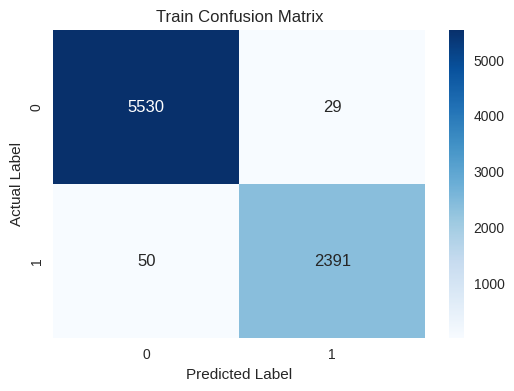

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.9890,0.9863,0.9791,0.9855,0.9823,0.9743,0.9743


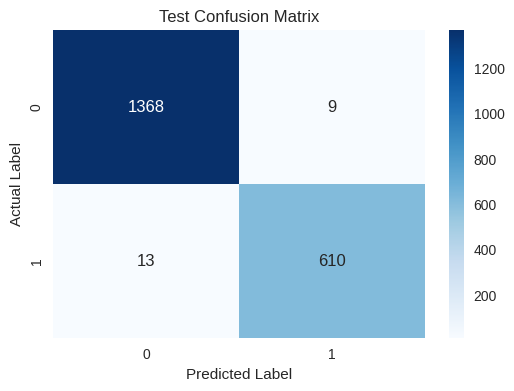

Train Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      5559
           1       0.99      0.98      0.98      2441

    accuracy                           0.99      8000
   macro avg       0.99      0.99      0.99      8000
weighted avg       0.99      0.99      0.99      8000

Test Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1377
           1       0.99      0.98      0.98       623

    accuracy                           0.99      2000
   macro avg       0.99      0.99      0.99      2000
weighted avg       0.99      0.99      0.99      2000



In [ ]:
from pycaret.classification import predict_model
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

train_predictions = predict_model(best_model, data=train_data)
train_actual = train_predictions[target]
train_predicted = train_predictions['prediction_label']

cm_train = confusion_matrix(train_actual, train_predicted)

plt.figure(figsize=(6, 4))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues')
plt.title("Train Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()


test_predictions = predict_model(best_model, data=test_data)
test_actual = test_predictions[target]
test_predicted = test_predictions['prediction_label']

cm_test = confusion_matrix(test_actual, test_predicted)

plt.figure(figsize=(6, 4))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues')
plt.title("Test Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

print("Train Classification Report:")
print(classification_report(train_actual, train_predicted))

print("Test Classification Report:")
print(classification_report(test_actual, test_predicted))

In [ ]:
from pycaret.classification import predict_model
from sklearn.metrics import accuracy_score

train_predictions = predict_model(best_model, data=train_data)
train_actual = train_predictions[target]
train_predicted = train_predictions['prediction_label']

train_accuracy = accuracy_score(train_actual, train_predicted) * 100

test_predictions = predict_model(best_model, data=test_data)
test_actual = test_predictions[target]
test_predicted = test_predictions['prediction_label']

test_accuracy = accuracy_score(test_actual, test_predicted) * 100

print(f"Train Accuracy: {train_accuracy:.2f}%")
print(f"Test Accuracy: {test_accuracy:.2f}%")

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.9901,0.9871,0.9795,0.9880,0.9837,0.9767,0.9767


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.9890,0.9863,0.9791,0.9855,0.9823,0.9743,0.9743


Train Accuracy: 99.01%
Test Accuracy: 98.90%


### Neural Network

In [156]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd

# Create a copy of merged_data to avoid modifying the original DataFrame
df = merged_data.copy()
df = df.select_dtypes(exclude=['datetime64[ns]'])

categorical_cols = ['plan_pay-as-you-go', 'plan_prepaid']  # plan_postpaid was removed
numerical_cols = [col for col in df.columns if col not in categorical_cols + ['churn_in_3mos']]

# One-hot encoding categorical variables
df = pd.get_dummies(df, columns=categorical_cols, drop_first=True)

# Standardizing numerical features
scaler = StandardScaler()
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

# Defining X and y
X = df.drop(columns=['churn_in_3mos'])
y = df['churn_in_3mos']

# Spliting the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [157]:
import numpy as np

# Converting input data to NumPy float32
X_train = np.array(X_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

# Train the model again
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9956 - loss: 0.0324 - val_accuracy: 0.9925 - val_loss: 0.0390
Epoch 2/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9981 - loss: 0.0268 - val_accuracy: 0.9940 - val_loss: 0.0383
Epoch 3/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9993 - loss: 0.0250 - val_accuracy: 0.9885 - val_loss: 0.0471
Epoch 4/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9976 - loss: 0.0281 - val_accuracy: 0.9915 - val_loss: 0.0405
Epoch 5/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9980 - loss: 0.0261 - val_accuracy: 0.9900 - val_loss: 0.0407
Epoch 6/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9971 - loss: 0.0282 - val_accuracy: 0.9915 - val_loss: 0.0438
Epoch 7/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9977 - loss: 0.0267 - val_accuracy: 0.9910 - val_loss: 0.0423
Epoch 8/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9965 - loss: 0.0275 - val_accuracy: 0.

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9954 - loss: 0.0358
Test Accuracy: 0.9955


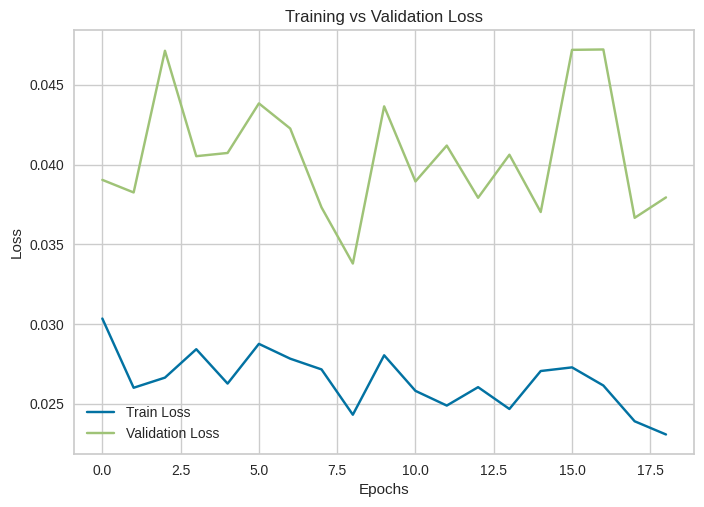

In [158]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy:.4f}")

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training vs Validation Loss')
plt.show()